# Load Data
Load the data from https://www.nature.com/articles/s41597-022-01156-1.pdf 

This Dataset contains Heaptpump Data and Electrical Load. We synthethesis a PV within the destrict PV.

In [1]:
# imports
import requests
import h5py
import pandas as pd
from io import BytesIO
from tqdm.notebook import tqdm
# mathplotlib
import matplotlib.pyplot as plt
import os
import io

In [2]:
# hdf5 1min data
hdf5_2018 = 'https://zenodo.org/records/5642902/files/2018_data_1min.zip?download=1'
hdf5_2019 = 'https://zenodo.org/records/5642902/files/2019_data_1min.zip?download=1'
hdf5_2020 = 'https://zenodo.org/records/5642902/files/2020_data_1min.zip?download=1'

hdf5_1min = [hdf5_2018, hdf5_2019, hdf5_2020]

# hdf5 15 min data
hdf5_2018_15min = 'https://zenodo.org/records/5642902/files/2018_data_15min.hdf5?download=1'
hdf5_2019_15min = 'https://zenodo.org/records/5642902/files/2019_data_15min.hdf5?download=1'
hdf5_2020_15min = 'https://zenodo.org/records/5642902/files/2020_data_15min.hdf5?download=1'

hdf5_15min = [hdf5_2018_15min, hdf5_2019_15min, hdf5_2020_15min]


# hdf5 1h data
hdf5_2018_1h = 'https://zenodo.org/records/5642902/files/2018_data_60min.hdf5?download=1'
hdf5_2019_1h = 'https://zenodo.org/records/5642902/files/2019_data_60min.hdf5?download=1'
hdf5_2020_1h = 'https://zenodo.org/records/5642902/files/2020_data_60min.hdf5?download=1'

hdf5_1h = [hdf5_2018_1h, hdf5_2019_1h, hdf5_2020_1h]

# weather data

In [3]:
def download_hdf5(url: str) -> BytesIO:
    """
    Downloads an HDF5 file from a URL with a progress bar and returns a BytesIO buffer.
    """
    response = requests.get(url, stream=True)
    response.raise_for_status()

    total_size = int(response.headers.get('content-length', 0))
    chunk_size = 1024 * 1024  # 1 MB
    buffer = BytesIO()

    with tqdm(total=total_size, unit='B', unit_scale=True, unit_divisor=1024,
              desc=f"Downloading {url.split('/')[-1]}") as pbar:
        for chunk in response.iter_content(chunk_size=chunk_size):
            if chunk:  # filter out keep-alive chunks
                buffer.write(chunk)
                pbar.update(len(chunk))

    buffer.seek(0)  # Reset pointer to beginning
    return buffer

In [4]:

import os
import io
import zipfile
from tqdm import tqdm
from urllib.parse import urlparse

def download_all_data(resolution_name, urls, save_dir):
    """
    Downloads all files for a given resolution. Detects and extracts HDF5 files from ZIPs if needed.
    Skips already existing downloads, reuses local files, and returns a list of BytesIO buffers (HDF5 only).
    """
    print(f"\nDownloading {resolution_name} data...")
    os.makedirs(save_dir, exist_ok=True)
    hdf5_buffers = []

    for hdf_url in tqdm(urls, desc=f"{resolution_name}"):
        local_filename = os.path.join(save_dir, os.path.basename(urlparse(hdf_url).path))

        if os.path.exists(local_filename):
            tqdm.write(f"Skipping (already exists): {local_filename}")
            with open(local_filename, 'rb') as f:
                raw_buffer = io.BytesIO(f.read())
        else:
            raw_buffer = download_hdf5(hdf_url)
            with open(local_filename, 'wb') as f:
                f.write(raw_buffer.getbuffer())
            raw_buffer.seek(0)

        # Check if file is a ZIP
        raw_buffer.seek(0)
        file_header = raw_buffer.read(4)
        raw_buffer.seek(0)

        if file_header == b'PK\x03\x04':  # ZIP signature
            with zipfile.ZipFile(raw_buffer) as zf:
                for file_info in zf.infolist():
                    if file_info.filename.endswith(('.h5', '.hdf5')):
                        tqdm.write(f"Extracting {file_info.filename} from ZIP...")
                        with zf.open(file_info) as h5_file:
                            hdf5_buffers.append(io.BytesIO(h5_file.read()))
        else:
            hdf5_buffers.append(raw_buffer)

    print(f"{len(hdf5_buffers)} HDF5 files ready for use.")
    return hdf5_buffers


# Download and save for all resolutions
data_1min = download_all_data("1 minute", hdf5_1min, "raw_data/1min")
data_15min = download_all_data("15 minute", hdf5_15min, "raw_data/15min")
data_1h = download_all_data("1 hour", hdf5_1h, "raw_data/60min")

1 minute:   0%|          | 0/3 [00:00<?, ?it/s]

Skipping (already exists): raw_data/1min/2018_data_1min.zip


1 minute:   0%|          | 0/3 [00:00<?, ?it/s]

Extracting 2018_data_1min.hdf5 from ZIP...


1 minute:  33%|███▎      | 1/3 [00:21<00:42, 21.23s/it]

Skipping (already exists): raw_data/1min/2019_data_1min.zip


1 minute:  33%|███▎      | 1/3 [00:22<00:42, 21.23s/it]

Extracting 2019_data_1min.hdf5 from ZIP...


1 minute:  67%|██████▋   | 2/3 [00:48<00:25, 25.01s/it]

Skipping (already exists): raw_data/1min/2020_data_1min.zip


1 minute:  67%|██████▋   | 2/3 [00:49<00:25, 25.01s/it]

Extracting 2020_data_1min.hdf5 from ZIP...


1 minute: 100%|██████████| 3/3 [01:14<00:00, 24.94s/it]


3 HDF5 files ready for use.



15 minute:  33%|███▎      | 1/3 [00:00<00:00,  7.10it/s]

Skipping (already exists): raw_data/15min/2018_data_15min.hdf5
Skipping (already exists): raw_data/15min/2019_data_15min.hdf5


15 minute: 100%|██████████| 3/3 [00:00<00:00,  7.47it/s]


Skipping (already exists): raw_data/15min/2020_data_15min.hdf5
3 HDF5 files ready for use.



1 hour:   0%|          | 0/3 [00:00<?, ?it/s]

Skipping (already exists): raw_data/60min/2018_data_60min.hdf5
Skipping (already exists): raw_data/60min/2019_data_60min.hdf5
Skipping (already exists): raw_data/60min/2020_data_60min.hdf5


1 hour: 100%|██████████| 3/3 [00:00<00:00, 30.62it/s]

3 HDF5 files ready for use.


# Functions

In [5]:

def concat_dataframes_unique_index(df_list):
    # Combine all indices into a single Series
    all_indices = pd.concat([df.index.to_series() for df in df_list], ignore_index=True)

    # Convert to UTC datetime
    utc_indices = pd.to_datetime(all_indices, unit='s', utc=True)

    #
    # Checking a lot of stuff about the indices
    #

    # Sanity check for UTC conversion
    assert utc_indices.notnull().all(), "Some indices could not be converted to UTC timestamps"
    assert str(utc_indices.dt.tz) == 'UTC', "Indices are not in UTC timezone."
    # Sanity check for duplicates
    assert len(utc_indices) == utc_indices.nunique(), "Duplicate index values found across dataframes."
    # Check if all indices are sorted
    assert utc_indices.is_monotonic_increasing, "Indices are not sorted in increasing order."
    # Check if they are equally spaced
    time_diffs = utc_indices.diff().dropna()
    assert time_diffs.nunique() == 1, "Indices are not equally spaced."

    #
    # Index now contains all unique UTC timestamps from all dataframes
    #

    # Concatenate dataframes
    df_full = pd.concat(df_list, axis=0, ignore_index=True)

    # Replace the index with the UTC-converted version
    df_full.index = utc_indices

    return df_full

In [6]:
def get_data_from_buffer(file_group, data_list):
    """
    Reads HDF5 data from a BytesIO buffer and appends it to a list of DataFrames.
    """
    dfs = []
    for hdf_buf in data_list:
        with h5py.File(hdf_buf, "r") as h5file:
            # Navigate to the table
            table = h5file[file_group]


            # Or convert to structured array or DataFrame
            df = pd.DataFrame.from_records(table[:])
            df.set_index('index', inplace=True)
            dfs.append(df)

    df_full = concat_dataframes_unique_index(dfs)
    return df_full

In [7]:

def category_data(categorys, data, is_pv = False):

    categorys_data = {}

    for category in categorys:
        print(f"Loading {category}...")
        # extract building name
        if is_pv:
            name = category.split('/')[4]
        else:
            name = category.split('/')[1]

        try:
            df = get_data_from_buffer(category, data)
            categorys_data[name] = df
        except Exception as e:
            print(f"Error loading {category}: {e}")

    return categorys_data

# get all Buildings

In [8]:
hdf5_buffer = data_1min[0]  # Use the first buffer for interfering building list

list_of_items = []

with h5py.File(hdf5_buffer, "r") as hdf:
    def print_structure(name, obj):
        print(name, dict(obj.attrs))
        list_of_items.append(name)
    hdf.visititems(print_structure)

# get metadata for households

def get_metadata(meta_items, data):
    """
    Reads metadata from a list of items in the HDF5 file and returns a dictionary.
    """
    metadata = {}
    for item in meta_items:
        print(f"Loading metadata for {item}...")

        item_name = item.split('/')[1]  # Extract the item name from the path
        try:
            with h5py.File(data[0], "r") as hdf:
                meta = hdf[item]
                metadata[item_name] = dict(meta.attrs)
        except Exception as e:
            print(f"Error loading metadata for {item}: {e}")
    return metadata


MISC {'CLASS': np.bytes_(b'GROUP'), 'TITLE': Empty(dtype=dtype('S1')), 'VERSION': np.bytes_(b'1.0')}
MISC/ES1 {'CLASS': np.bytes_(b'GROUP'), 'TITLE': Empty(dtype=dtype('S1')), 'VERSION': np.bytes_(b'1.0')}
MISC/ES1/TRANSFORMER {'CLASS': np.bytes_(b'GROUP'), 'TITLE': Empty(dtype=dtype('S1')), 'VERSION': np.bytes_(b'1.0'), 'data_columns': np.bytes_(b'(lp0\nVS_1\np1\naVS_2\np2\naVS_3\np3\naVS_TOT\np4\naVI_1\np5\naVI_2\np6\naVI_3\np7\naVPF_1\np8\naVPF_2\np9\naVPF_3\np10\naVPF_TOT\np11\naVP_1\np12\naVP_2\np13\naVP_3\np14\naVP_TOT\np15\naVQ_1\np16\naVQ_2\np17\naVQ_3\np18\naVQ_TOT\np19\naVU_1\np20\naVU_2\np21\naVU_3\np22\na.'), 'encoding': np.bytes_(b'UTF-8'), 'error_margin': np.float64(0.005), 'errors': np.bytes_(b'strict'), 'index_cols': np.bytes_(b'(lp0\n(I0\nVindex\np1\ntp2\na.'), 'info': np.bytes_(b'(dp0\nI1\n(dp1\nVnames\np2\n(lp3\nNasVtype\np4\nVIndex\np5\nssVindex\np6\n(dp7\nsVS_1\np8\n(dp9\nsVS_2\np10\n(dp11\nsVS_3\np12\n(dp13\nsVS_TOT\np14\n(dp15\nsVI_1\np16\n(dp17\nsVI_2\np18\n(dp1

In [9]:
# filter the list of items for everthing contain table
table_items = [item for item in list_of_items if 'table' in item]
no_table_items = [item for item in list_of_items if 'table' not in item]
# Categorize the items based on their type
heatpumps = [item for item in table_items if 'HEATPUMP' in item]
buildings = [item for item in table_items if 'HOUSEHOLD' in item]
misc = [item for item in table_items if 'PV1' in item]

meta_houshold = [item for item in no_table_items if 'HOUSEHOLD' in item]


#
# !!!!! TAKEN FROM THE PAPER !!!!! 
#

meta_solar_data = {
    "SOUTH": 58,
    "EAST": 78,
    "WEST": 78,
}

In [10]:
# 1 min data
building_data_1min = category_data(buildings, data_1min)
heatpump_data_1min = category_data(heatpumps, data_1min)
misc_data_1min = category_data(misc, data_1min, is_pv=True)
meta_houshold_data_1min = get_metadata(meta_houshold, data_1min)

# 15 min data
building_data_15min = category_data(buildings, data_15min)
heatpump_data_15min = category_data(heatpumps, data_15min)
misc_data_15min = category_data(misc, data_15min, is_pv=True)
meta_houshold_data_15min = get_metadata(meta_houshold, data_15min)

# 1 hour data
building_data_1h = category_data(buildings, data_1h)
heatpump_data_1h = category_data(heatpumps, data_1h)
misc_data_1h = category_data(misc, data_1h, is_pv=True)
meta_houshold_data_1h = get_metadata(meta_houshold, data_1h)

#############################################################

# generate 30 min data

building_data_30min = {}
heatpump_data_30min = {}
misc_data_30min = {}
meta_houshold_data_30min = {}


for key in building_data_15min.keys():

    building_data_30min[key] = building_data_15min[key].resample('30min').mean()
    heatpump_data_30min[key] = heatpump_data_15min[key].resample('30min').mean()

for key in misc_data_15min.keys():
    misc_data_30min[key] = misc_data_15min[key].resample('30min').mean()

for key in meta_houshold_data_15min.keys():
    meta_houshold_data_30min[key] = meta_houshold_data_15min[key]






Loading NO_PV/SFH10/HOUSEHOLD/table...


Loading NO_PV/SFH11/HOUSEHOLD/table...
Loading NO_PV/SFH12/HOUSEHOLD/table...
Loading NO_PV/SFH14/HOUSEHOLD/table...
Loading NO_PV/SFH16/HOUSEHOLD/table...
Loading NO_PV/SFH17/HOUSEHOLD/table...
Loading NO_PV/SFH18/HOUSEHOLD/table...
Loading NO_PV/SFH19/HOUSEHOLD/table...
Loading NO_PV/SFH20/HOUSEHOLD/table...
Loading NO_PV/SFH21/HOUSEHOLD/table...
Loading NO_PV/SFH22/HOUSEHOLD/table...
Loading NO_PV/SFH23/HOUSEHOLD/table...
Loading NO_PV/SFH24/HOUSEHOLD/table...
Error loading NO_PV/SFH24/HOUSEHOLD/table: 'Unable to synchronously open object (component not found)'
Loading NO_PV/SFH25/HOUSEHOLD/table...
Error loading NO_PV/SFH25/HOUSEHOLD/table: 'Unable to synchronously open object (component not found)'
Loading NO_PV/SFH27/HOUSEHOLD/table...
Loading NO_PV/SFH28/HOUSEHOLD/table...
Loading NO_PV/SFH29/HOUSEHOLD/table...
Loading NO_PV/SFH3/HOUSEHOLD/table...
Loading NO_PV/SFH30/HOUSEHOLD/table...
Loading NO_PV/SFH31/HOUSEHOLD/table...
Loading NO_PV/SFH32/HOUSEHOLD/table...
Loading NO_PV/S

In [11]:
def trim_dataframe_from_valid_window(df: pd.DataFrame, window_size: int) -> pd.DataFrame:
    """
    Trim a DataFrame so that it starts at the first occurrence of 'window_size' consecutive rows
    with all non-NaN values across all columns.

    Parameters:
    - df: pandas DataFrame with a datetime index.
    - window_size: number of consecutive valid rows required.

    Returns:
    - A trimmed DataFrame, or an empty DataFrame if no valid window is found.
    """
    if not isinstance(df, pd.DataFrame):
        raise ValueError("Input must be a pandas DataFrame.")

    if window_size < 1:
        raise ValueError("Window size must be at least 1.")
    
    # Boolean mask: True if the row has all non-NaN values
    row_valid_mask = df.notna().all(axis=1).astype(int)

    # Rolling sum over the mask to detect consecutive valid rows
    valid_windows = row_valid_mask.rolling(window=window_size, min_periods=window_size).sum()

    # Find the first index where a fully valid window begins
    first_valid_start = valid_windows[valid_windows == window_size].index.min()

    if pd.notna(first_valid_start):
        return df.loc[first_valid_start:]
    else:
        return pd.DataFrame(columns=df.columns, index=df.index[:0])  # Empty DataFrame with same columns

def generate_prosumption_df(buidding_data, heatpump_data, misc_data, building_name, misc_key='EAST', pv_factor=0.5, heatpump_factor=1.0):
    """
    Generates a DataFrame with the prosumption data for a given building.
    """
    prosumption = buidding_data[building_name]['P_TOT'] + heatpump_factor * heatpump_data[building_name]['P_TOT'] - pv_factor * misc_data[misc_key]['P_TOT']
    
    # some contain NaN values, so we drop them and contain the longest continuous period

    prosumption = (buidding_data[building_name]['P_TOT'] +
               heatpump_factor * heatpump_data[building_name]['P_TOT'] -
               pv_factor * misc_data[misc_key]['P_TOT'])
    
    interferred_resolution = prosumption.index.inferred_freq if prosumption.index.inferred_freq else 'unknown'
    # generate window size based on the resolution
    if interferred_resolution == 'min':
        window_size = 24 * 7 * 60  # 1 week in minutes
    elif interferred_resolution == '15min':
        window_size = 24 * 7 * 4  # 1 week in 15 minute intervals
    elif interferred_resolution == '30min':
        window_size = 24 * 7 * 2
    elif interferred_resolution == 'h':
        window_size = 24 * 7  # 1 week in hours
    else:
        raise ValueError(f"Unsupported resolution: {interferred_resolution}")

    prosumption_df= trim_dataframe_from_valid_window(pd.DataFrame(prosumption), window_size=window_size)  

    prosumption_df["Building P_TOT"] = buidding_data[building_name]['P_TOT']
    prosumption_df["Heatpump P_TOT"] = heatpump_factor * heatpump_data[building_name]['P_TOT']
    prosumption_df["Solar P_TOT"] = pv_factor * misc_data[misc_key]['P_TOT']


    return prosumption_df

In [12]:
def vizualize_prosumption(prosumption_df, title='Prosumption Data', figsize=(10, 5)):
    """
    Visualizes the prosumption data.
    """
    prosumption_df["P_TOT"].plot(title='Prosumption', figsize=(10, 5))
    plt.xlabel('Time')
    plt.ylabel('Power (W)')
    plt.title(title)
    plt.grid()
    plt.show()


    #
    # May 2019 visualization as static example
    #

    prosumption_df.loc['2019-05-01':'2019-06-01'].plot(title='Prosumption in May 2019', figsize=(10, 5))
    plt.xlabel('Time')
    plt.ylabel('Power (W)')
    plt.title(title + ' in May 2019')
    plt.grid()
    plt.show()

    #
    # Train Val Test split visualization as static Example
    #

    # Splits the prosumption data
    # first year train, second year validation, third year test

    start = prosumption_df.index[0]
    train_end = start + pd.DateOffset(years=1)
    val_end = train_end + pd.DateOffset(years=1)
    end = prosumption_df.index[-1]

    display(f"Train period: {start} to {train_end}  contains {train_end - start}")
    display(f"Validation period: {train_end} to {val_end}  contains {val_end - train_end}") 

    display(f"Test period: {val_end} to {end} contains {prosumption_df.index[-1] - val_end}")


    # vizualize the splits as marked zones in the plot
    prosumption_df["P_TOT"].plot(title='Prosumption with splits', figsize=(10, 5))
    plt.axvspan(start, train_end, color='green', alpha=0.3, label='Train')
    plt.axvspan(train_end, val_end, color='orange', alpha=0.3, label='Validation')
    plt.axvspan(val_end, prosumption_df.index[-1], color='red', alpha=0.3, label='Test')
    plt.legend()
    plt.show() 
        

# Generate houshold datasets

In [13]:
# method for generating a DataFrame with the prosumption data for a given building with a calculated pv_factor and heatpump_factor and save routine
def save_prosumption_df(prosumption_df, building_name, misc_key , num_pv_modules, heatpump_factor=1.0):
    """
    Saves the prosumption DataFrame to a CSV file.
    """
    # Ensure the DataFrame has a datetime index
    if not pd.api.types.is_datetime64_any_dtype(prosumption_df.index):
        raise ValueError("The DataFrame index must be a datetime index.")

    # generate a directory if not exists
    directory = 'prosumption_data'
    if not os.path.exists(directory):
        os.makedirs(directory)  


    # interfering resolution from prosumption_df
    resolution = prosumption_df.index.inferred_freq if prosumption_df.index.inferred_freq else 'unknown'
    # rename resulution 1h
    if resolution == 'h':
        resolution = '60min'
    elif resolution == '15min':
        resolution = '15min'
    elif resolution == '30min':
        resolution = '30min'
    elif resolution == 'min':
        resolution = '1min'
    else:
        raise ValueError(f"Unsupported resolution: {resolution}")


    # generate a directory for the resolution if not exists
    resolution_dir = os.path.join(directory, resolution)
    if not os.path.exists(resolution_dir):
        os.makedirs(resolution_dir)
    
    filename = f"prosumption_data/{resolution}/prosumption_{building_name}_num_pv_modules_{num_pv_modules}_pv_{misc_key}_hp_{heatpump_factor}.csv"
    prosumption_df.to_csv(filename)
    print(f"Prosumption data for {building_name} saved to {filename}")
    return filename

def calculate_and_save_prosumption(building_data , heatpump_data, misc_data, meta_data, meta_solar_data, building_name, misc_key='EAST', pv_factor=None, heatpump_factor=None , verbose=False):
    """
    Calculates the prosumption DataFrame and saves it to a CSV file.
    """

    if verbose: 
        print("----------------------------------------------------")
        print(f"Calculating prosumption DataFrame for {building_name} with misc_key {misc_key}...")



    if pv_factor is None:
        pv_factor, num_modules = get_pv_factor(building_name, meta_data, meta_solar_data, misc_key)
    if heatpump_factor is None:
        heatpump_factor = 1.0

    # Generate the prosumption DataFrame
    prosumption_df = generate_prosumption_df(building_data, heatpump_data, misc_data, building_name, misc_key, pv_factor, heatpump_factor)
    filename = save_prosumption_df(prosumption_df, building_name, misc_key, num_modules, heatpump_factor)

    if verbose:
        print(f"Prosumption DataFrame for {building_name} with PV factor {pv_factor} and Heatpump factor {heatpump_factor} saved to {filename}")

        display(prosumption_df.describe())
        vizualize_prosumption(prosumption_df, title=f'Prosumption {building_name} Data')
        
    return filename

# get pv factor
def get_pv_factor(building_name, meta_data, meta_solar_data, misc_key='EAST'):
    """
    Returns the PV factor for a given building.
    """
    living_space = meta_data[building_name]['living_space']
    pv_size_modules = 1.6

    # percentage of usable roofttop space
    usable_rooftop_space = 0.3
    modules = meta_solar_data[misc_key]


    modules_rooftop = int((usable_rooftop_space * living_space) / pv_size_modules)
    pv_factor = modules_rooftop / modules
    print(f"Calculated PV factor for {building_name} with {modules_rooftop} resulting modules and {modules} modules in the metadata is {pv_factor:.2f}")
    return pv_factor, modules_rooftop


In [14]:
# Candidate household numbers
household_numbers = [3, 4, 9, 10, 12, 14, 16, 18, 19, 22, 27, 28, 29, 30, 32, 36]
# SFH List
sfh_list = [f"SFH{num}" for num in household_numbers]

----------------------------------------------------
Calculating prosumption DataFrame for SFH3 with misc_key SOUTH...
Calculated PV factor for SFH3 with 26 resulting modules and 58 modules in the metadata is 0.45
Prosumption data for SFH3 saved to prosumption_data/1min/prosumption_SFH3_num_pv_modules_26_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH3 with PV factor 0.4482758620689655 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH3_num_pv_modules_26_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.379207e+06,1.387808e+06,1.387808e+06,1.379207e+06
mean,-3.917386e+02,2.306975e+02,2.695038e+02,8.933696e+02
std,1.862625e+03,3.840687e+02,8.604402e+02,1.540064e+03
min,-6.766679e+03,3.003333e+01,9.973334e+00,0.000000e+00
25%,-7.321564e+02,1.071650e+02,1.078500e+01,0.000000e+00
50%,1.078433e+02,1.585700e+02,1.132500e+01,2.383333e+01
75%,2.048350e+02,2.134950e+02,1.163667e+01,1.056997e+03
max,1.077635e+04,6.641827e+03,8.568400e+03,6.819247e+03


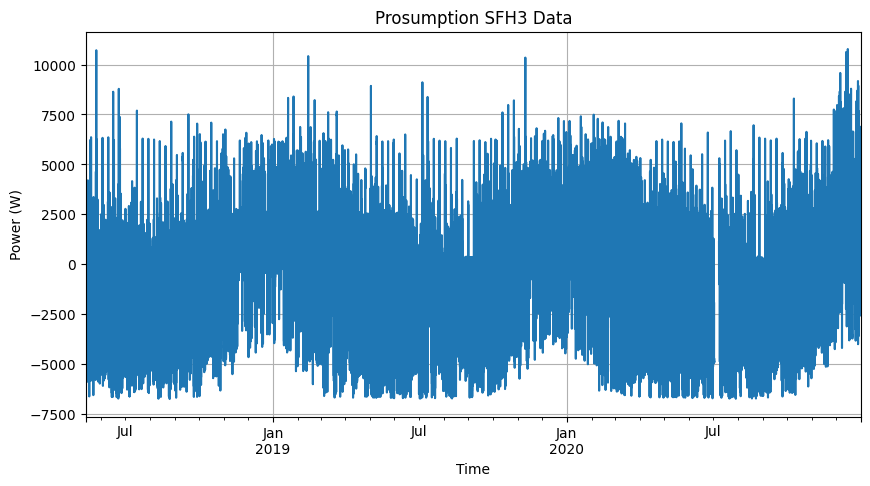

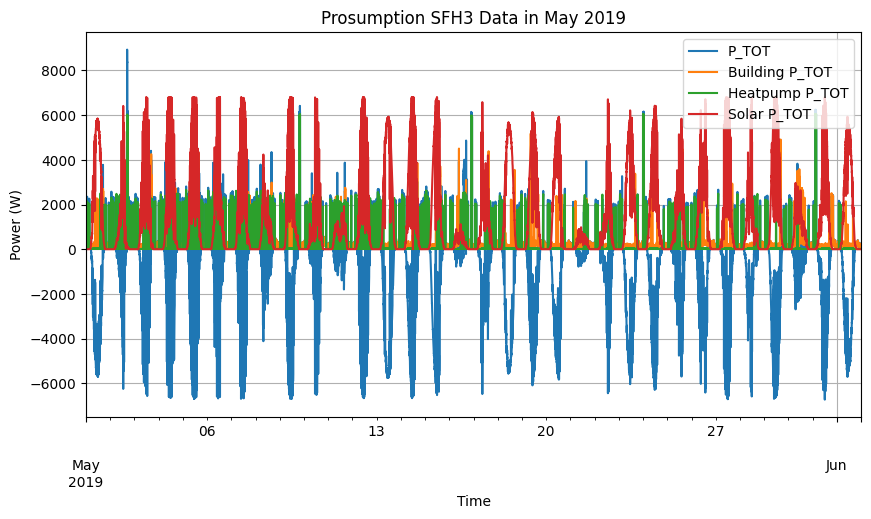

'Train period: 2018-05-13 05:52:00+00:00 to 2019-05-13 05:52:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 05:52:00+00:00 to 2020-05-13 05:52:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 05:52:00+00:00 to 2020-12-31 23:59:00+00:00 contains 232 days 18:07:00'

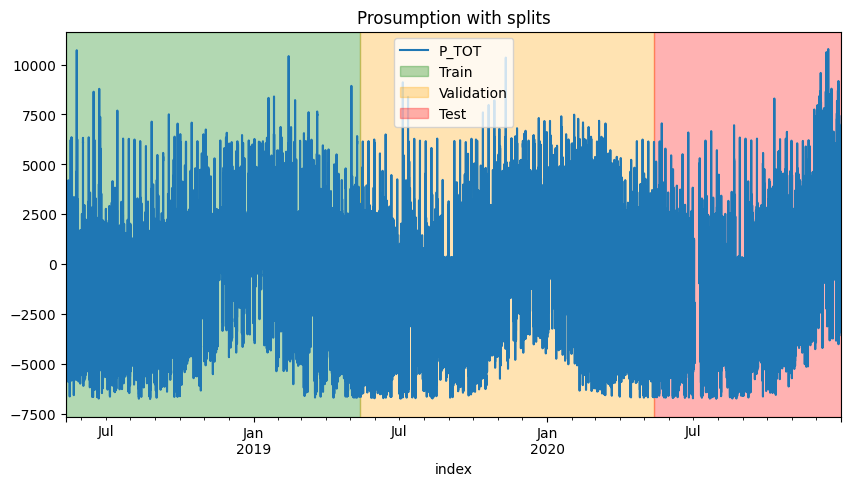

----------------------------------------------------
Calculating prosumption DataFrame for SFH4 with misc_key SOUTH...
Calculated PV factor for SFH4 with 30 resulting modules and 58 modules in the metadata is 0.52
Prosumption data for SFH4 saved to prosumption_data/1min/prosumption_SFH4_num_pv_modules_30_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH4 with PV factor 0.5172413793103449 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH4_num_pv_modules_30_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.378933e+06,1.387534e+06,1.387534e+06,1.378933e+06
mean,-2.381048e+02,3.550652e+02,4.346193e+02,1.030223e+03
std,2.198821e+03,3.680877e+02,1.029765e+03,1.776544e+03
min,-7.678293e+03,7.466333e+01,6.433333e-01,0.000000e+00
25%,-7.566540e+02,2.190417e+02,1.060833e+01,0.000000e+00
50%,2.264283e+02,2.753417e+02,1.142333e+01,2.750000e+01
75%,3.943533e+02,3.488183e+02,7.153833e+01,1.218190e+03
max,1.139433e+04,8.090922e+03,8.707938e+03,7.868362e+03


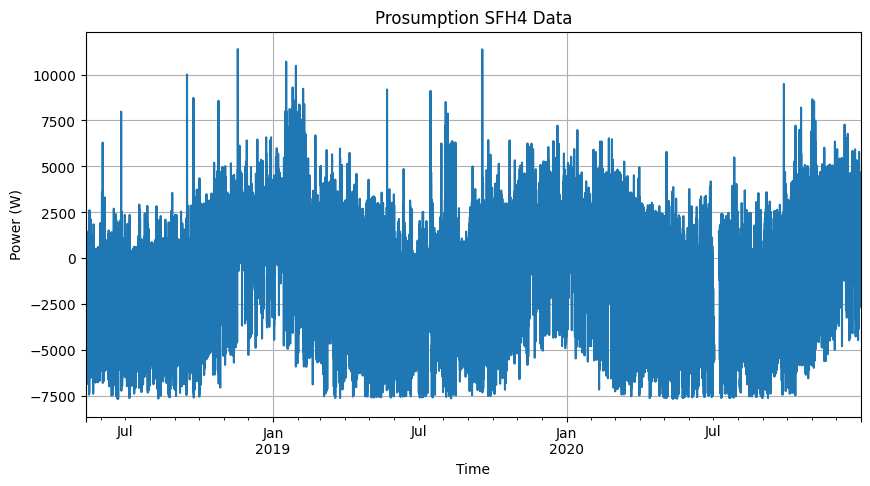

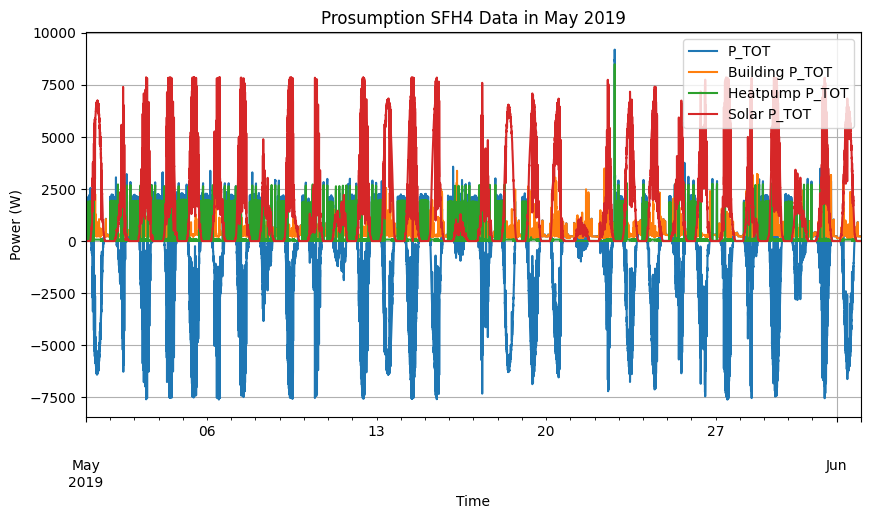

'Train period: 2018-05-13 10:26:00+00:00 to 2019-05-13 10:26:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 10:26:00+00:00 to 2020-05-13 10:26:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 10:26:00+00:00 to 2020-12-31 23:59:00+00:00 contains 232 days 13:33:00'

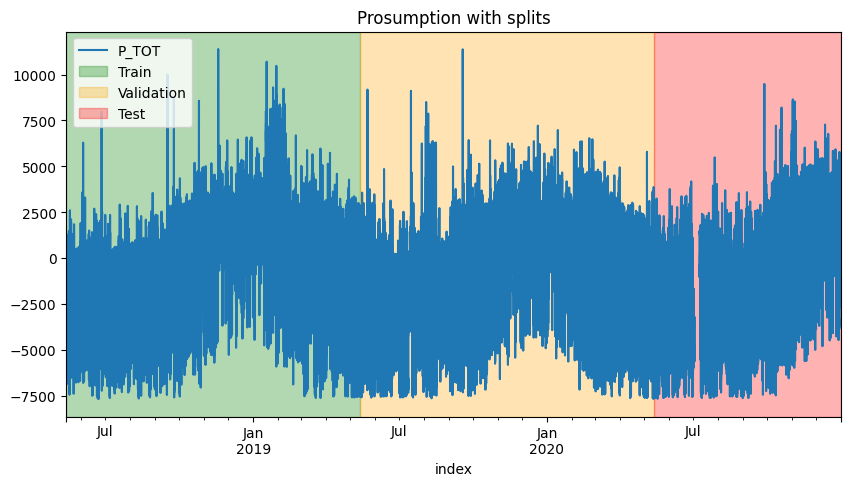

----------------------------------------------------
Calculating prosumption DataFrame for SFH9 with misc_key SOUTH...
Calculated PV factor for SFH9 with 36 resulting modules and 58 modules in the metadata is 0.62
Prosumption data for SFH9 saved to prosumption_data/1min/prosumption_SFH9_num_pv_modules_36_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH9 with PV factor 0.6206896551724138 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH9_num_pv_modules_36_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.379038e+06,1.387639e+06,1.387639e+06,1.379038e+06
mean,7.360190e+01,5.485395e+02,7.596862e+02,1.236661e+03
std,2.519165e+03,8.163719e+02,8.340041e+02,2.132261e+03
min,-9.241915e+03,3.661667e+01,2.366667e+00,0.000000e+00
25%,-4.942898e+02,2.125300e+02,1.118500e+02,0.000000e+00
50%,6.211579e+02,2.915550e+02,6.817583e+02,3.300000e+01
75%,1.135700e+03,4.216167e+02,8.071900e+02,1.462552e+03
max,1.704168e+04,9.795637e+03,1.391467e+04,9.442034e+03


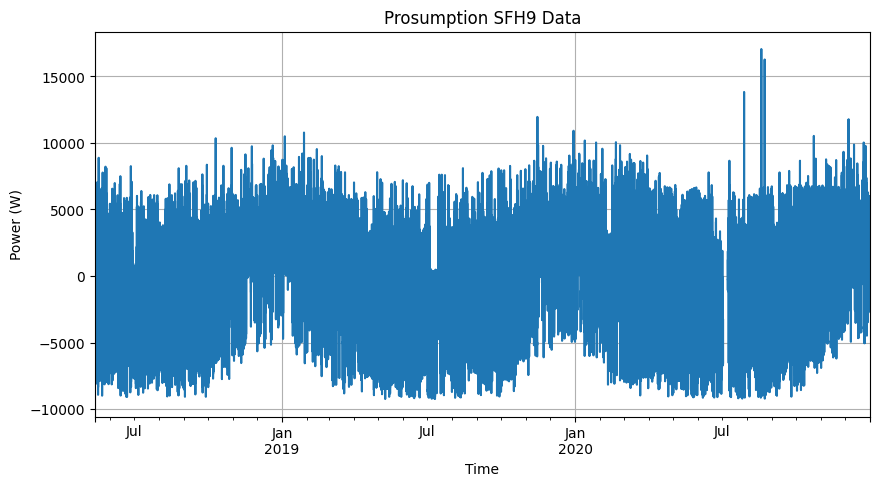

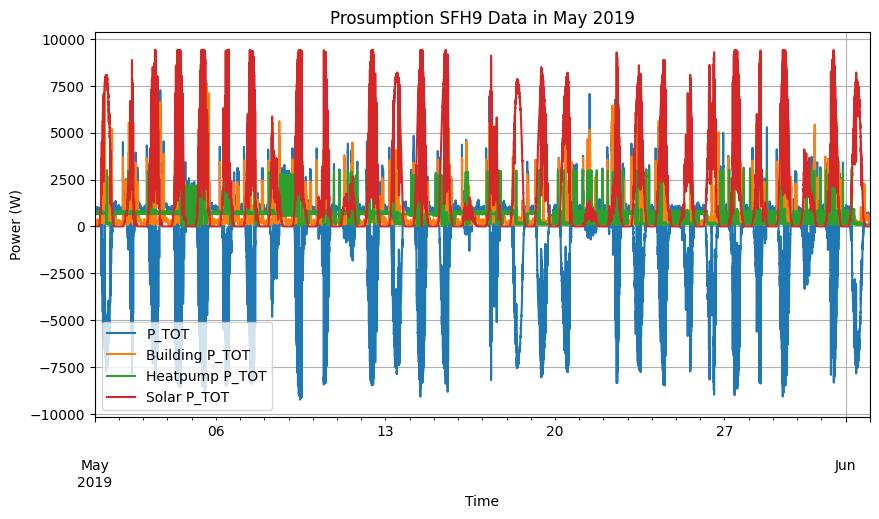

'Train period: 2018-05-13 08:41:00+00:00 to 2019-05-13 08:41:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 08:41:00+00:00 to 2020-05-13 08:41:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 08:41:00+00:00 to 2020-12-31 23:59:00+00:00 contains 232 days 15:18:00'

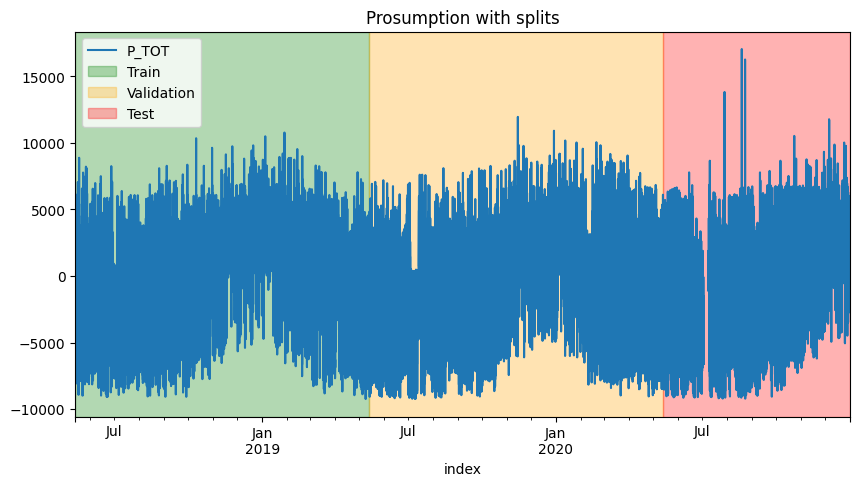

----------------------------------------------------
Calculating prosumption DataFrame for SFH10 with misc_key SOUTH...
Calculated PV factor for SFH10 with 25 resulting modules and 58 modules in the metadata is 0.43
Prosumption data for SFH10 saved to prosumption_data/1min/prosumption_SFH10_num_pv_modules_25_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH10 with PV factor 0.43103448275862066 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH10_num_pv_modules_25_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.325749e+06,1.334350e+06,1.334350e+06,1.379021e+06
mean,2.119517e+02,6.306797e+02,4.651571e+02,8.587579e+02
std,2.049695e+03,4.951333e+02,1.208427e+03,1.480712e+03
min,-6.228972e+03,1.322700e+02,8.650000e-01,0.000000e+00
25%,-3.399165e+02,3.903383e+02,1.031833e+01,0.000000e+00
50%,4.240000e+02,4.834933e+02,1.088833e+01,2.291667e+01
75%,7.657129e+02,6.460679e+02,1.334383e+02,1.015589e+03
max,1.620247e+04,7.772170e+03,1.424935e+04,6.556968e+03


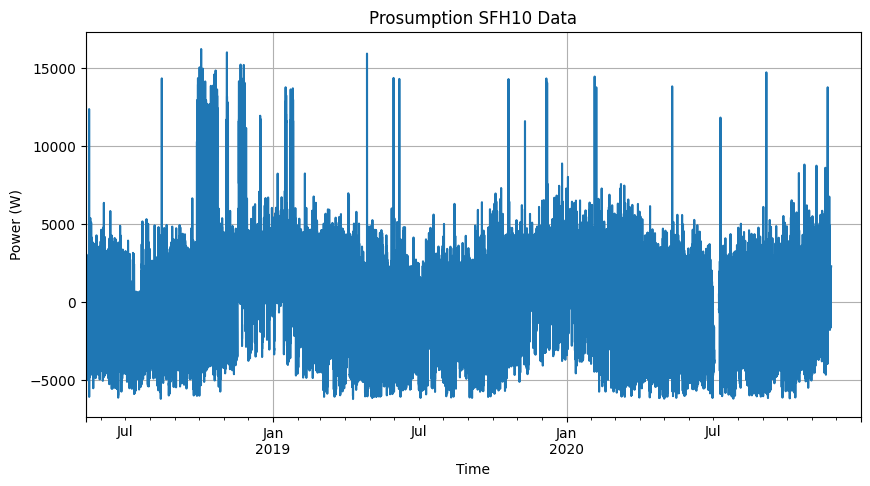

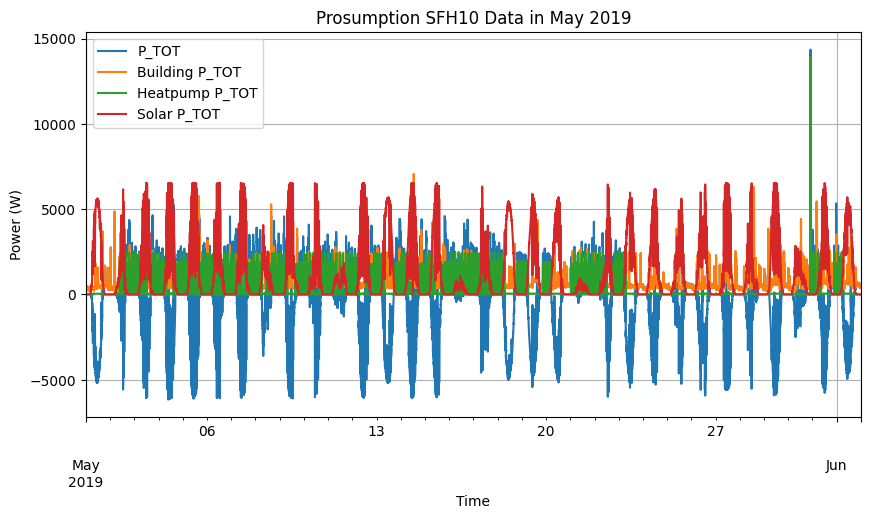

'Train period: 2018-05-13 08:58:00+00:00 to 2019-05-13 08:58:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 08:58:00+00:00 to 2020-05-13 08:58:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 08:58:00+00:00 to 2020-12-31 23:59:00+00:00 contains 232 days 15:01:00'

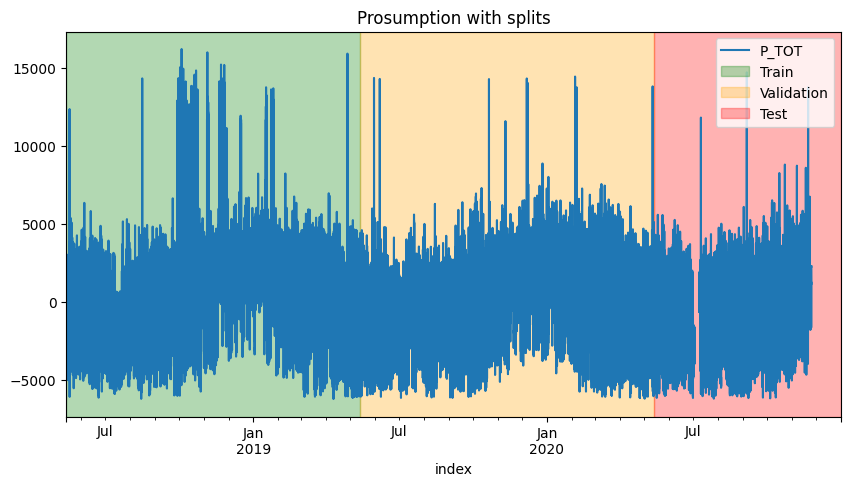

----------------------------------------------------
Calculating prosumption DataFrame for SFH12 with misc_key SOUTH...
Calculated PV factor for SFH12 with 21 resulting modules and 58 modules in the metadata is 0.36
Prosumption data for SFH12 saved to prosumption_data/1min/prosumption_SFH12_num_pv_modules_21_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH12 with PV factor 0.3620689655172414 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH12_num_pv_modules_21_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.369037e+06,1.377638e+06,1.377638e+06,1.369037e+06
mean,-9.969764e+01,3.457079e+02,2.728784e+02,7.195841e+02
std,1.594147e+03,6.181064e+02,7.904344e+02,1.242949e+03
min,-5.437887e+03,3.379000e+01,9.318333e+00,0.000000e+00
25%,-4.182959e+02,1.293333e+02,1.098333e+01,0.000000e+00
50%,1.394593e+02,1.739083e+02,1.152667e+01,1.888793e+01
75%,2.418633e+02,2.494900e+02,1.189167e+01,8.471207e+02
max,1.359162e+04,1.088451e+04,8.970515e+03,5.507853e+03


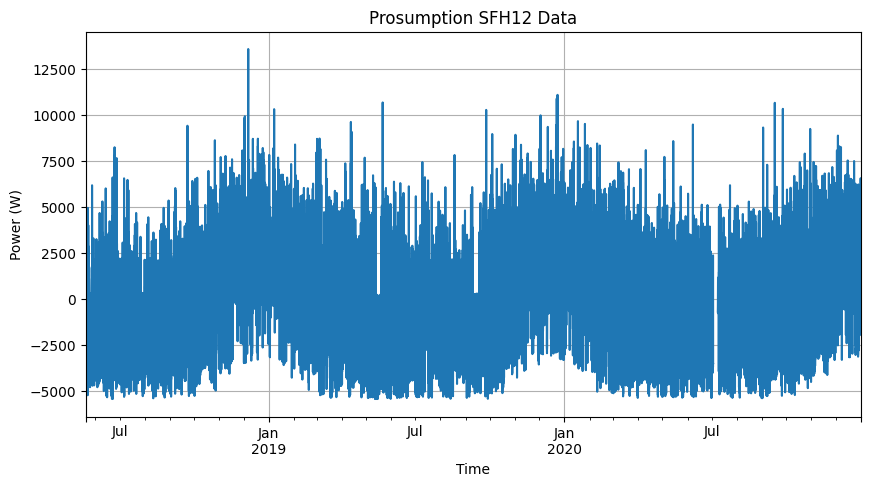

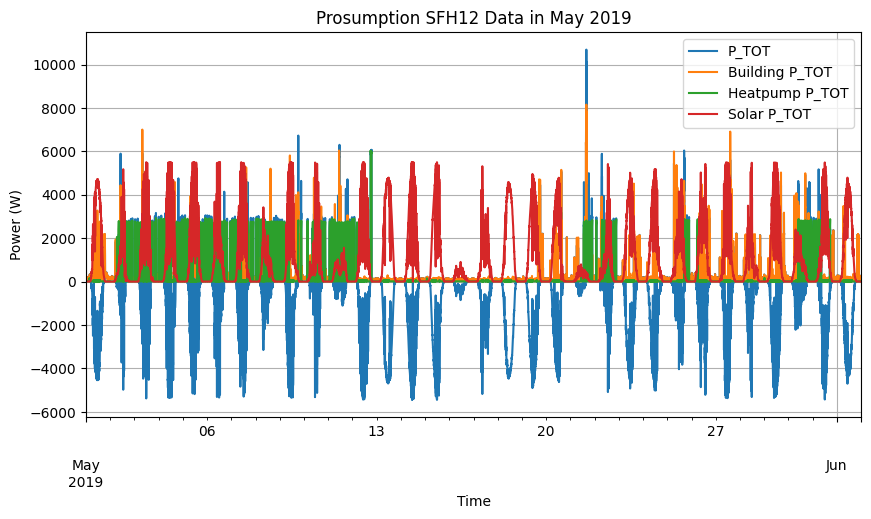

'Train period: 2018-05-20 07:22:00+00:00 to 2019-05-20 07:22:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-20 07:22:00+00:00 to 2020-05-20 07:22:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-20 07:22:00+00:00 to 2020-12-31 23:59:00+00:00 contains 225 days 16:37:00'

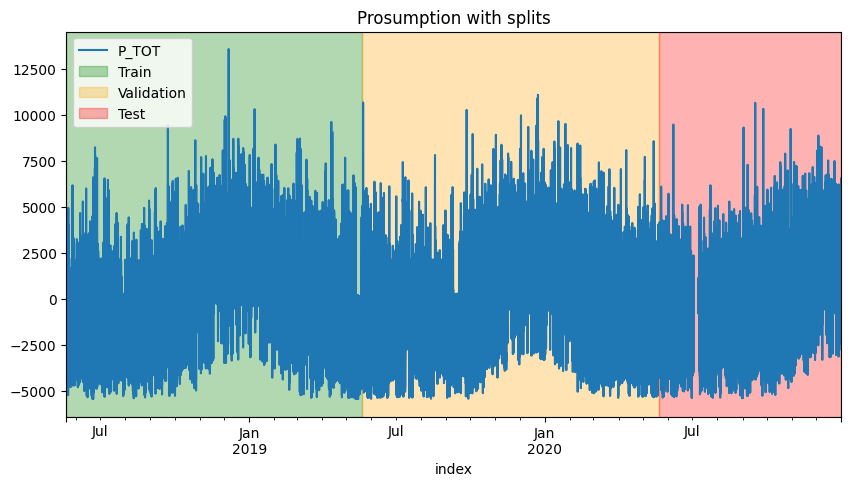

----------------------------------------------------
Calculating prosumption DataFrame for SFH14 with misc_key SOUTH...
Calculated PV factor for SFH14 with 28 resulting modules and 58 modules in the metadata is 0.48
Prosumption data for SFH14 saved to prosumption_data/1min/prosumption_SFH14_num_pv_modules_28_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH14 with PV factor 0.4827586206896552 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH14_num_pv_modules_28_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.368716e+06,1.377317e+06,1.377317e+06,1.368716e+06
mean,9.991813e+01,2.760780e+02,7.771093e+02,9.584249e+02
std,3.145703e+03,3.818127e+02,2.404648e+03,1.656077e+03
min,-7.255117e+03,4.409000e+01,1.048333e+01,0.000000e+00
25%,-7.884997e+02,6.156333e+01,2.530000e+01,0.000000e+00
50%,1.442817e+02,1.534417e+02,8.945500e+01,2.510345e+01
75%,5.334636e+02,3.123683e+02,9.195000e+01,1.128046e+03
max,1.582226e+04,5.605347e+03,1.235497e+04,7.343805e+03


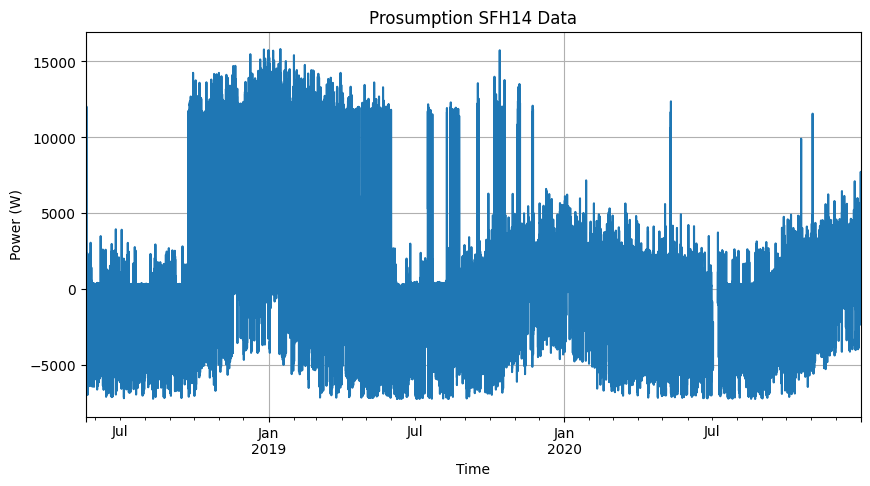

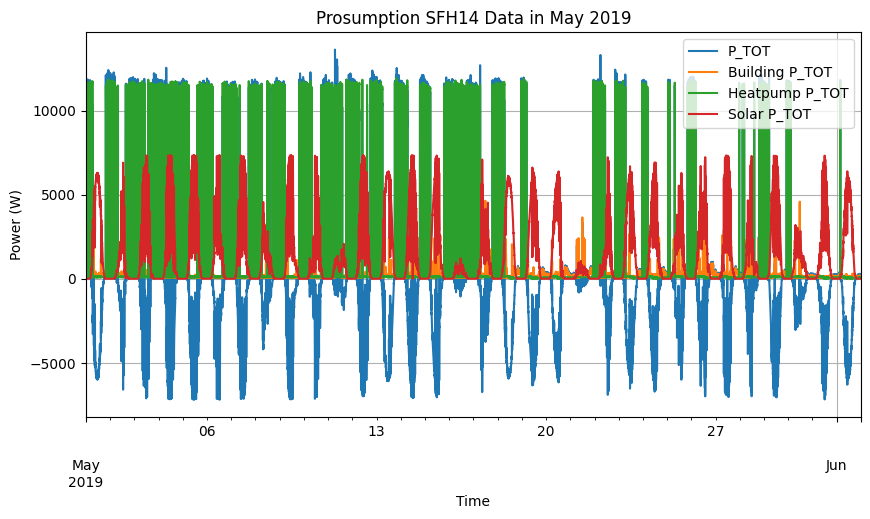

'Train period: 2018-05-20 12:43:00+00:00 to 2019-05-20 12:43:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-20 12:43:00+00:00 to 2020-05-20 12:43:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-20 12:43:00+00:00 to 2020-12-31 23:59:00+00:00 contains 225 days 11:16:00'

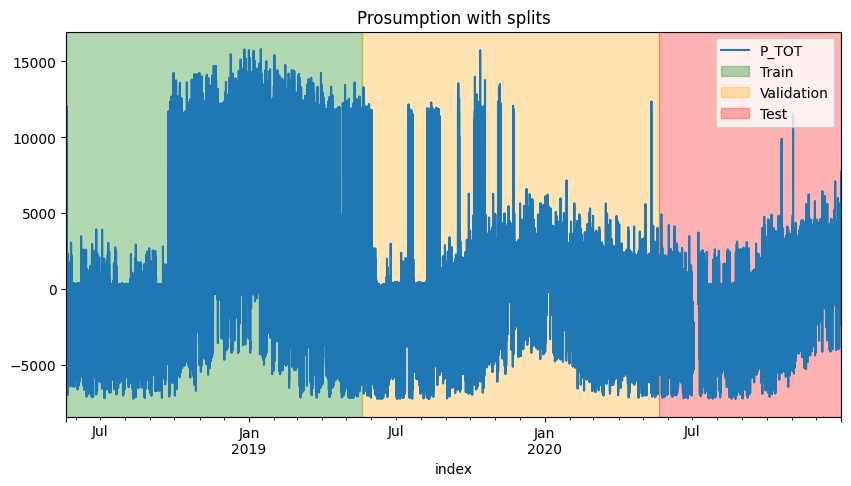

----------------------------------------------------
Calculating prosumption DataFrame for SFH16 with misc_key EAST...
Calculated PV factor for SFH16 with 25 resulting modules and 78 modules in the metadata is 0.32
Prosumption data for SFH16 saved to prosumption_data/1min/prosumption_SFH16_num_pv_modules_25_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH16 with PV factor 0.32051282051282054 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH16_num_pv_modules_25_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.376087e+06,1.376087e+06,1.376087e+06,1.376087e+06
mean,-1.094305e+02,2.573755e+02,3.080453e+02,6.748513e+02
std,1.695931e+03,4.739614e+02,1.046729e+03,1.150454e+03
min,-6.370631e+03,2.943667e+01,1.206667e+00,0.000000e+00
25%,-5.399820e+02,8.639833e+01,1.063667e+01,0.000000e+00
50%,1.148800e+02,1.240117e+02,6.546500e+01,1.426282e+01
75%,2.849650e+02,1.928692e+02,6.802500e+01,8.619124e+02
max,1.820646e+04,7.985108e+03,1.472723e+04,6.491239e+03


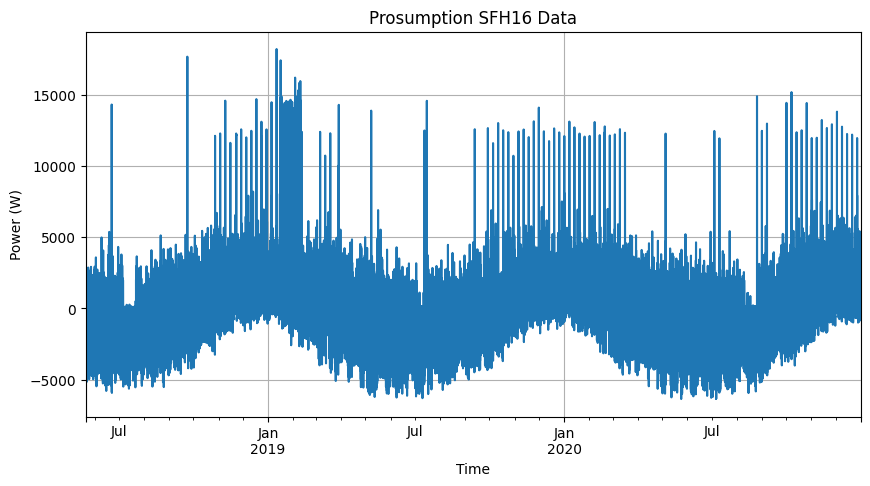

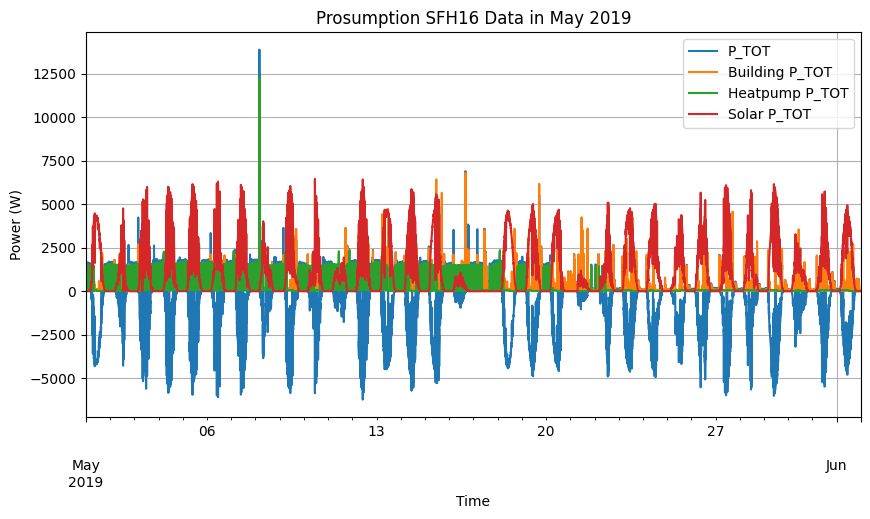

'Train period: 2018-05-21 09:13:00+00:00 to 2019-05-21 09:13:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-21 09:13:00+00:00 to 2020-05-21 09:13:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-21 09:13:00+00:00 to 2020-12-31 23:59:00+00:00 contains 224 days 14:46:00'

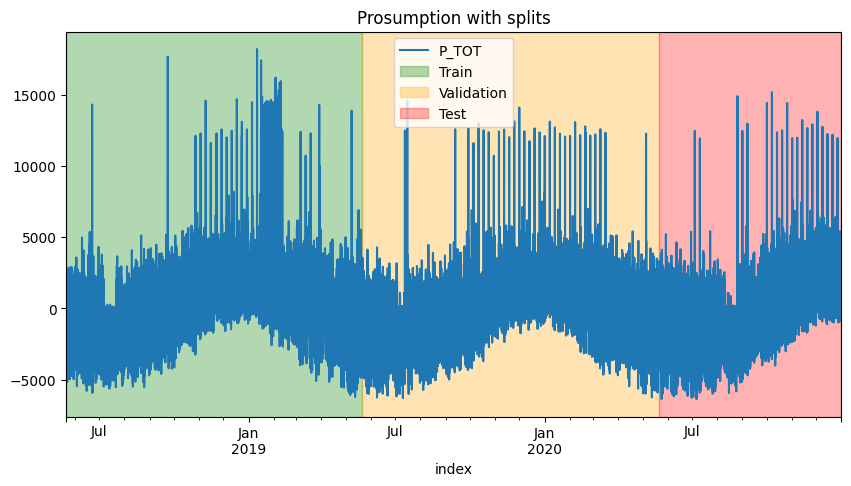

----------------------------------------------------
Calculating prosumption DataFrame for SFH18 with misc_key EAST...
Calculated PV factor for SFH18 with 16 resulting modules and 78 modules in the metadata is 0.21
Prosumption data for SFH18 saved to prosumption_data/1min/prosumption_SFH18_num_pv_modules_16_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH18 with PV factor 0.20512820512820512 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH18_num_pv_modules_16_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.374668e+06,1.374668e+06,1.374668e+06,1.374668e+06
mean,1.133814e+02,3.367983e+02,2.079003e+02,4.313171e+02
std,1.141874e+03,5.805660e+02,6.014868e+02,7.356182e+02
min,-4.079889e+03,5.489208e+01,0.000000e+00,0.000000e+00
25%,-2.106643e+02,1.155550e+02,1.007000e+01,0.000000e+00
50%,1.317149e+02,1.612167e+02,1.060000e+01,9.059829e+00
75%,3.251833e+02,2.758733e+02,1.110667e+01,5.507692e+02
max,1.576745e+04,9.748017e+03,1.233629e+04,4.154393e+03


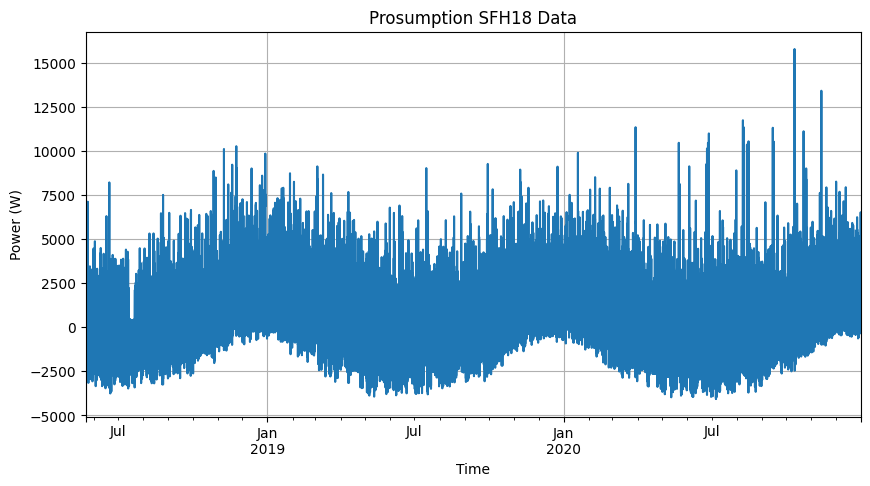

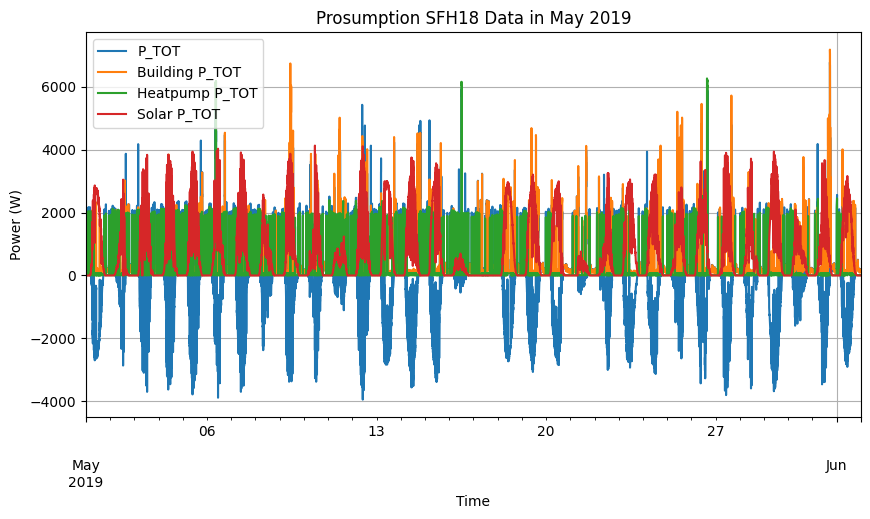

'Train period: 2018-05-22 08:52:00+00:00 to 2019-05-22 08:52:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-22 08:52:00+00:00 to 2020-05-22 08:52:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-22 08:52:00+00:00 to 2020-12-31 23:59:00+00:00 contains 223 days 15:07:00'

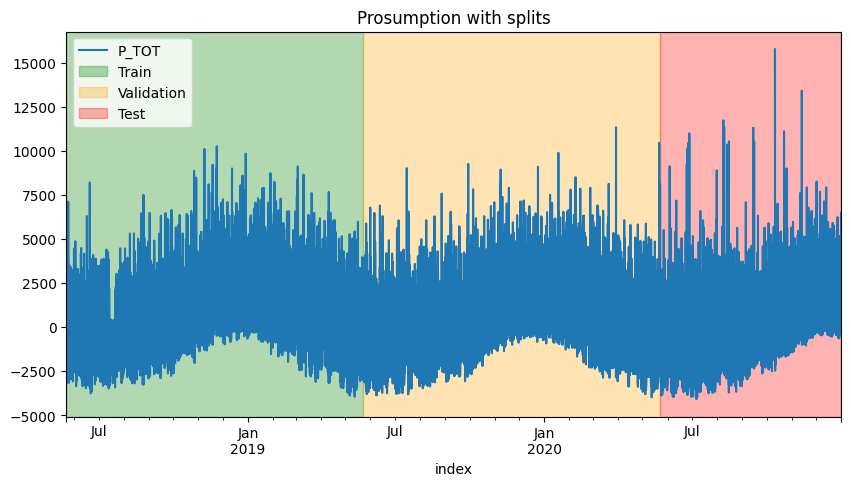

----------------------------------------------------
Calculating prosumption DataFrame for SFH19 with misc_key EAST...
Calculated PV factor for SFH19 with 38 resulting modules and 78 modules in the metadata is 0.49
Prosumption data for SFH19 saved to prosumption_data/1min/prosumption_SFH19_num_pv_modules_38_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH19 with PV factor 0.48717948717948717 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH19_num_pv_modules_38_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.374365e+06,1.374365e+06,1.374365e+06,1.374365e+06
mean,-4.297126e+02,3.667584e+02,2.270612e+02,1.023532e+03
std,1.974588e+03,4.094085e+02,6.507213e+02,1.746100e+03
min,-9.636177e+03,5.216333e+01,8.366667e-01,0.000000e+00
25%,-8.537566e+02,2.170283e+02,1.020167e+01,0.000000e+00
50%,2.171050e+02,2.796150e+02,1.038833e+01,2.151709e+01
75%,3.292012e+02,3.494267e+02,1.060333e+01,1.306697e+03
max,9.501527e+03,8.061317e+03,8.388195e+03,9.866684e+03


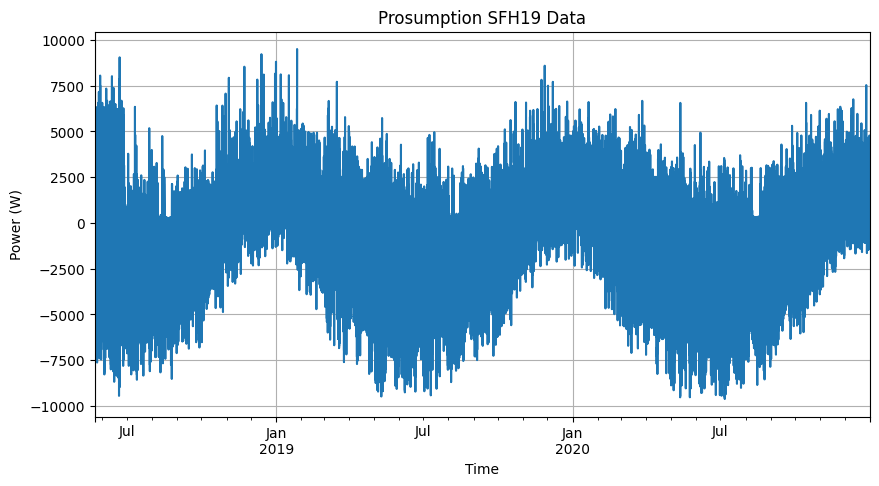

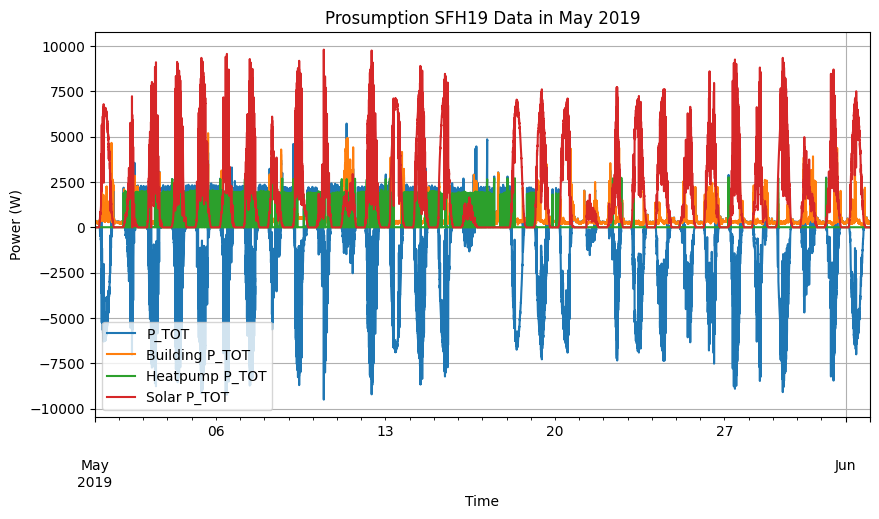

'Train period: 2018-05-22 13:55:00+00:00 to 2019-05-22 13:55:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-22 13:55:00+00:00 to 2020-05-22 13:55:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-22 13:55:00+00:00 to 2020-12-31 23:59:00+00:00 contains 223 days 10:04:00'

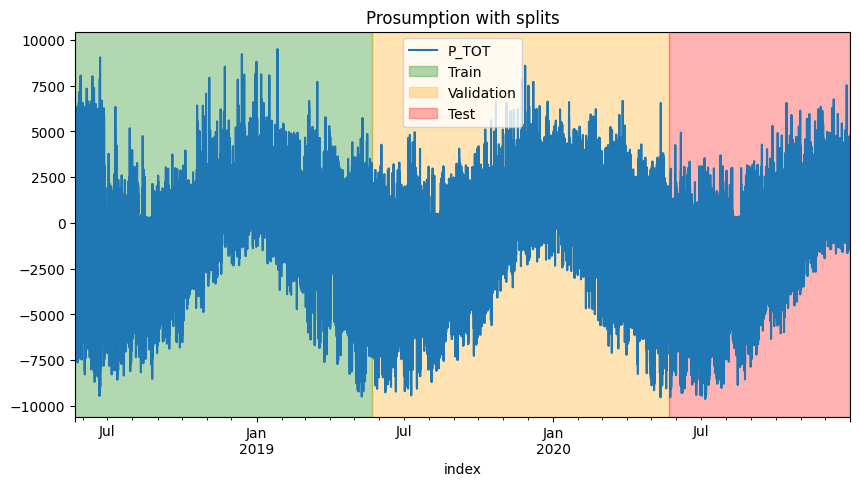

----------------------------------------------------
Calculating prosumption DataFrame for SFH22 with misc_key EAST...
Calculated PV factor for SFH22 with 21 resulting modules and 78 modules in the metadata is 0.27
Prosumption data for SFH22 saved to prosumption_data/1min/prosumption_SFH22_num_pv_modules_21_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH22 with PV factor 0.2692307692307692 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH22_num_pv_modules_21_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.364666e+06,1.364666e+06,1.364666e+06,1.364666e+06
mean,6.589990e+02,3.800710e+02,8.415437e+02,5.626156e+02
std,2.296956e+03,4.782552e+02,1.863060e+03,9.625444e+02
min,-5.242431e+03,6.518833e+01,4.716667e-01,0.000000e+00
25%,-2.876166e+02,1.717850e+02,1.118167e+01,0.000000e+00
50%,2.226117e+02,2.393950e+02,1.177167e+01,1.157692e+01
75%,5.960813e+02,3.786879e+02,5.221500e+01,7.151667e+02
max,1.278394e+04,8.272240e+03,8.692597e+03,5.452641e+03


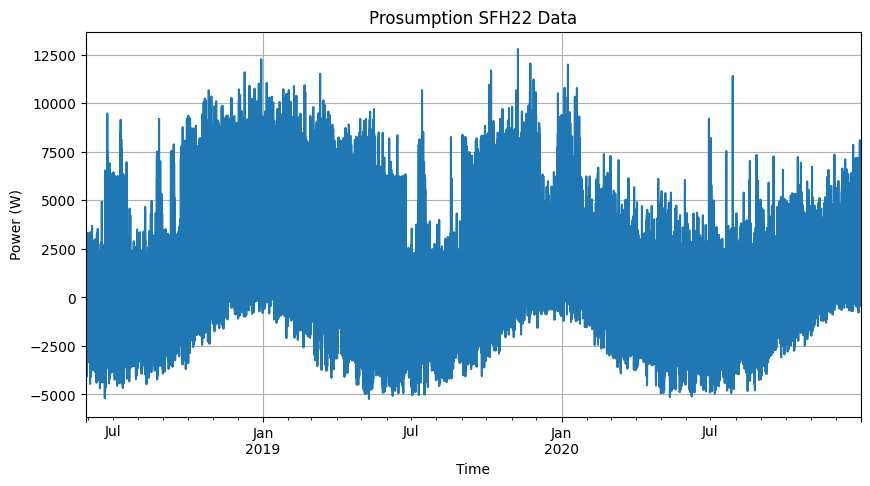

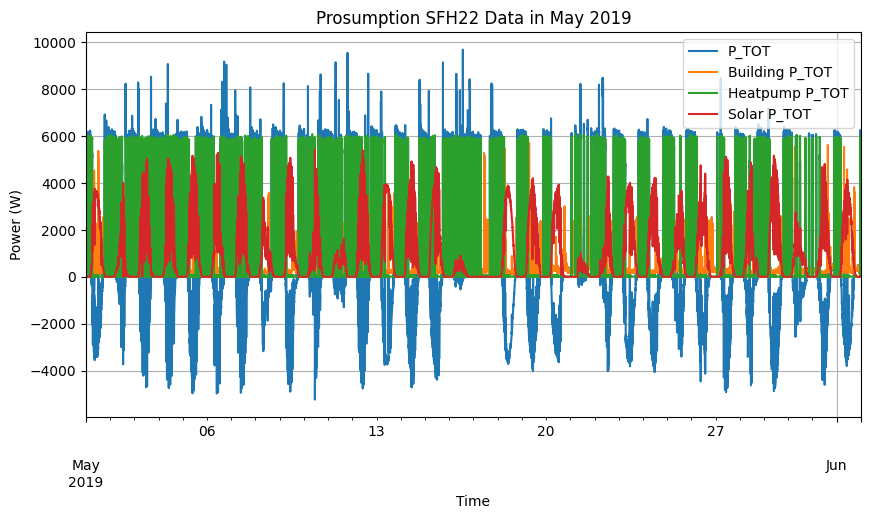

'Train period: 2018-05-29 07:34:00+00:00 to 2019-05-29 07:34:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-29 07:34:00+00:00 to 2020-05-29 07:34:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-29 07:34:00+00:00 to 2020-12-31 23:59:00+00:00 contains 216 days 16:25:00'

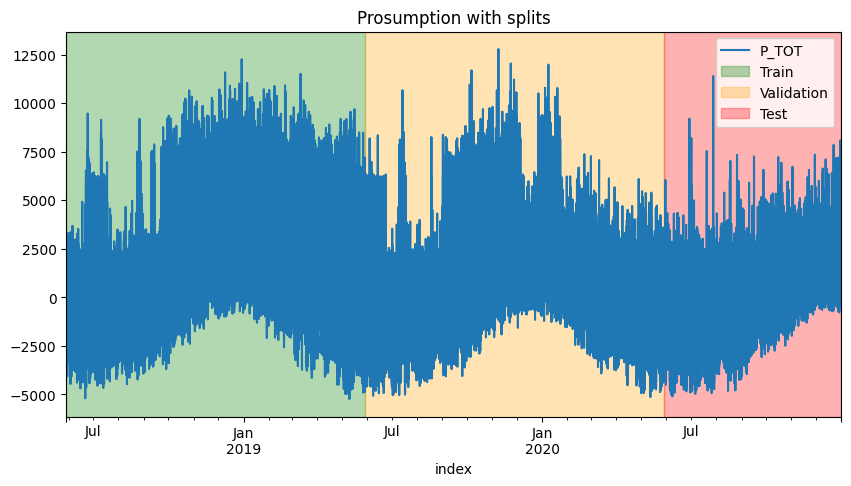

----------------------------------------------------
Calculating prosumption DataFrame for SFH27 with misc_key WEST...
Calculated PV factor for SFH27 with 20 resulting modules and 78 modules in the metadata is 0.26
Prosumption data for SFH27 saved to prosumption_data/1min/prosumption_SFH27_num_pv_modules_20_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH27 with PV factor 0.2564102564102564 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH27_num_pv_modules_20_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.366015e+06,1.366015e+06,1.366015e+06,1.366015e+06
mean,-1.827844e+02,1.269742e+02,2.384408e+02,5.481994e+02
std,1.227185e+03,2.066046e+02,6.867406e+02,9.306155e+02
min,-5.109669e+03,3.083833e+01,5.100000e-01,0.000000e+00
25%,-5.018693e+02,6.483333e+01,1.112500e+01,0.000000e+00
50%,7.365333e+01,1.002133e+02,1.164167e+01,1.863248e+01
75%,1.464883e+02,1.292150e+02,5.996333e+01,7.077778e+02
max,9.676805e+03,5.086907e+03,6.100738e+03,5.189103e+03


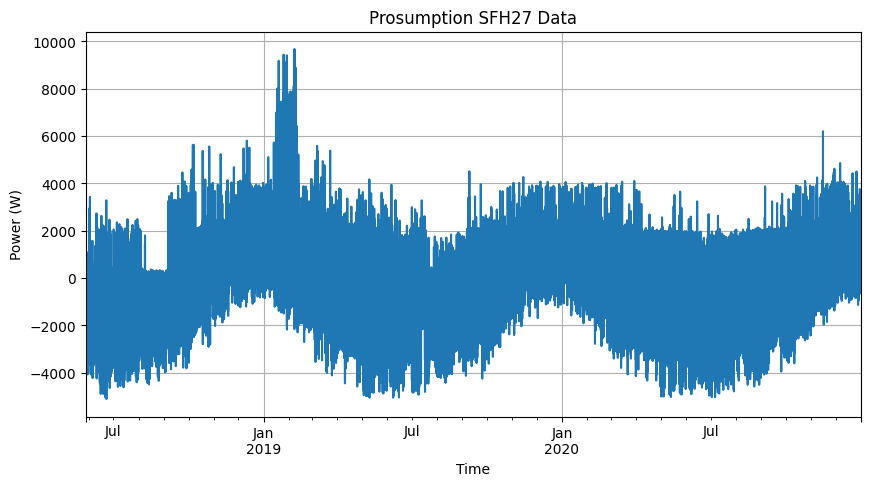

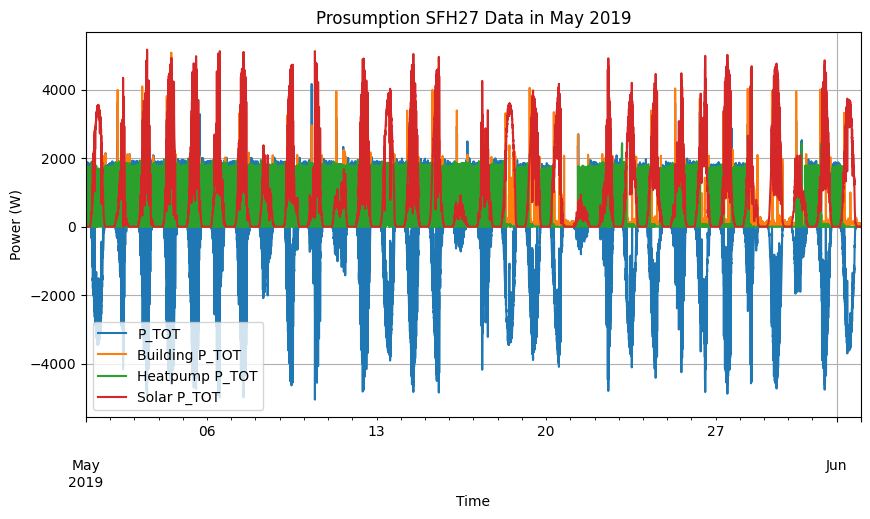

'Train period: 2018-05-28 09:05:00+00:00 to 2019-05-28 09:05:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-28 09:05:00+00:00 to 2020-05-28 09:05:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-28 09:05:00+00:00 to 2020-12-31 23:59:00+00:00 contains 217 days 14:54:00'

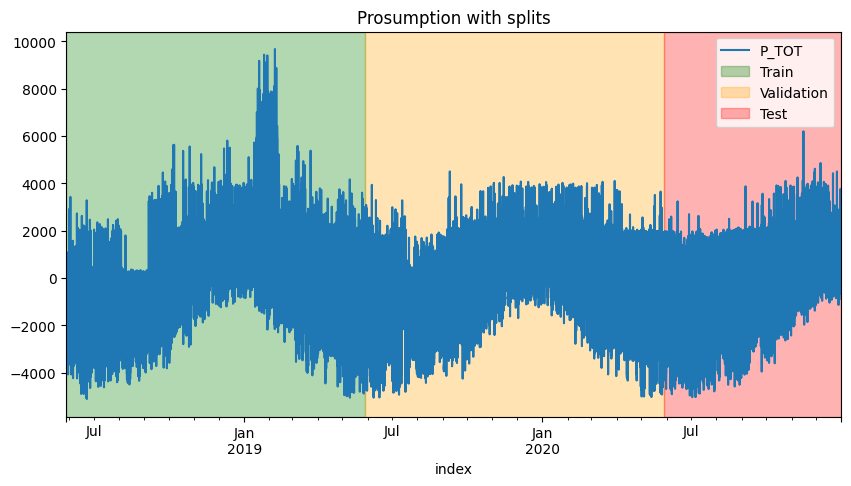

----------------------------------------------------
Calculating prosumption DataFrame for SFH28 with misc_key WEST...
Calculated PV factor for SFH28 with 27 resulting modules and 78 modules in the metadata is 0.35
Prosumption data for SFH28 saved to prosumption_data/1min/prosumption_SFH28_num_pv_modules_27_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH28 with PV factor 0.34615384615384615 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH28_num_pv_modules_27_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.365732e+06,1.365732e+06,1.365732e+06,1.365732e+06
mean,2.465462e+02,3.582713e+02,6.276646e+02,7.393896e+02
std,2.013829e+03,4.872987e+02,1.356880e+03,1.255520e+03
min,-6.800788e+03,2.111500e+01,0.000000e+00,0.000000e+00
25%,-3.970842e+02,1.357133e+02,1.043667e+01,0.000000e+00
50%,1.735017e+02,1.955050e+02,1.074833e+01,2.509615e+01
75%,6.076967e+02,3.911725e+02,5.464167e+01,9.545192e+02
max,1.145891e+04,7.297003e+03,8.602643e+03,7.005288e+03


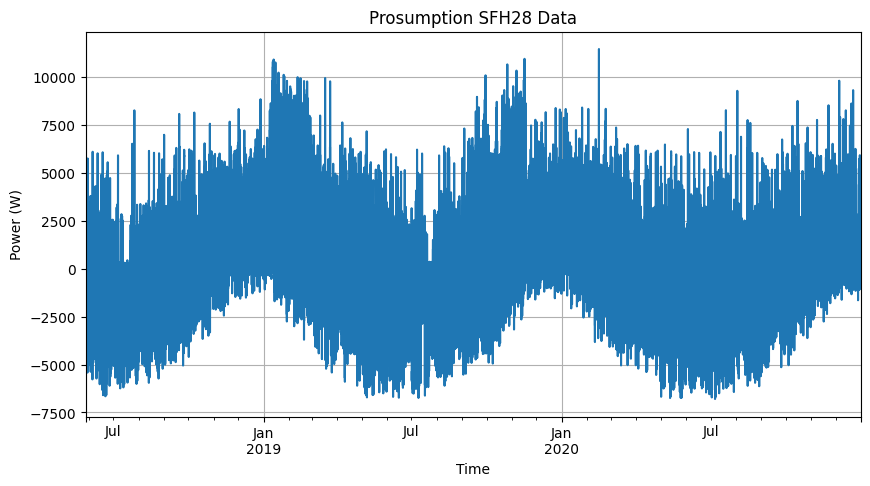

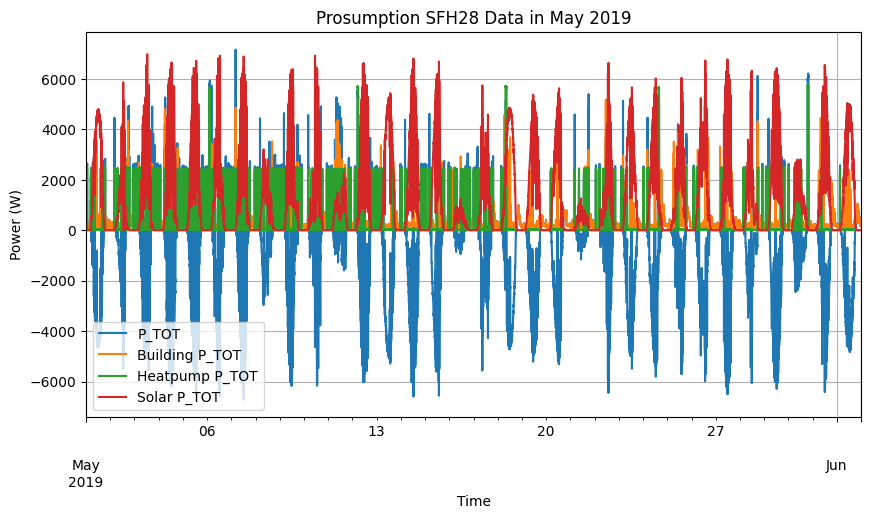

'Train period: 2018-05-28 13:48:00+00:00 to 2019-05-28 13:48:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-28 13:48:00+00:00 to 2020-05-28 13:48:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-28 13:48:00+00:00 to 2020-12-31 23:59:00+00:00 contains 217 days 10:11:00'

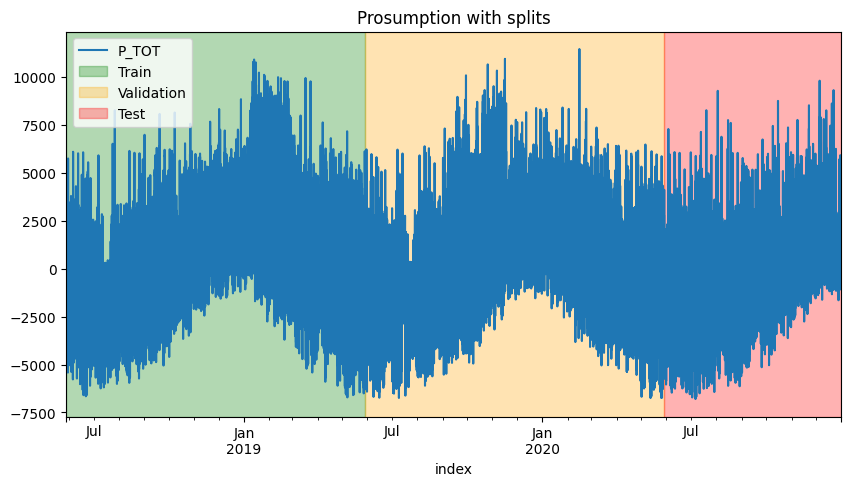

----------------------------------------------------
Calculating prosumption DataFrame for SFH29 with misc_key WEST...
Calculated PV factor for SFH29 with 19 resulting modules and 78 modules in the metadata is 0.24
Prosumption data for SFH29 saved to prosumption_data/1min/prosumption_SFH29_num_pv_modules_19_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH29 with PV factor 0.24358974358974358 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH29_num_pv_modules_19_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.364669e+06,1.364669e+06,1.364669e+06,1.364669e+06
mean,-6.969513e+01,1.620404e+02,2.885661e+02,5.203017e+02
std,1.347281e+03,2.685919e+02,8.583936e+02,8.835814e+02
min,-4.879511e+03,2.071667e+00,0.000000e+00,0.000000e+00
25%,-4.739196e+02,8.890000e+01,1.144667e+01,0.000000e+00
50%,1.054167e+02,1.047533e+02,5.987500e+01,1.761966e+01
75%,2.011917e+02,1.505567e+02,6.268167e+01,6.715769e+02
max,1.068914e+04,6.897497e+03,5.999570e+03,4.929647e+03


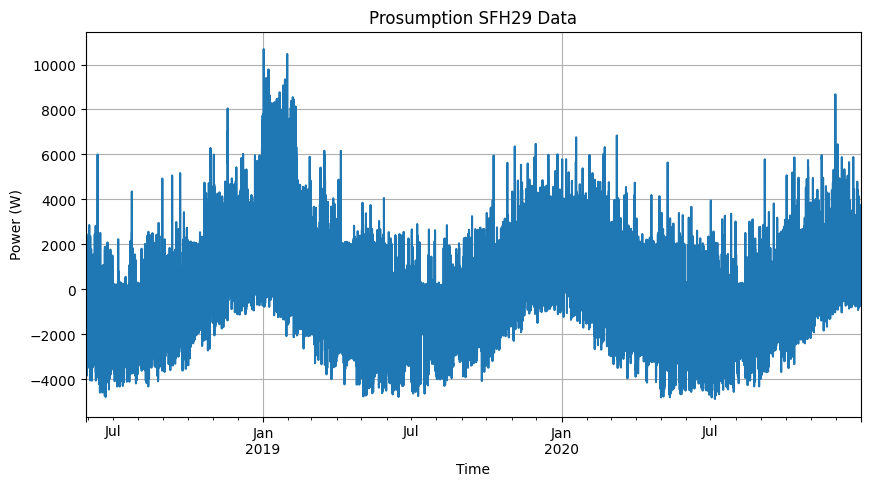

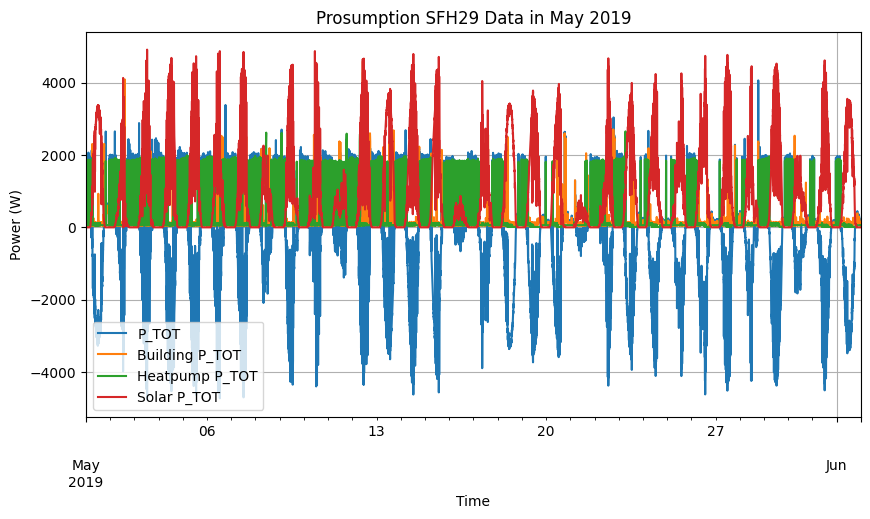

'Train period: 2018-05-29 07:31:00+00:00 to 2019-05-29 07:31:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-29 07:31:00+00:00 to 2020-05-29 07:31:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-29 07:31:00+00:00 to 2020-12-31 23:59:00+00:00 contains 216 days 16:28:00'

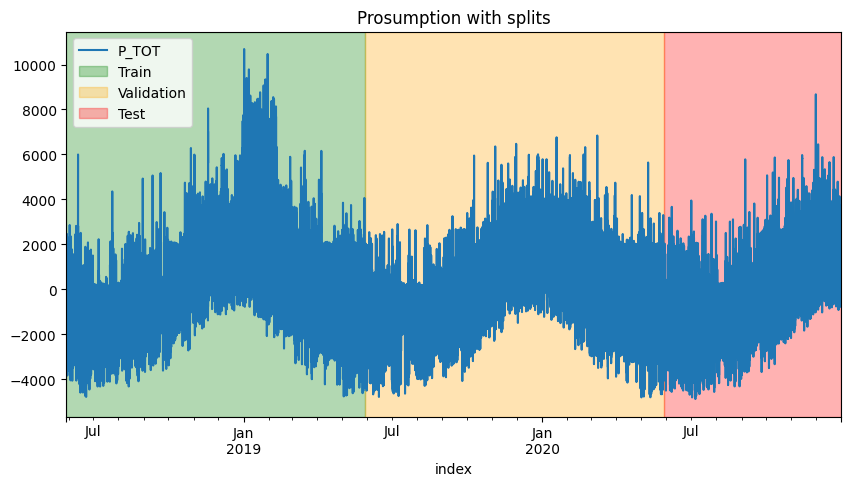

----------------------------------------------------
Calculating prosumption DataFrame for SFH30 with misc_key WEST...
Calculated PV factor for SFH30 with 18 resulting modules and 78 modules in the metadata is 0.23
Prosumption data for SFH30 saved to prosumption_data/1min/prosumption_SFH30_num_pv_modules_18_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH30 with PV factor 0.23076923076923078 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH30_num_pv_modules_18_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.364445e+06,1.364445e+06,1.364445e+06,1.364445e+06
mean,-7.761890e+01,2.518472e+02,1.631385e+02,4.926046e+02
std,1.158610e+03,4.044411e+02,6.655670e+02,8.367754e+02
min,-4.560288e+03,2.409833e+01,5.566667e-01,0.000000e+00
25%,-3.396764e+02,7.050000e+01,1.069500e+01,0.000000e+00
50%,7.679667e+01,1.458283e+02,1.114667e+01,1.665385e+01
75%,1.929263e+02,2.296183e+02,1.232500e+01,6.356538e+02
max,1.185556e+04,6.622343e+03,8.468065e+03,4.670192e+03


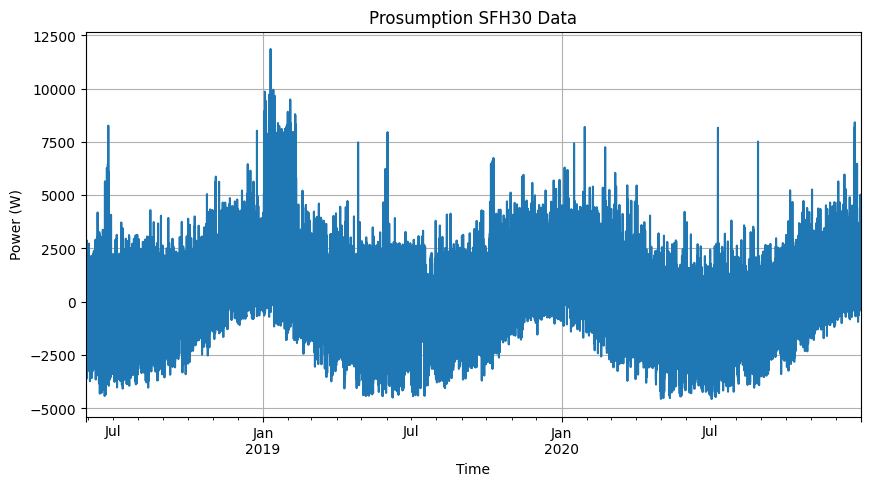

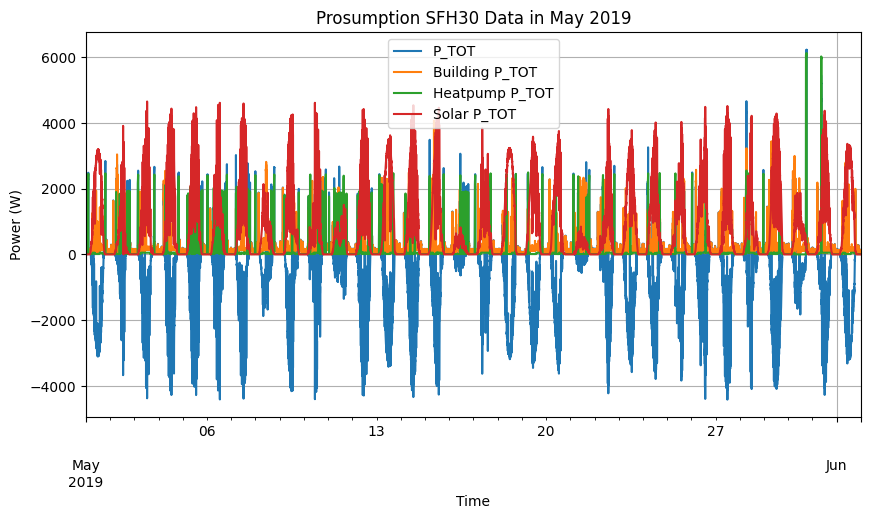

'Train period: 2018-05-29 11:15:00+00:00 to 2019-05-29 11:15:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-29 11:15:00+00:00 to 2020-05-29 11:15:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-29 11:15:00+00:00 to 2020-12-31 23:59:00+00:00 contains 216 days 12:44:00'

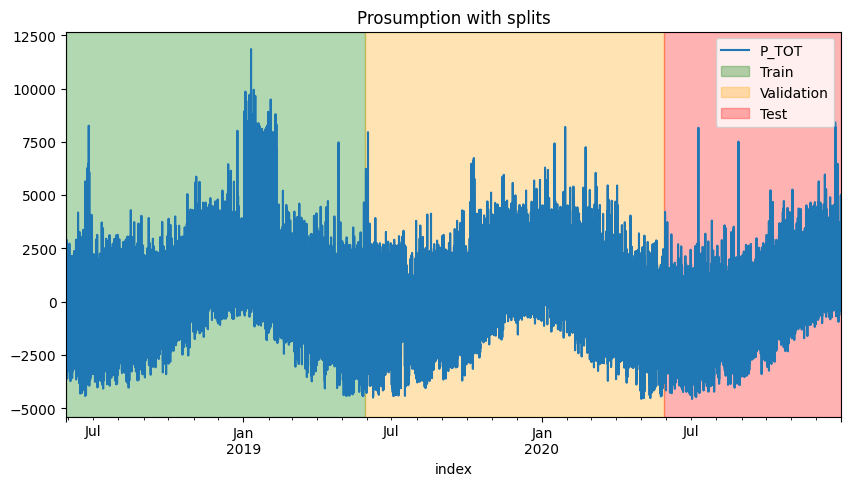

----------------------------------------------------
Calculating prosumption DataFrame for SFH32 with misc_key WEST...
Calculated PV factor for SFH32 with 30 resulting modules and 78 modules in the metadata is 0.38
Prosumption data for SFH32 saved to prosumption_data/1min/prosumption_SFH32_num_pv_modules_30_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH32 with PV factor 0.38461538461538464 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH32_num_pv_modules_30_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.357320e+06,1.357320e+06,1.357320e+06,1.357320e+06
mean,-2.041740e+02,3.060751e+02,3.087624e+02,8.190116e+02
std,1.659487e+03,4.355719e+02,7.114036e+02,1.393324e+03
min,-7.618124e+03,4.398000e+01,0.000000e+00,0.000000e+00
25%,-5.643120e+02,1.220800e+02,1.018000e+01,0.000000e+00
50%,1.650817e+02,1.909633e+02,6.571666e+01,2.698718e+01
75%,3.919300e+02,3.177817e+02,1.083400e+02,1.054359e+03
max,1.139185e+04,7.219150e+03,8.703775e+03,7.783654e+03


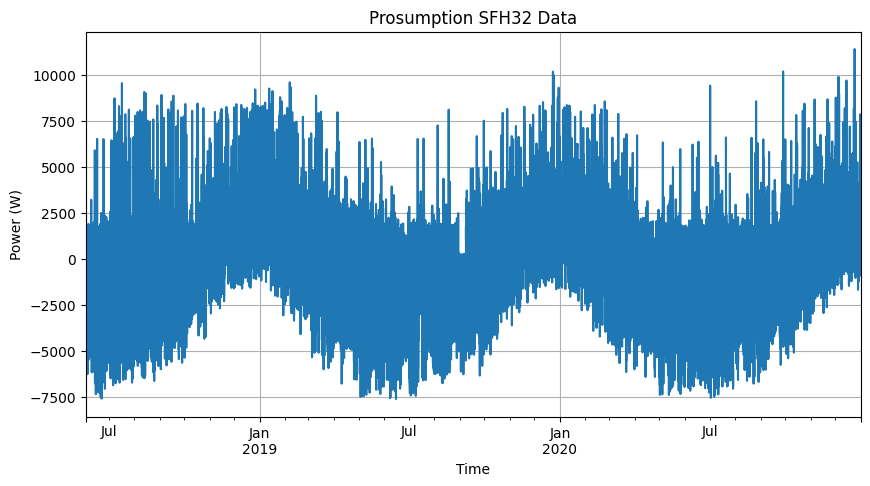

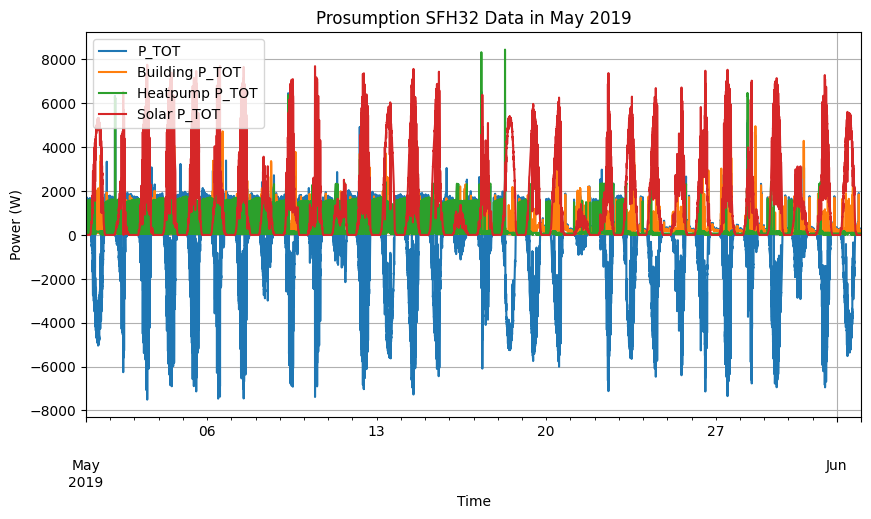

'Train period: 2018-06-03 10:00:00+00:00 to 2019-06-03 10:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-06-03 10:00:00+00:00 to 2020-06-03 10:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-06-03 10:00:00+00:00 to 2020-12-31 23:59:00+00:00 contains 211 days 13:59:00'

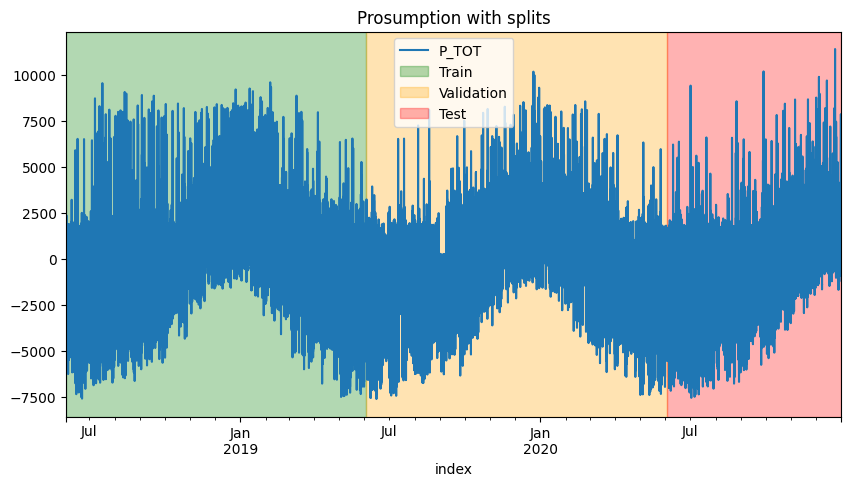

----------------------------------------------------
Calculating prosumption DataFrame for SFH36 with misc_key WEST...
Calculated PV factor for SFH36 with 20 resulting modules and 78 modules in the metadata is 0.26
Prosumption data for SFH36 saved to prosumption_data/1min/prosumption_SFH36_num_pv_modules_20_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH36 with PV factor 0.2564102564102564 and Heatpump factor 1.0 saved to prosumption_data/1min/prosumption_SFH36_num_pv_modules_20_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,1.352856e+06,1.352856e+06,1.352856e+06,1.352856e+06
mean,4.279960e+01,3.139305e+02,2.731568e+02,5.442877e+02
std,1.348508e+03,4.061194e+02,8.645373e+02,9.272868e+02
min,-4.988869e+03,4.127167e+01,5.566667e-01,0.000000e+00
25%,-2.845025e+02,1.367233e+02,1.128333e+01,0.000000e+00
50%,1.439533e+02,2.137250e+02,1.193500e+01,1.760684e+01
75%,2.962504e+02,2.900050e+02,5.932333e+01,6.994444e+02
max,1.143046e+04,7.284535e+03,6.164068e+03,5.189103e+03


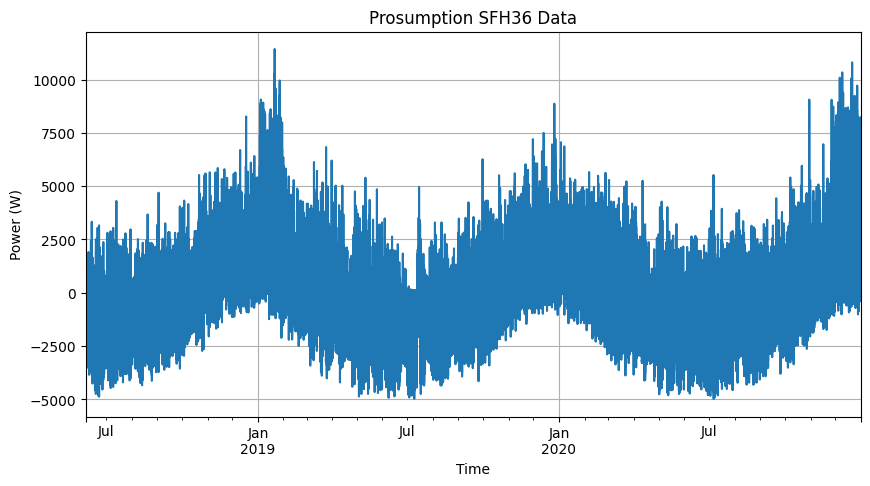

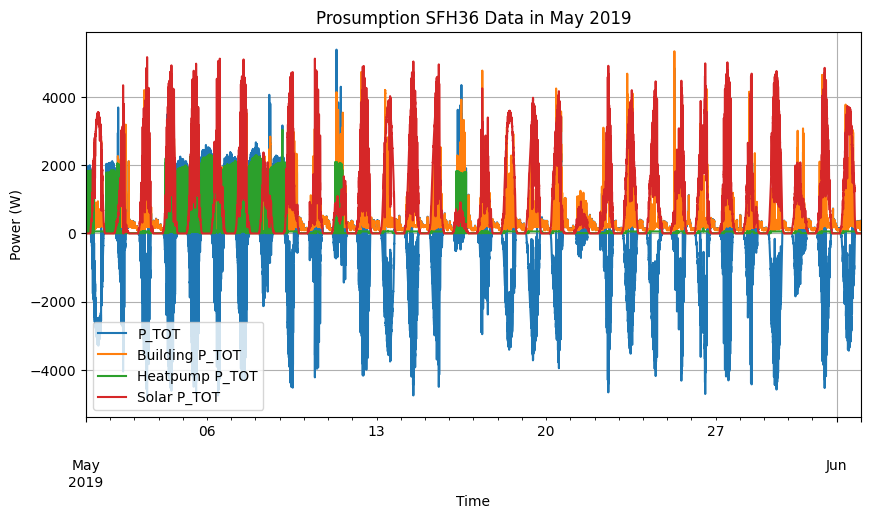

'Train period: 2018-06-06 12:24:00+00:00 to 2019-06-06 12:24:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-06-06 12:24:00+00:00 to 2020-06-06 12:24:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-06-06 12:24:00+00:00 to 2020-12-31 23:59:00+00:00 contains 208 days 11:35:00'

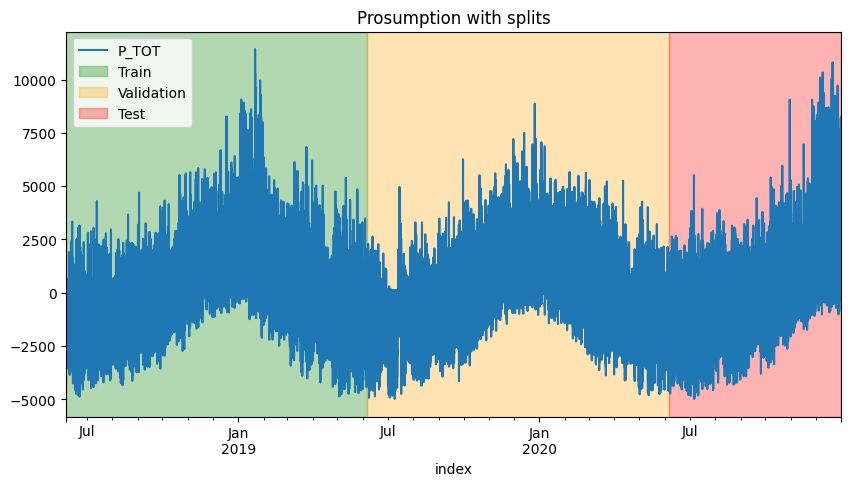

In [15]:
# the first housholds third housholds are South facing, the second ones are East facing, the last ones are West facing

south_facing = sfh_list[0:6]
east_facing = sfh_list[6:10]
west_facing = sfh_list[10:16]


for sfh in south_facing:
    calculate_and_save_prosumption(building_data=building_data_1min, heatpump_data=heatpump_data_1min, misc_data=misc_data_1min, meta_data=meta_houshold_data_1min, meta_solar_data=meta_solar_data, building_name=sfh , misc_key='SOUTH',  heatpump_factor=1.0, verbose=True)
for sfh in east_facing:
    calculate_and_save_prosumption(building_data=building_data_1min, heatpump_data=heatpump_data_1min, misc_data=misc_data_1min,  meta_data=meta_houshold_data_1min, meta_solar_data=meta_solar_data, building_name=sfh , misc_key='EAST',  heatpump_factor=1.0, verbose=True)
for sfh in west_facing:
    calculate_and_save_prosumption(building_data=building_data_1min, heatpump_data=heatpump_data_1min, misc_data=misc_data_1min,  meta_data=meta_houshold_data_1min, meta_solar_data=meta_solar_data, building_name=sfh , misc_key='WEST',  heatpump_factor=1.0, verbose=True)

----------------------------------------------------
Calculating prosumption DataFrame for SFH3 with misc_key SOUTH...
Calculated PV factor for SFH3 with 26 resulting modules and 58 modules in the metadata is 0.45
Prosumption data for SFH3 saved to prosumption_data/15min/prosumption_SFH3_num_pv_modules_26_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH3 with PV factor 0.4482758620689655 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH3_num_pv_modules_26_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,91950.000000,92522.000000,92522.000000,91950.000000
mean,-391.746478,230.713042,269.499726,893.400942
std,1768.653974,324.309751,743.081596,1503.594434
min,-6455.430050,31.569556,10.115778,0.000000
25%,-734.429400,113.922833,11.009556,0.000000
50%,122.174607,160.018500,11.486444,23.380077
75%,229.367972,214.420389,25.786083,1109.992050
max,8850.842431,4760.067543,6976.263321,6709.738314


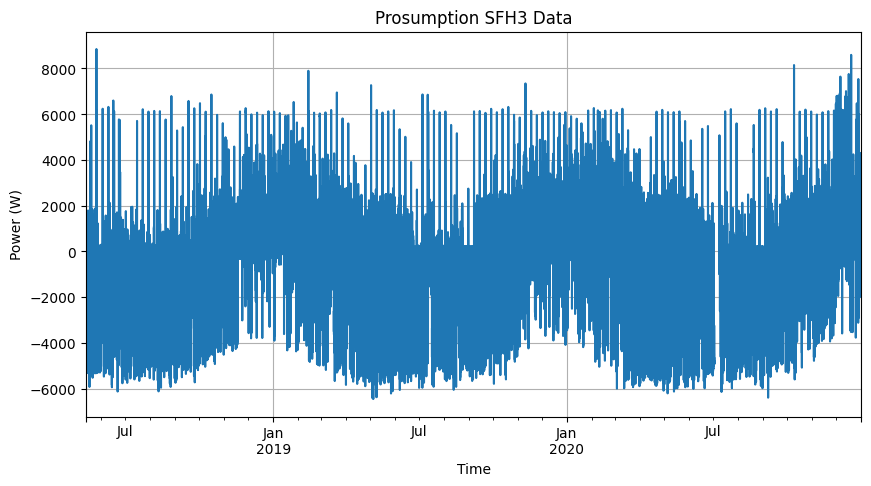

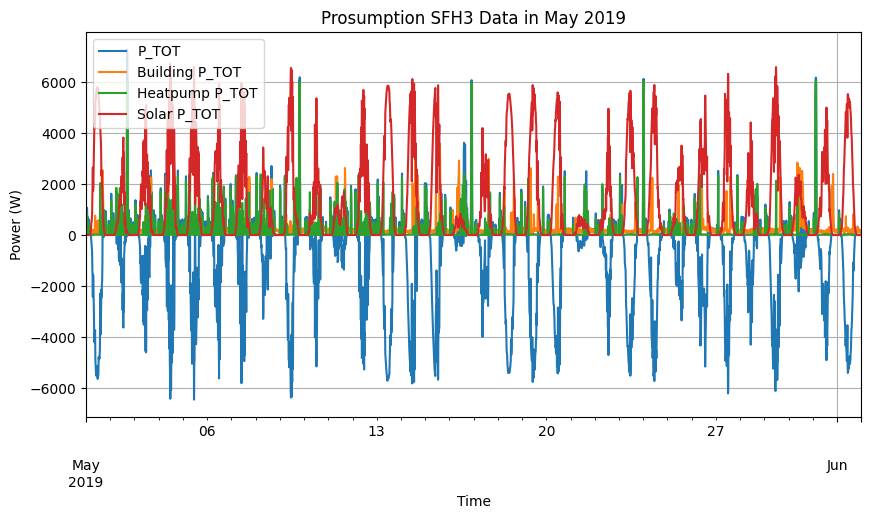

'Train period: 2018-05-13 05:30:00+00:00 to 2019-05-13 05:30:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 05:30:00+00:00 to 2020-05-13 05:30:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 05:30:00+00:00 to 2020-12-31 23:45:00+00:00 contains 232 days 18:15:00'

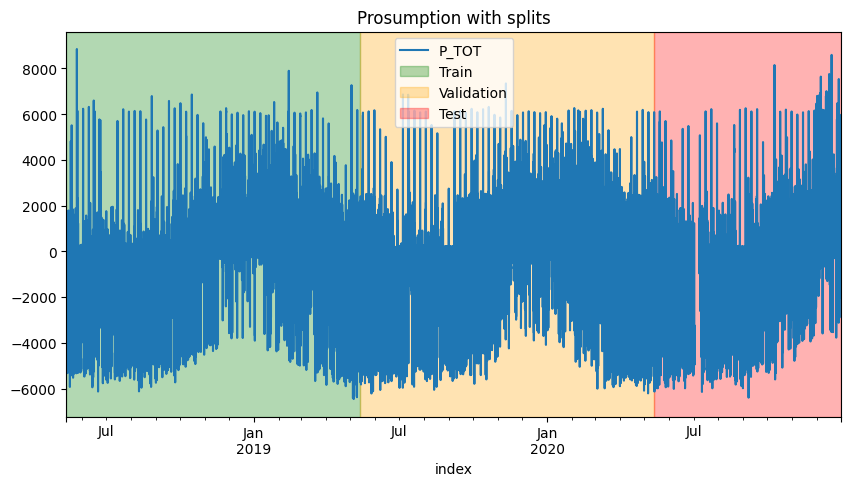

----------------------------------------------------
Calculating prosumption DataFrame for SFH4 with misc_key SOUTH...
Calculated PV factor for SFH4 with 30 resulting modules and 58 modules in the metadata is 0.52
Prosumption data for SFH4 saved to prosumption_data/15min/prosumption_SFH4_num_pv_modules_30_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH4 with PV factor 0.5172413793103449 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH4_num_pv_modules_30_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,91932.000000,92504.000000,92504.000000,91932.000000
mean,-238.250227,355.062927,434.612505,1030.355161
std,2099.063268,301.979142,906.169011,1734.585008
min,-7403.817303,75.563667,9.973333,0.000000
25%,-779.549629,221.057666,10.723444,0.000000
50%,231.697945,287.028889,23.443833,26.928161
75%,663.335060,367.904222,399.907641,1279.244253
max,8644.027051,5552.449555,8157.477219,7742.005747


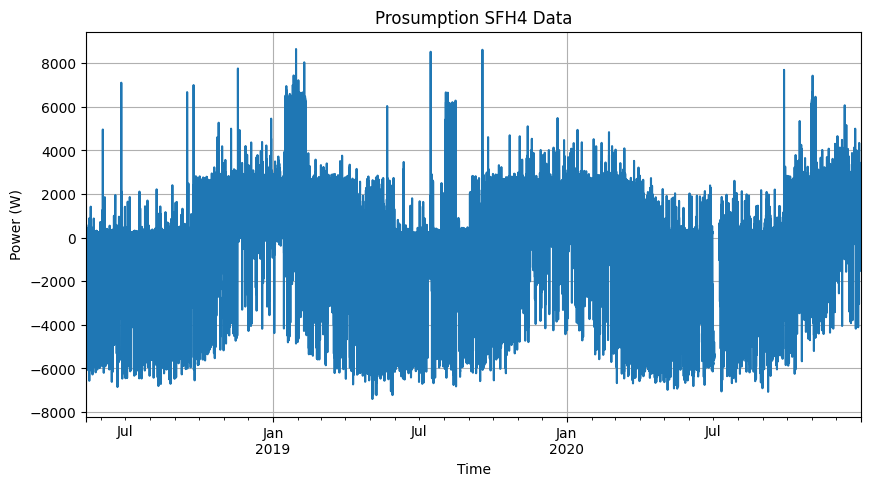

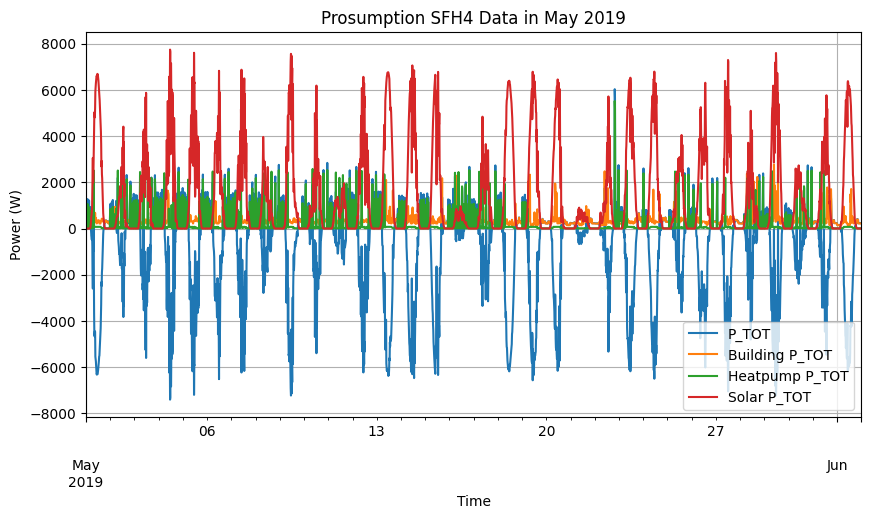

'Train period: 2018-05-13 10:00:00+00:00 to 2019-05-13 10:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 10:00:00+00:00 to 2020-05-13 10:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 10:00:00+00:00 to 2020-12-31 23:45:00+00:00 contains 232 days 13:45:00'

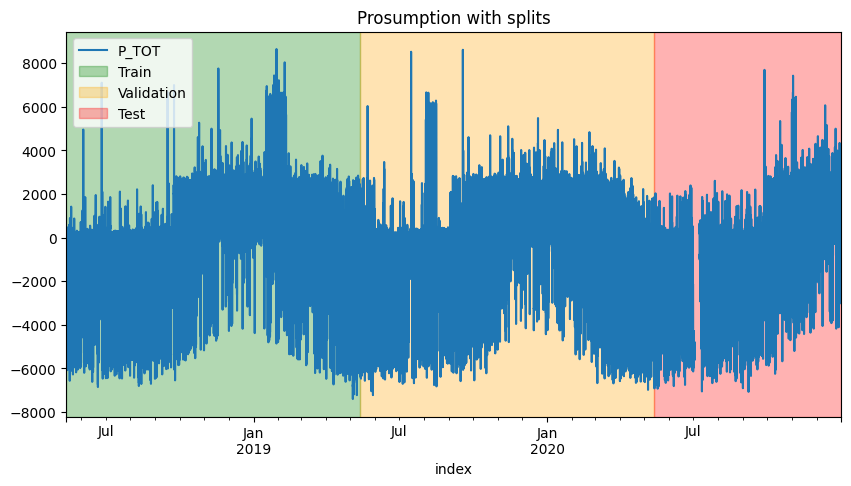

----------------------------------------------------
Calculating prosumption DataFrame for SFH9 with misc_key SOUTH...
Calculated PV factor for SFH9 with 36 resulting modules and 58 modules in the metadata is 0.62
Prosumption data for SFH9 saved to prosumption_data/15min/prosumption_SFH9_num_pv_modules_36_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH9 with PV factor 0.6206896551724138 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH9_num_pv_modules_36_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,91939.000000,92511.000000,92511.000000,91939.000000
mean,73.467613,548.564047,759.674585,1236.795420
std,2423.176151,697.601908,782.855598,2081.858233
min,-8755.033970,60.572111,2.420778,0.000000
25%,-512.666356,218.434556,113.146833,0.000000
50%,690.500441,301.760333,682.732556,32.331034
75%,1222.835690,476.144666,817.962889,1536.417241
max,13021.123434,7088.060010,12442.432006,9290.406897


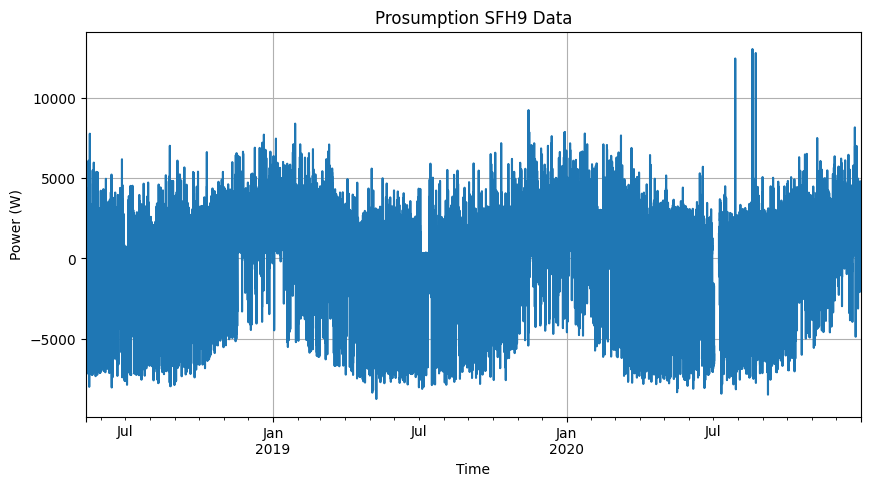

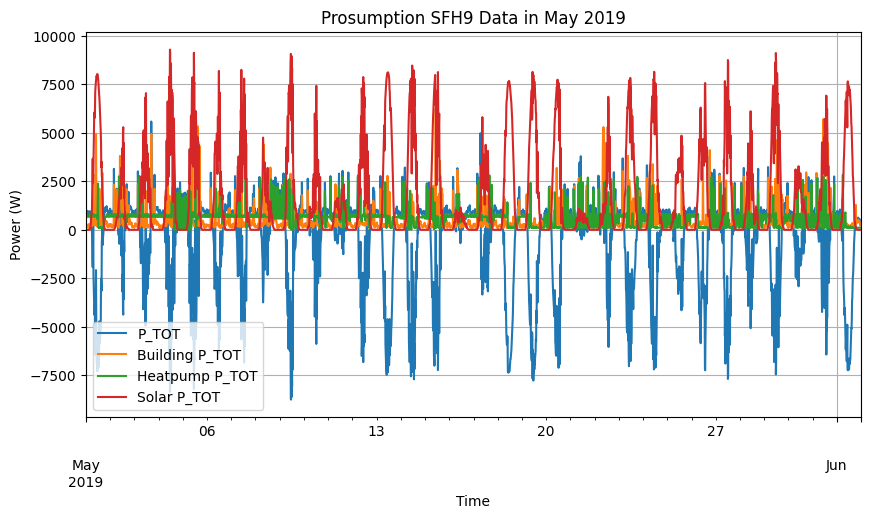

'Train period: 2018-05-13 08:15:00+00:00 to 2019-05-13 08:15:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 08:15:00+00:00 to 2020-05-13 08:15:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 08:15:00+00:00 to 2020-12-31 23:45:00+00:00 contains 232 days 15:30:00'

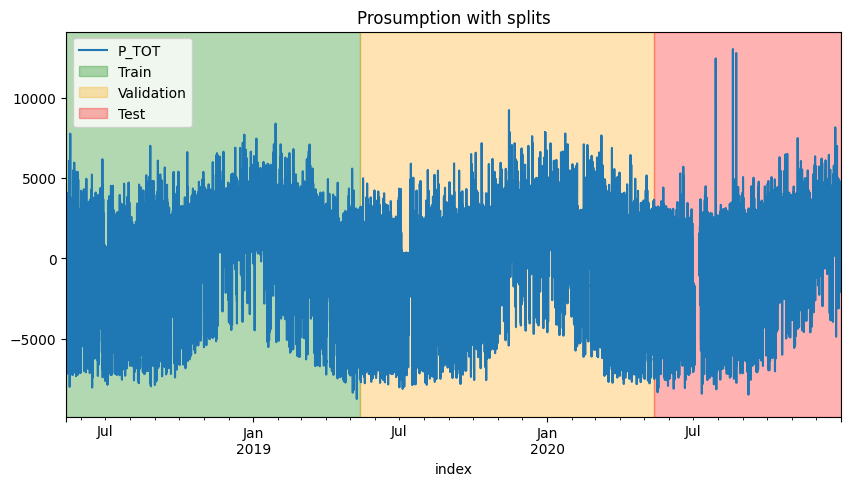

----------------------------------------------------
Calculating prosumption DataFrame for SFH10 with misc_key SOUTH...
Calculated PV factor for SFH10 with 25 resulting modules and 58 modules in the metadata is 0.43
Prosumption data for SFH10 saved to prosumption_data/15min/prosumption_SFH10_num_pv_modules_25_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH10 with PV factor 0.43103448275862066 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH10_num_pv_modules_25_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,88387.000000,88959.000000,88959.000000,91938.000000
mean,211.854687,630.684389,465.155550,858.854065
std,1835.288024,425.655649,894.433611,1445.710908
min,-5945.951679,178.556889,0.908111,0.000000
25%,-330.039096,398.558113,10.530000,0.000000
50%,476.768557,494.839888,52.451000,22.449713
75%,1157.005378,690.787054,703.352056,1066.901341
max,13994.256101,5656.281988,13504.848546,6451.671456


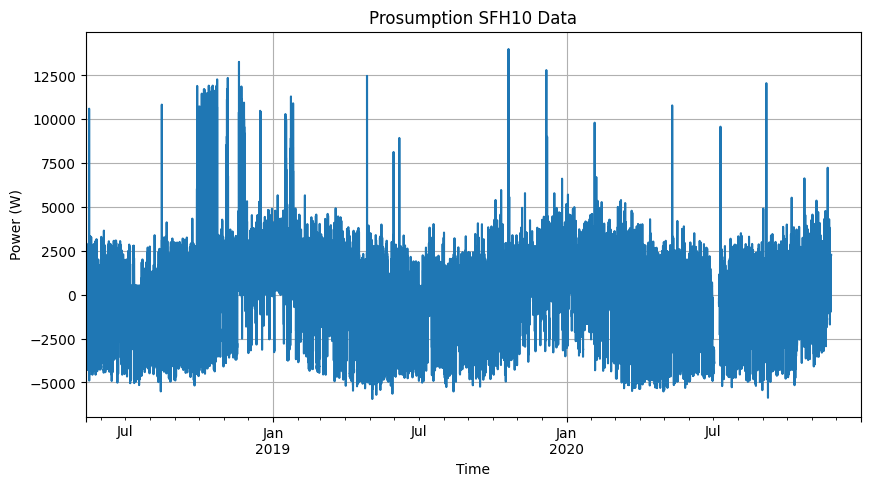

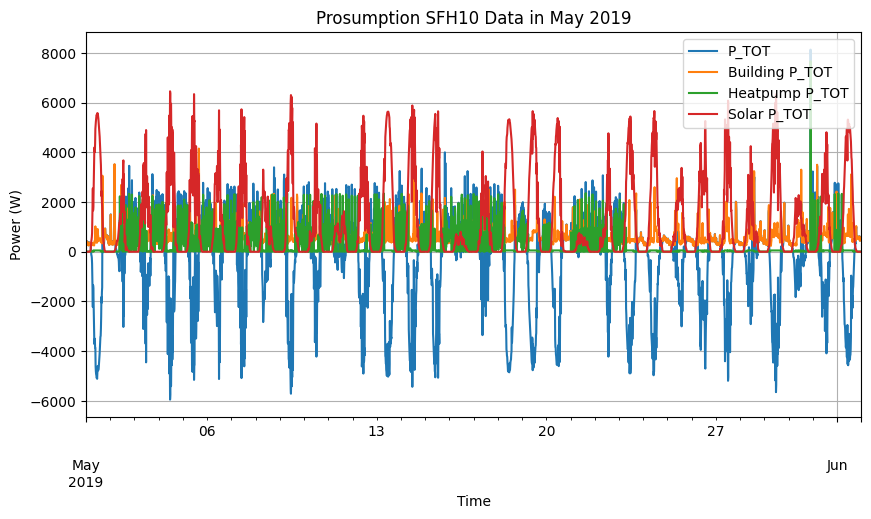

'Train period: 2018-05-13 08:30:00+00:00 to 2019-05-13 08:30:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 08:30:00+00:00 to 2020-05-13 08:30:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 08:30:00+00:00 to 2020-12-31 23:45:00+00:00 contains 232 days 15:15:00'

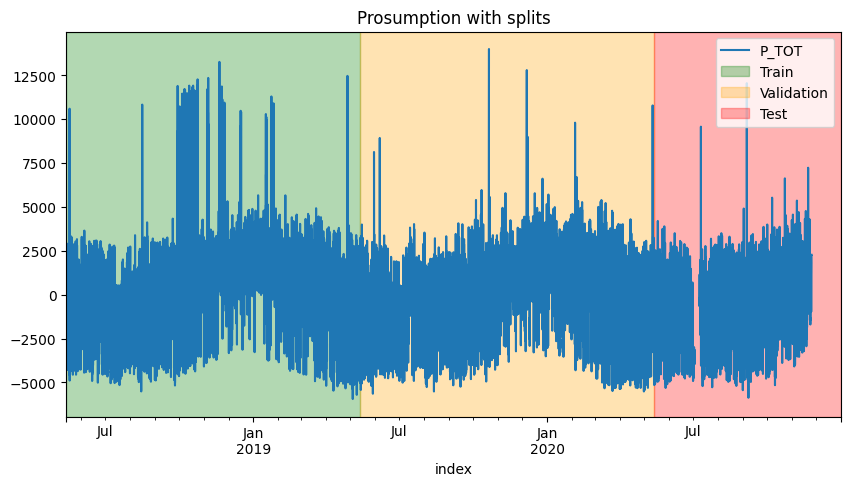

----------------------------------------------------
Calculating prosumption DataFrame for SFH12 with misc_key SOUTH...
Calculated PV factor for SFH12 with 21 resulting modules and 58 modules in the metadata is 0.36
Prosumption data for SFH12 saved to prosumption_data/15min/prosumption_SFH12_num_pv_modules_21_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH12 with PV factor 0.3620689655172414 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH12_num_pv_modules_21_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,91272.000000,91844.000000,91844.000000,91272.000000
mean,-99.756173,345.710615,272.874442,719.637153
std,1489.882894,535.253024,685.246828,1213.517595
min,-5150.735698,37.455000,10.089556,0.000000
25%,-404.433858,131.267889,11.048444,0.000000
50%,145.323000,175.457944,11.659333,18.473563
75%,289.510419,271.296971,32.304722,889.091523
max,8782.420434,7506.149891,6938.501109,5419.404023


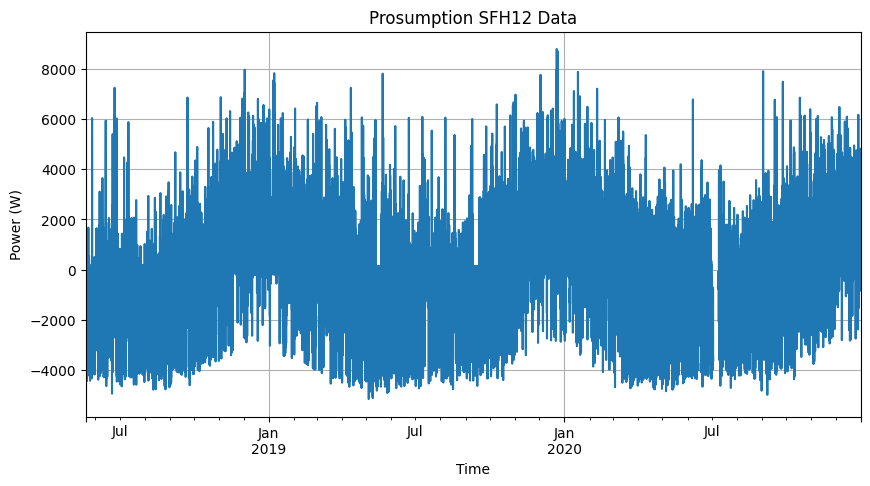

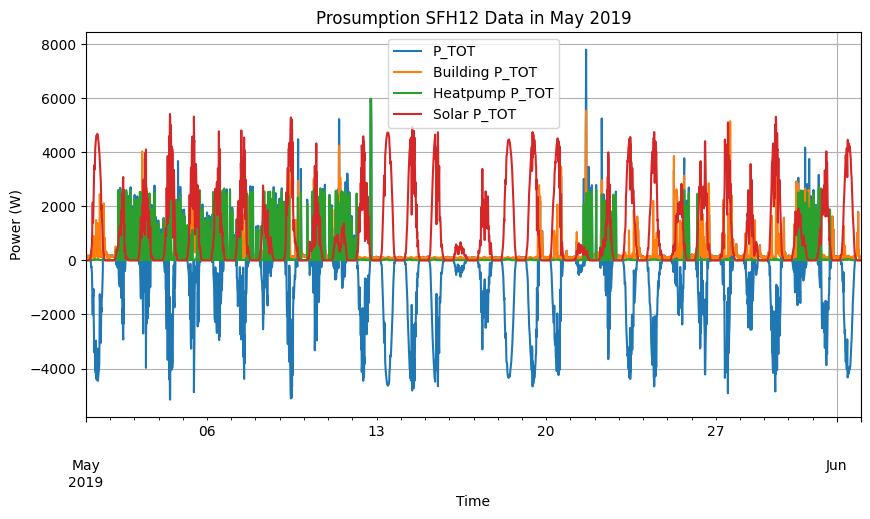

'Train period: 2018-05-20 07:00:00+00:00 to 2019-05-20 07:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-20 07:00:00+00:00 to 2020-05-20 07:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-20 07:00:00+00:00 to 2020-12-31 23:45:00+00:00 contains 225 days 16:45:00'

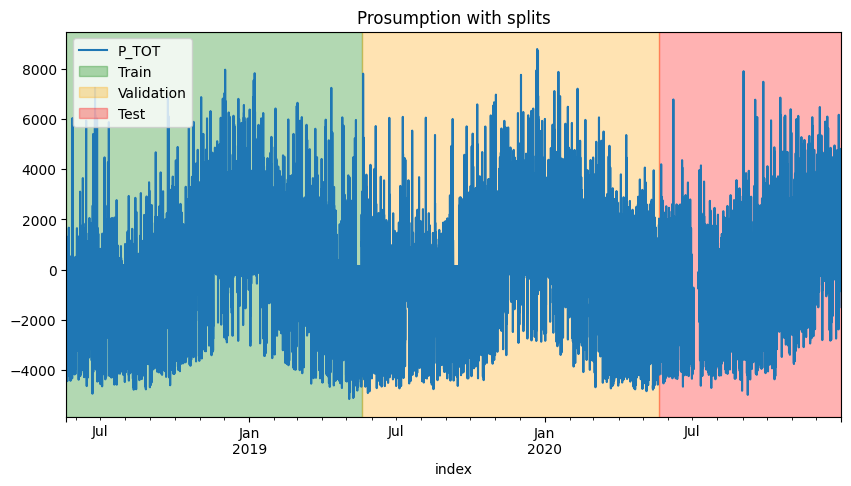

----------------------------------------------------
Calculating prosumption DataFrame for SFH14 with misc_key SOUTH...
Calculated PV factor for SFH14 with 28 resulting modules and 58 modules in the metadata is 0.48
Prosumption data for SFH14 saved to prosumption_data/15min/prosumption_SFH14_num_pv_modules_28_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH14 with PV factor 0.4827586206896552 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH14_num_pv_modules_28_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,91251.000000,91823.000000,91823.000000,91251.000000
mean,99.753712,276.075965,777.094361,958.560184
std,2675.406781,316.654208,1797.519175,1616.918293
min,-7037.755030,45.393667,10.510445,0.000000
25%,-778.011251,78.040444,27.071500,0.000000
50%,150.369111,160.402778,90.300111,24.588506
75%,791.868778,343.835222,395.500110,1184.024521
max,13171.876450,4231.674881,11758.050412,7225.872031


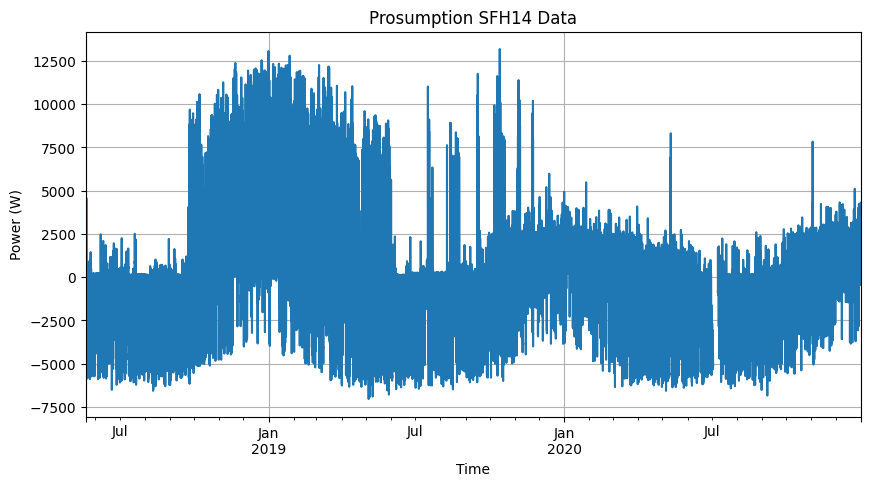

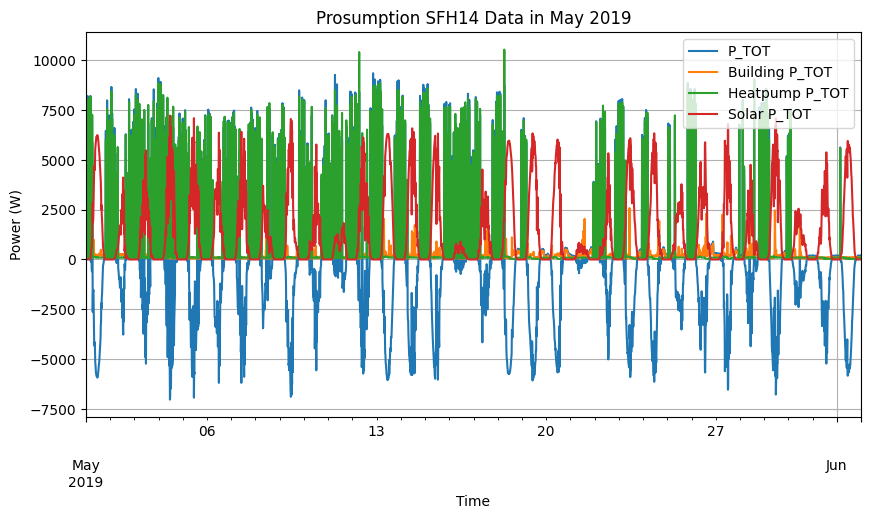

'Train period: 2018-05-20 12:15:00+00:00 to 2019-05-20 12:15:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-20 12:15:00+00:00 to 2020-05-20 12:15:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-20 12:15:00+00:00 to 2020-12-31 23:45:00+00:00 contains 225 days 11:30:00'

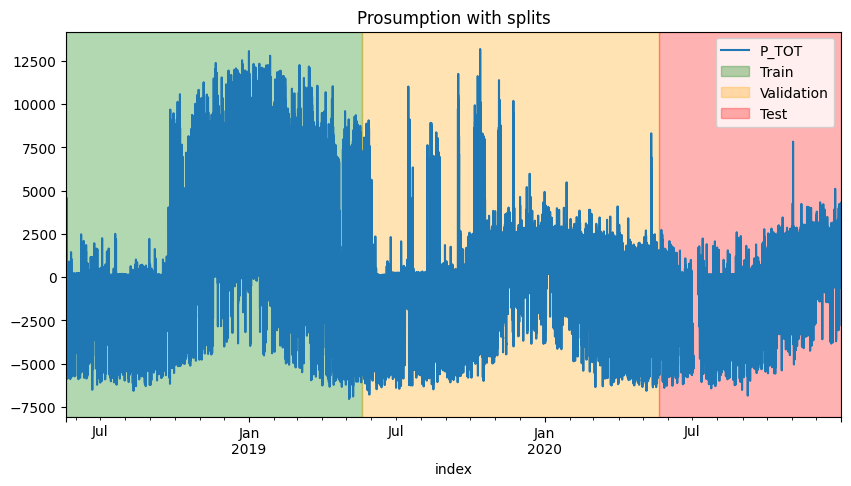

----------------------------------------------------
Calculating prosumption DataFrame for SFH16 with misc_key EAST...
Calculated PV factor for SFH16 with 25 resulting modules and 78 modules in the metadata is 0.32
Prosumption data for SFH16 saved to prosumption_data/15min/prosumption_SFH16_num_pv_modules_25_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH16 with PV factor 0.32051282051282054 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH16_num_pv_modules_25_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,91741.000000,91741.000000,91741.000000,91741.000000
mean,-109.510667,257.371893,308.039602,674.922163
std,1489.852577,384.293477,756.692835,1124.780251
min,-5275.516683,35.413333,1.251000,0.000000
25%,-519.598583,91.299111,10.780778,0.000000
50%,133.282000,126.763111,66.199334,14.957265
75%,484.642110,226.184445,241.137223,888.080484
max,14371.269840,4557.787459,13242.189407,5435.220798


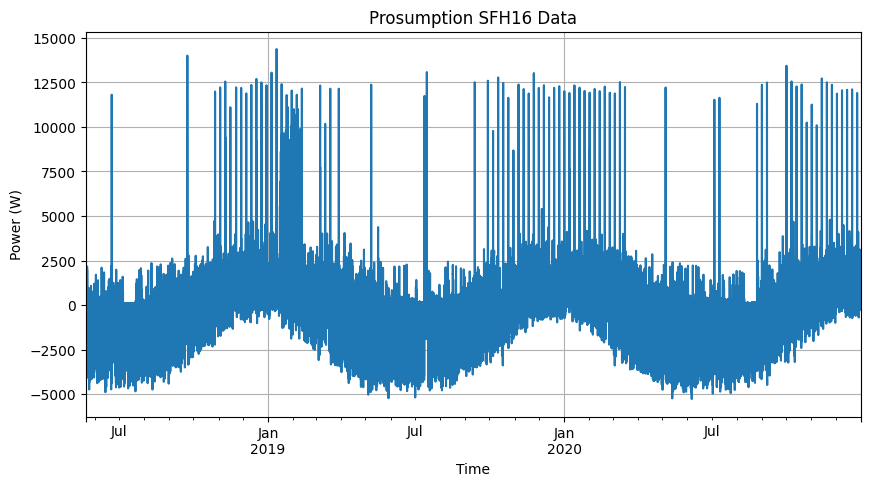

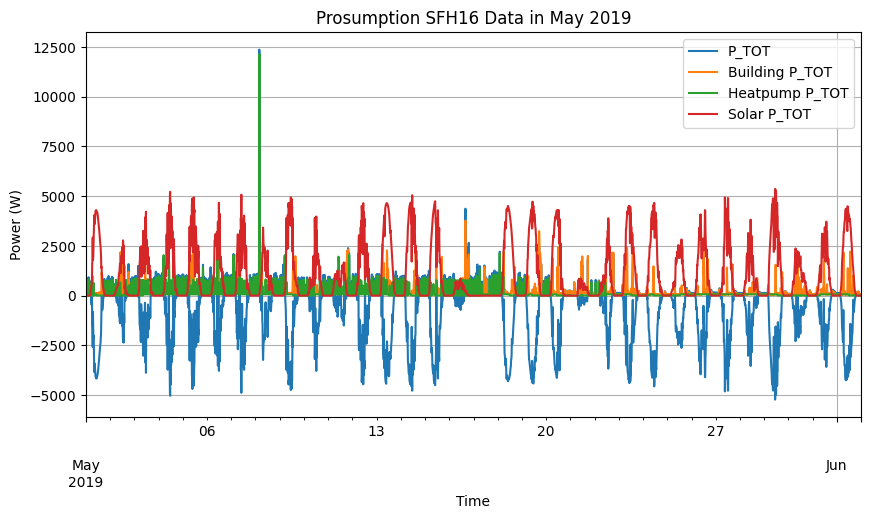

'Train period: 2018-05-21 08:45:00+00:00 to 2019-05-21 08:45:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-21 08:45:00+00:00 to 2020-05-21 08:45:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-21 08:45:00+00:00 to 2020-12-31 23:45:00+00:00 contains 224 days 15:00:00'

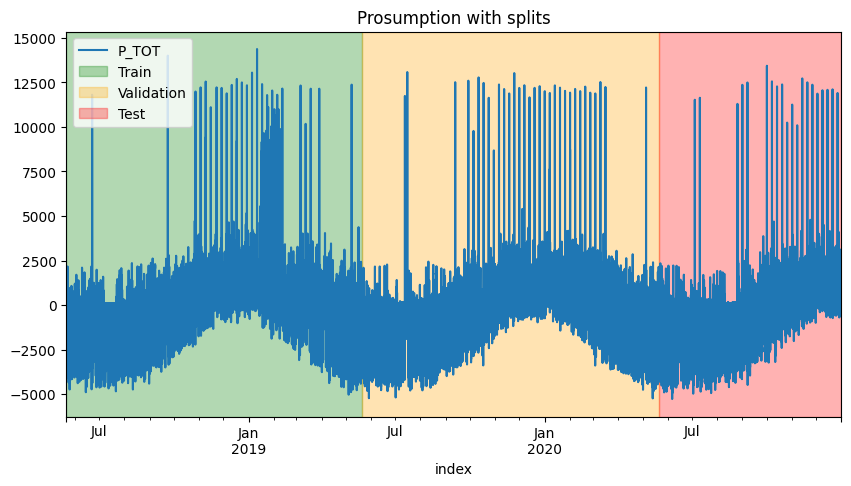

----------------------------------------------------
Calculating prosumption DataFrame for SFH18 with misc_key EAST...
Calculated PV factor for SFH18 with 16 resulting modules and 78 modules in the metadata is 0.21
Prosumption data for SFH18 saved to prosumption_data/15min/prosumption_SFH18_num_pv_modules_16_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH18 with PV factor 0.20512820512820512 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH18_num_pv_modules_16_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,91646.000000,91646.000000,91646.000000,91646.000000
mean,113.350204,336.803366,207.897664,431.350826
std,1031.353764,477.412362,504.004195,719.140272
min,-3233.571311,56.260945,0.000000,0.000000
25%,-176.062043,119.325306,10.174667,0.000000
50%,148.041678,175.147555,10.762444,9.496296
75%,446.632109,312.073777,67.969000,567.376638
max,11055.091571,6840.609785,9291.807456,3478.541311


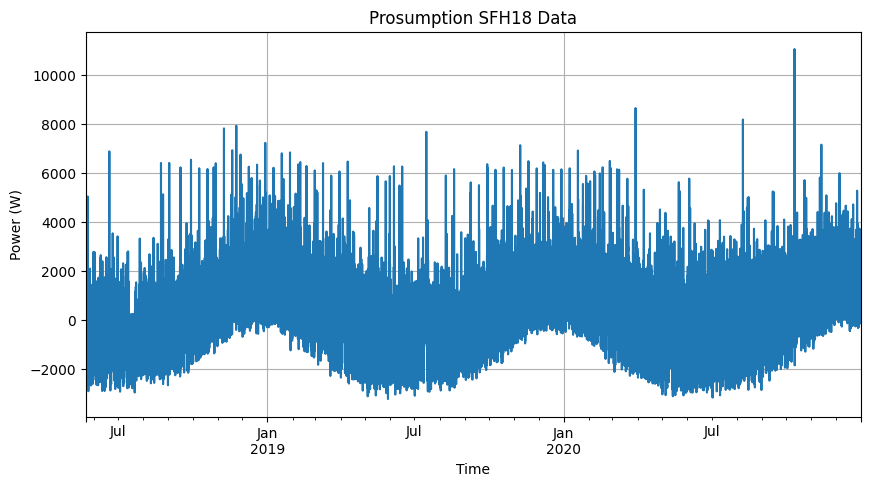

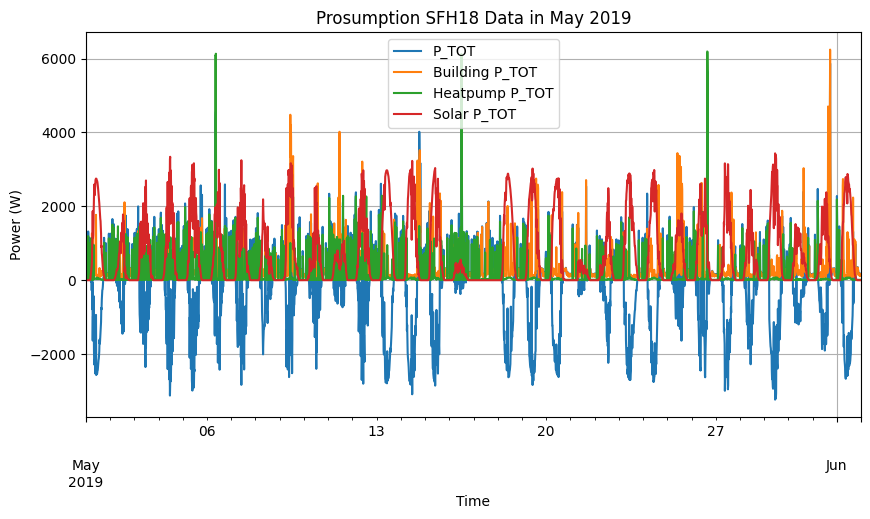

'Train period: 2018-05-22 08:30:00+00:00 to 2019-05-22 08:30:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-22 08:30:00+00:00 to 2020-05-22 08:30:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-22 08:30:00+00:00 to 2020-12-31 23:45:00+00:00 contains 223 days 15:15:00'

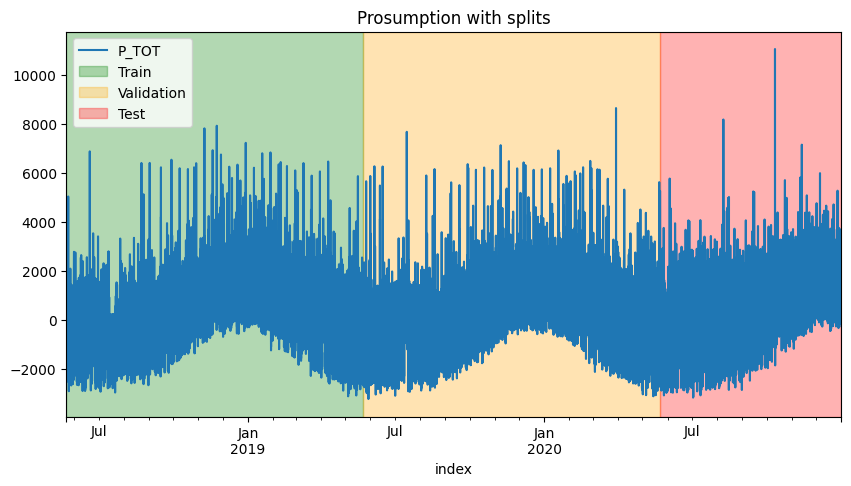

----------------------------------------------------
Calculating prosumption DataFrame for SFH19 with misc_key EAST...
Calculated PV factor for SFH19 with 38 resulting modules and 78 modules in the metadata is 0.49
Prosumption data for SFH19 saved to prosumption_data/15min/prosumption_SFH19_num_pv_modules_38_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH19 with PV factor 0.48717948717948717 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH19_num_pv_modules_38_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,91626.000000,91626.000000,91626.000000,91626.000000
mean,-429.724940,366.755246,227.057289,1023.537475
std,1879.516481,353.885358,483.905011,1706.838998
min,-7919.575503,54.426334,0.866556,0.000000
25%,-841.530489,220.183140,10.243556,0.000000
50%,237.678762,282.237555,10.472500,22.364245
75%,467.532223,362.305334,194.553305,1345.861752
max,7708.761374,5941.423665,7028.863121,8261.535613


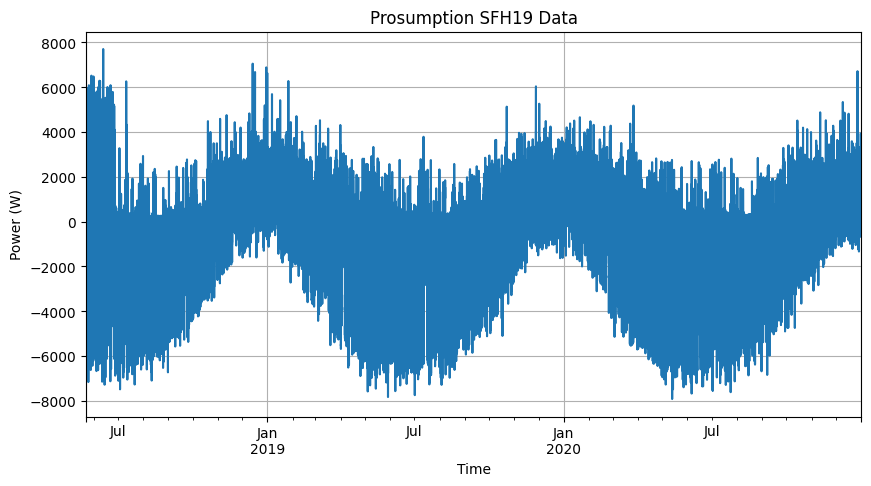

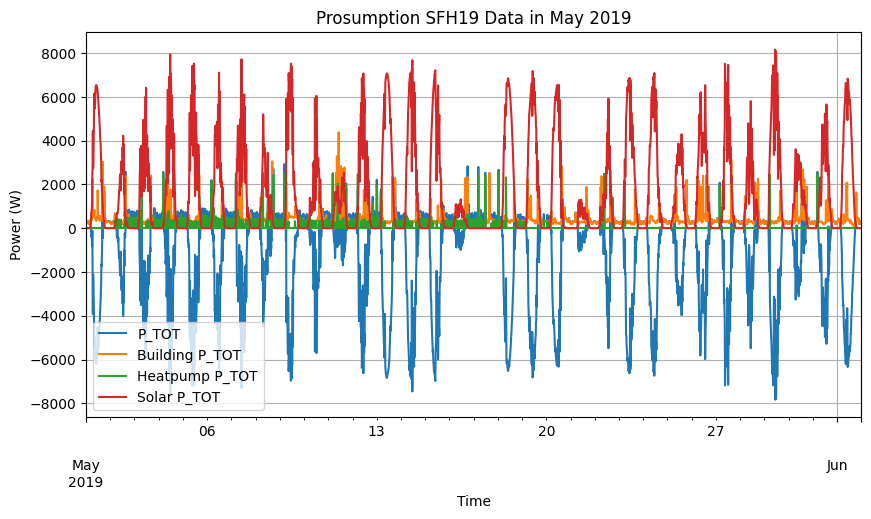

'Train period: 2018-05-22 13:30:00+00:00 to 2019-05-22 13:30:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-22 13:30:00+00:00 to 2020-05-22 13:30:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-22 13:30:00+00:00 to 2020-12-31 23:45:00+00:00 contains 223 days 10:15:00'

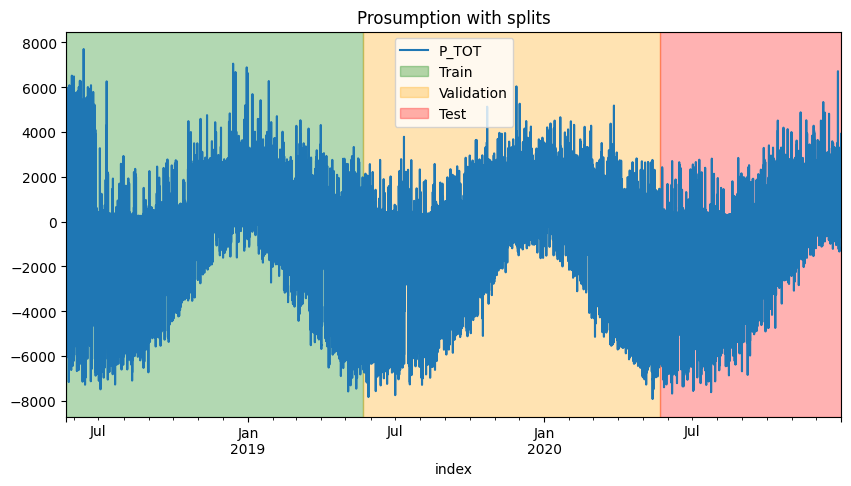

----------------------------------------------------
Calculating prosumption DataFrame for SFH22 with misc_key EAST...
Calculated PV factor for SFH22 with 21 resulting modules and 78 modules in the metadata is 0.27
Prosumption data for SFH22 saved to prosumption_data/15min/prosumption_SFH22_num_pv_modules_21_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH22 with PV factor 0.2692307692307692 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH22_num_pv_modules_21_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,90979.000000,90979.000000,90979.000000,90979.000000
mean,658.955129,380.068003,841.532401,562.645275
std,1935.652765,384.379287,1435.008372,940.813545
min,-4299.881026,76.151555,0.489889,0.000000
25%,-215.300727,180.423000,11.403333,0.000000
50%,319.103990,247.371555,27.359000,11.819231
75%,1517.844888,422.704723,1210.780999,736.026068
max,10680.402151,4869.955682,7567.633561,4565.585470


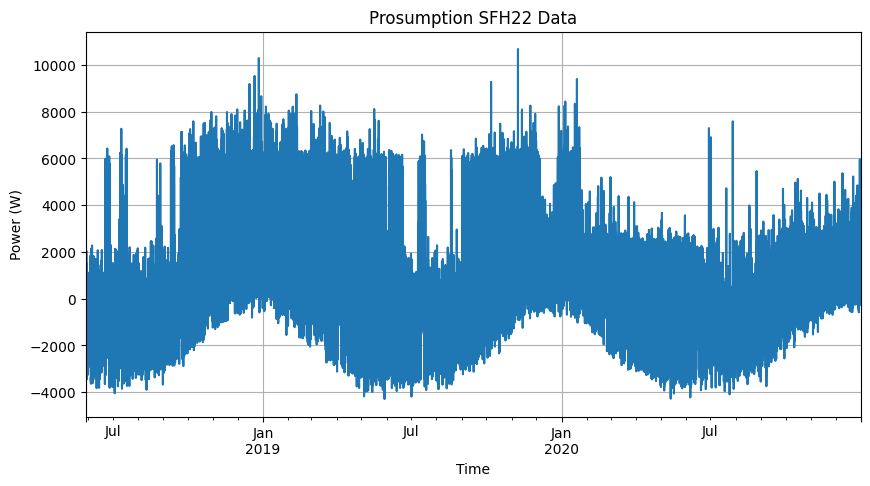

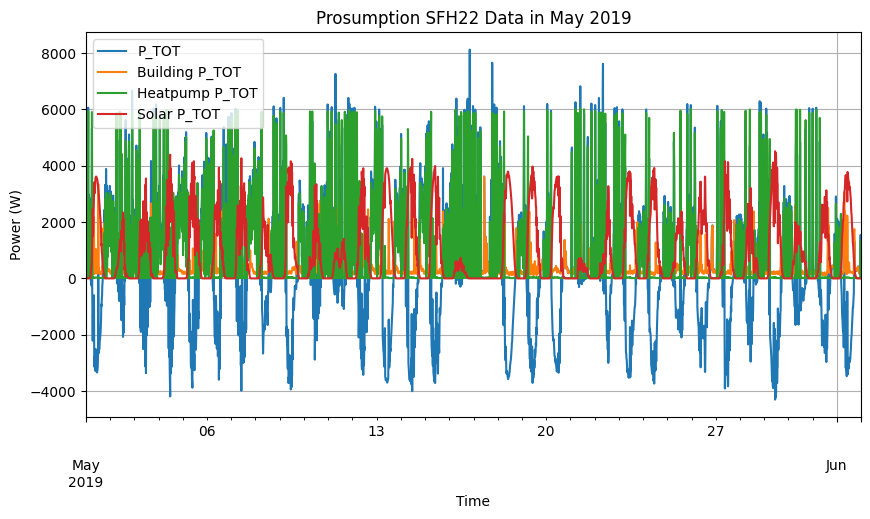

'Train period: 2018-05-29 07:15:00+00:00 to 2019-05-29 07:15:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-29 07:15:00+00:00 to 2020-05-29 07:15:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-29 07:15:00+00:00 to 2020-12-31 23:45:00+00:00 contains 216 days 16:30:00'

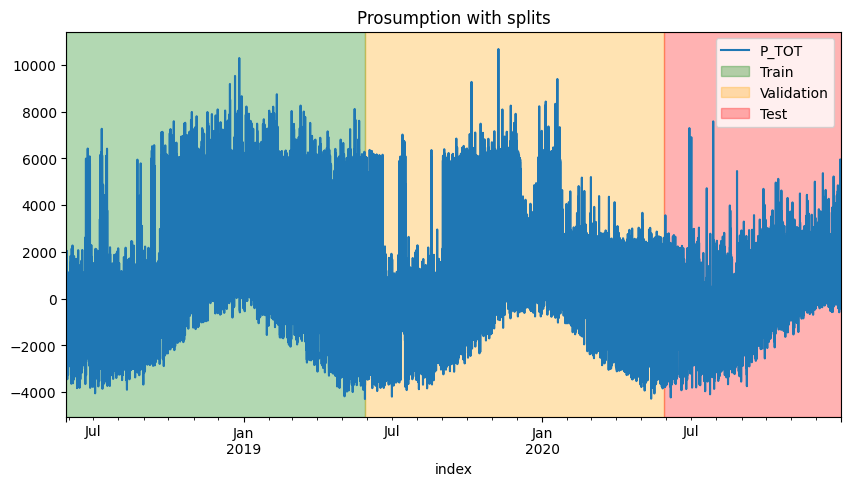

----------------------------------------------------
Calculating prosumption DataFrame for SFH27 with misc_key WEST...
Calculated PV factor for SFH27 with 20 resulting modules and 78 modules in the metadata is 0.26
Prosumption data for SFH27 saved to prosumption_data/15min/prosumption_SFH27_num_pv_modules_20_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH27 with PV factor 0.2564102564102564 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH27_num_pv_modules_20_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,91069.000000,91069.000000,91069.000000,91069.000000
mean,-182.819890,126.973772,238.437876,548.231539
std,1066.291180,141.060604,410.326824,907.159217
min,-4363.329174,31.658444,0.539222,0.000000
25%,-457.390582,73.160055,11.212778,0.000000
50%,97.317222,101.168778,34.295445,18.242165
75%,415.575256,131.361333,400.044222,732.390313
max,6129.316656,3432.274903,6043.308431,4408.233618


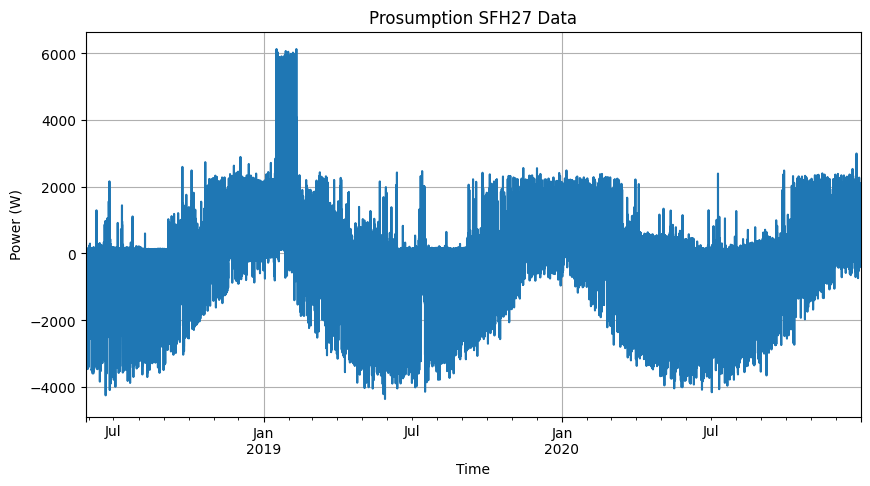

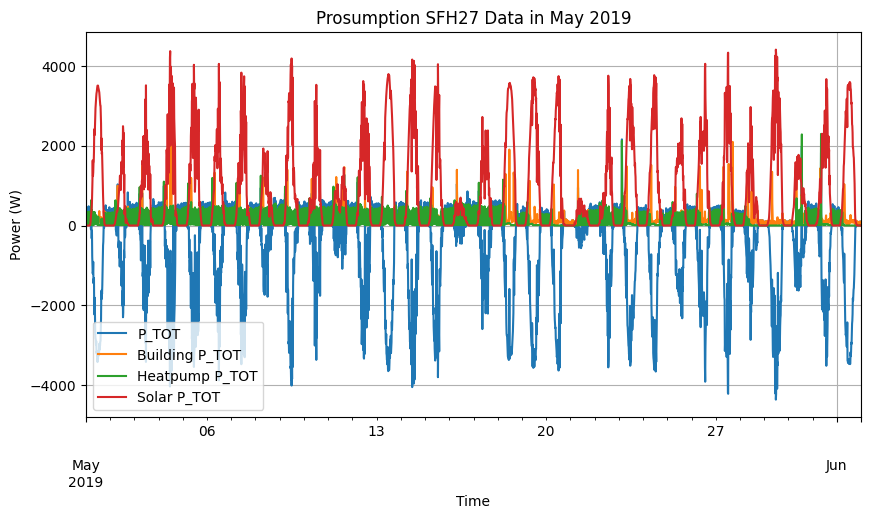

'Train period: 2018-05-28 08:45:00+00:00 to 2019-05-28 08:45:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-28 08:45:00+00:00 to 2020-05-28 08:45:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-28 08:45:00+00:00 to 2020-12-31 23:45:00+00:00 contains 217 days 15:00:00'

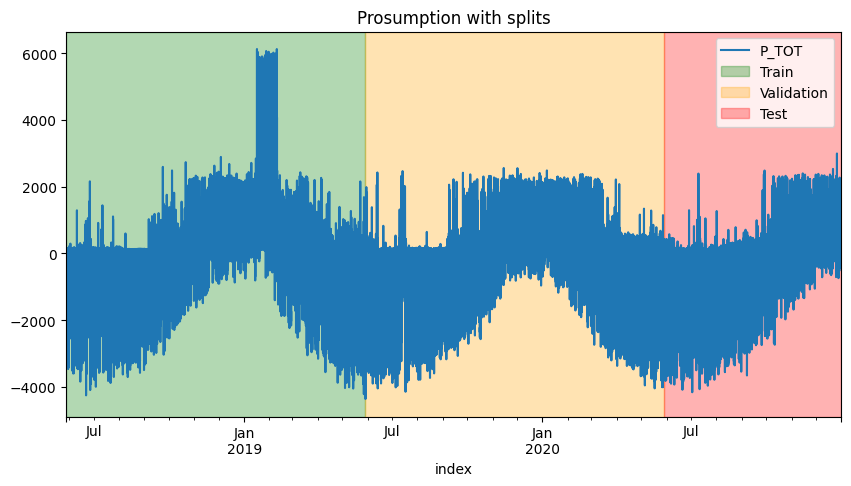

----------------------------------------------------
Calculating prosumption DataFrame for SFH28 with misc_key WEST...
Calculated PV factor for SFH28 with 27 resulting modules and 78 modules in the metadata is 0.35
Prosumption data for SFH28 saved to prosumption_data/15min/prosumption_SFH28_num_pv_modules_27_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH28 with PV factor 0.34615384615384615 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH28_num_pv_modules_27_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,91050.000000,91050.000000,91050.000000,91050.000000
mean,246.502940,358.269707,627.656581,739.423348
std,1849.411812,399.563175,1163.558454,1223.841659
min,-5841.641769,24.686111,0.000000,0.000000
25%,-339.078027,142.153112,10.616778,0.000000
50%,196.974500,201.693223,13.412167,24.536538
75%,1003.016280,446.785222,901.030807,987.113462
max,9954.303865,4795.629225,8033.197683,5951.115385


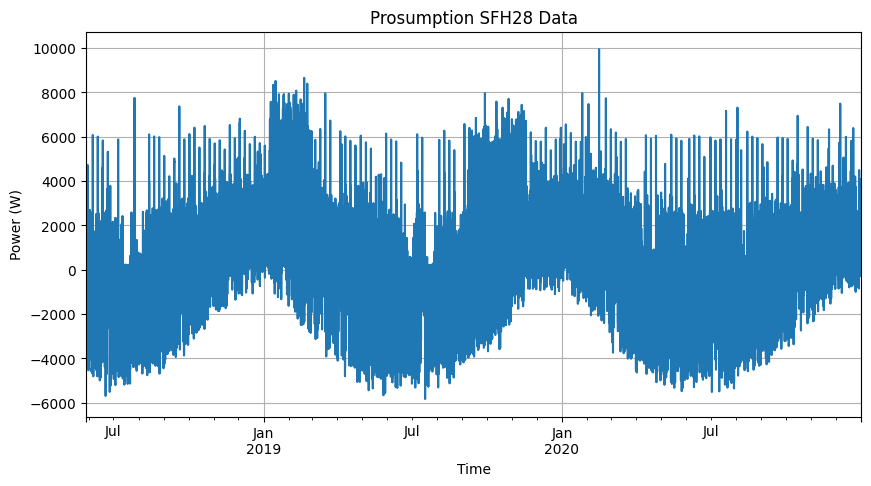

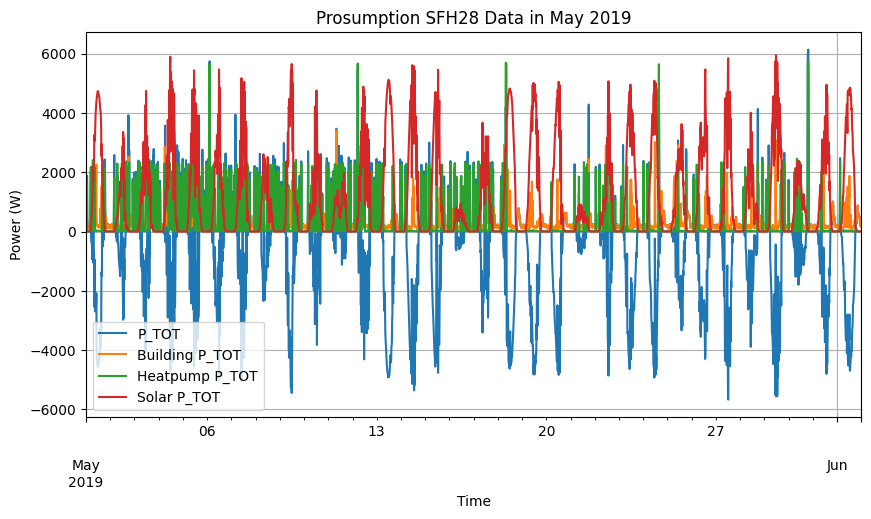

'Train period: 2018-05-28 13:30:00+00:00 to 2019-05-28 13:30:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-28 13:30:00+00:00 to 2020-05-28 13:30:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-28 13:30:00+00:00 to 2020-12-31 23:45:00+00:00 contains 217 days 10:15:00'

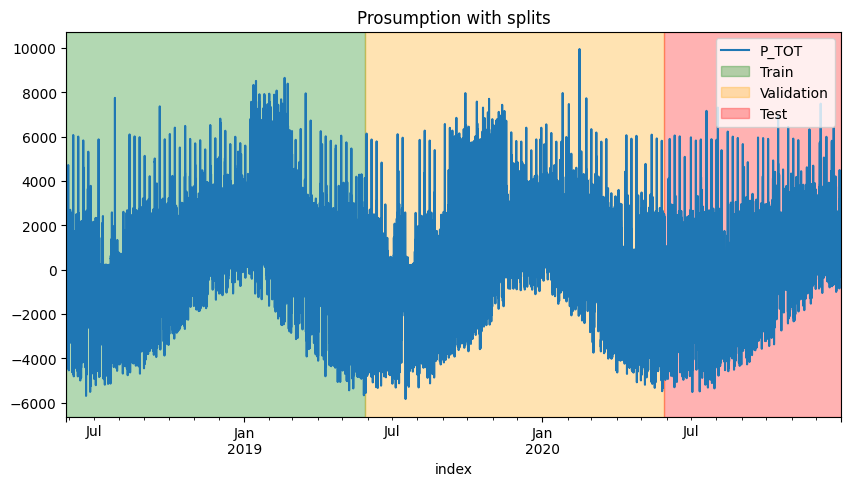

----------------------------------------------------
Calculating prosumption DataFrame for SFH29 with misc_key WEST...
Calculated PV factor for SFH29 with 19 resulting modules and 78 modules in the metadata is 0.24
Prosumption data for SFH29 saved to prosumption_data/15min/prosumption_SFH29_num_pv_modules_19_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH29 with PV factor 0.24358974358974358 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH29_num_pv_modules_19_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,90979.000000,90979.000000,90979.000000,90979.000000
mean,-69.710710,162.040110,288.563144,520.313964
std,1189.785173,220.724438,632.718888,861.265960
min,-4013.504727,2.339889,0.000000,0.000000
25%,-466.547895,89.175556,11.495056,0.000000
50%,128.015919,109.526556,60.436778,17.243447
75%,403.577700,151.848611,274.235502,694.551496
max,8012.534864,4586.969466,5876.250000,4187.821937


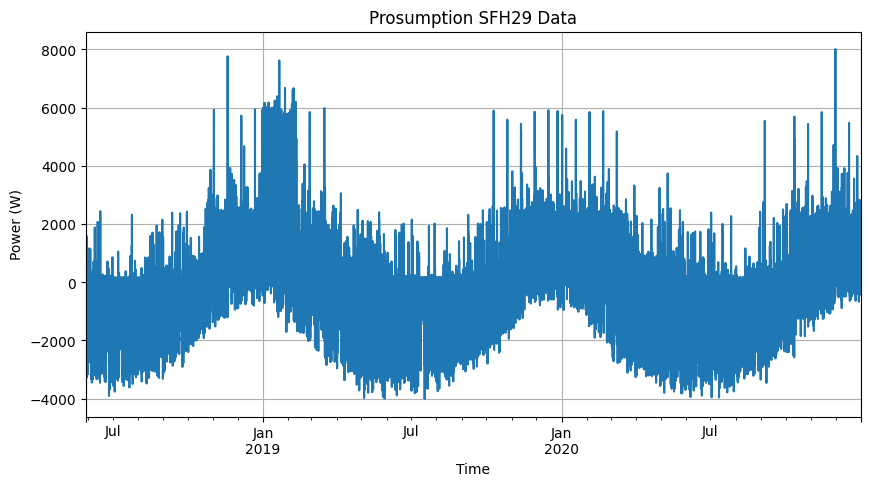

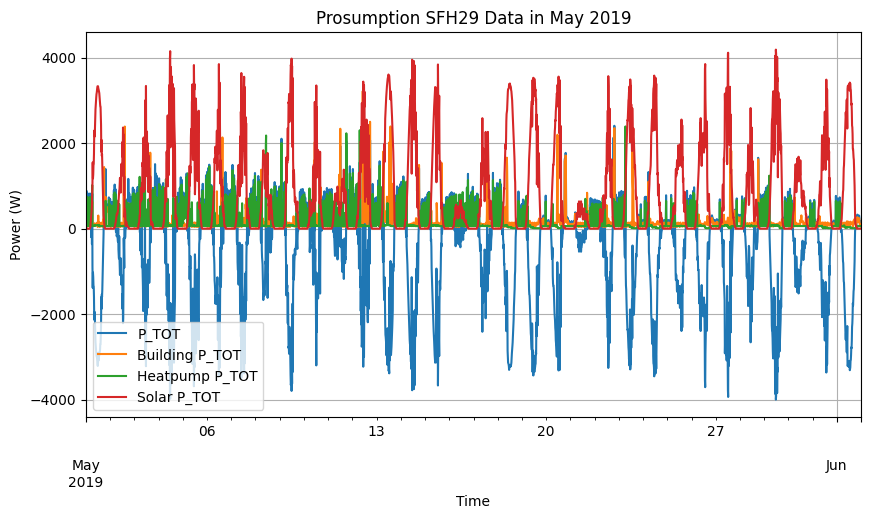

'Train period: 2018-05-29 07:15:00+00:00 to 2019-05-29 07:15:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-29 07:15:00+00:00 to 2020-05-29 07:15:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-29 07:15:00+00:00 to 2020-12-31 23:45:00+00:00 contains 216 days 16:30:00'

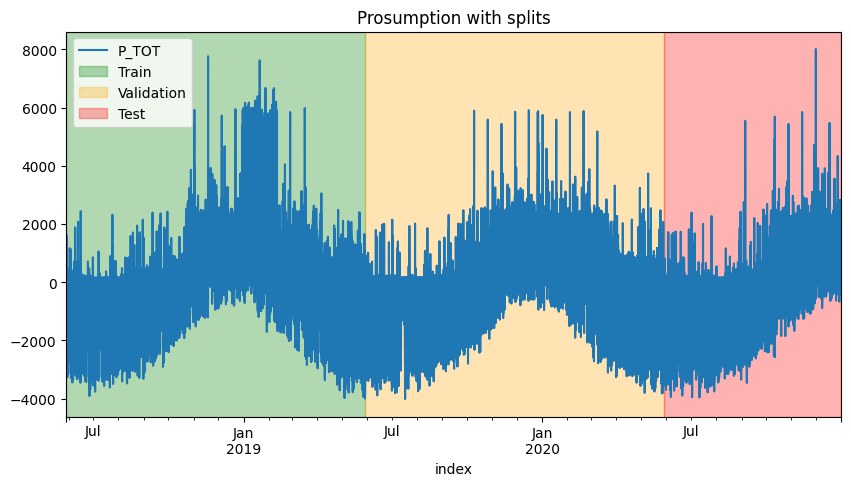

----------------------------------------------------
Calculating prosumption DataFrame for SFH30 with misc_key WEST...
Calculated PV factor for SFH30 with 18 resulting modules and 78 modules in the metadata is 0.23
Prosumption data for SFH30 saved to prosumption_data/15min/prosumption_SFH30_num_pv_modules_18_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH30 with PV factor 0.23076923076923078 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH30_num_pv_modules_18_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,90964.000000,90964.000000,90964.000000,90964.000000
mean,-77.649964,251.845065,163.136843,492.631872
std,1032.925339,323.939943,510.898278,815.657899
min,-3790.729445,26.059889,0.593222,0.000000
25%,-316.436695,93.230583,10.727555,0.000000
50%,92.180500,151.308055,11.200444,16.284615
75%,229.003263,258.095527,51.656139,657.260256
max,9905.584998,4804.072998,7803.020768,3967.410256


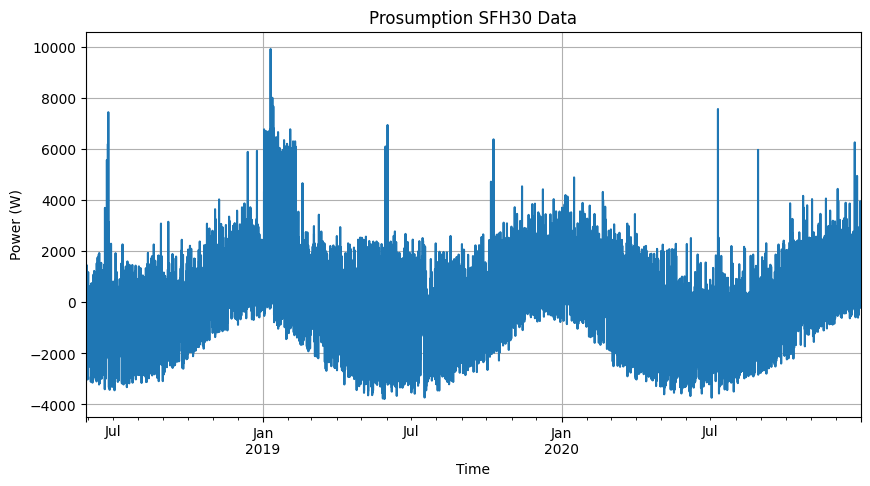

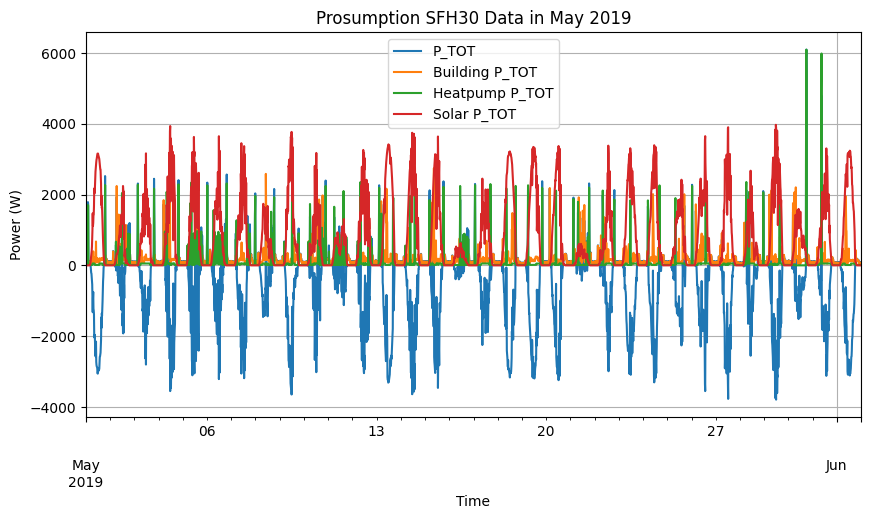

'Train period: 2018-05-29 11:00:00+00:00 to 2019-05-29 11:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-29 11:00:00+00:00 to 2020-05-29 11:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-29 11:00:00+00:00 to 2020-12-31 23:45:00+00:00 contains 216 days 12:45:00'

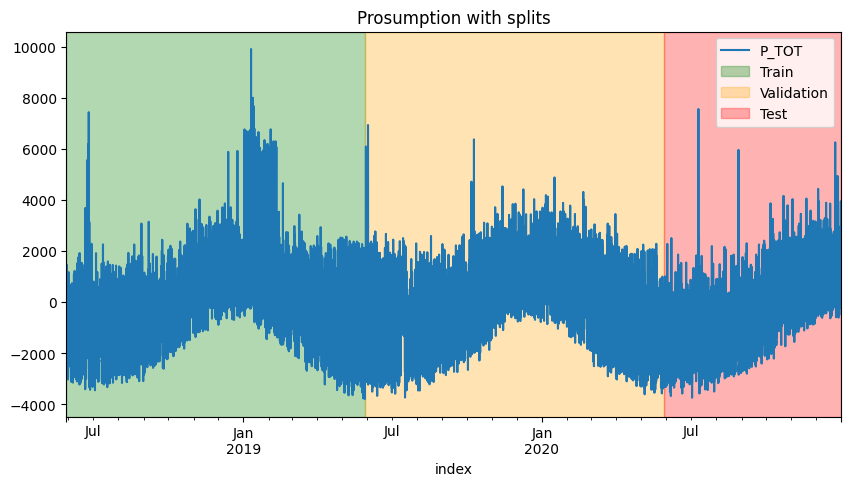

----------------------------------------------------
Calculating prosumption DataFrame for SFH32 with misc_key WEST...
Calculated PV factor for SFH32 with 30 resulting modules and 78 modules in the metadata is 0.38
Prosumption data for SFH32 saved to prosumption_data/15min/prosumption_SFH32_num_pv_modules_30_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH32 with PV factor 0.38461538461538464 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH32_num_pv_modules_30_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,90489.000000,90489.000000,90489.000000,90489.000000
mean,-204.214717,306.073087,308.760088,819.047892
std,1566.205736,381.638917,588.723343,1358.156906
min,-6400.303803,45.357666,0.950000,0.000000
25%,-539.159275,125.245667,36.638889,0.000000
50%,196.107531,202.322555,67.053444,26.047009
75%,570.719332,348.254558,419.941553,1090.478632
max,8583.783916,5878.461239,7882.805648,6612.350427


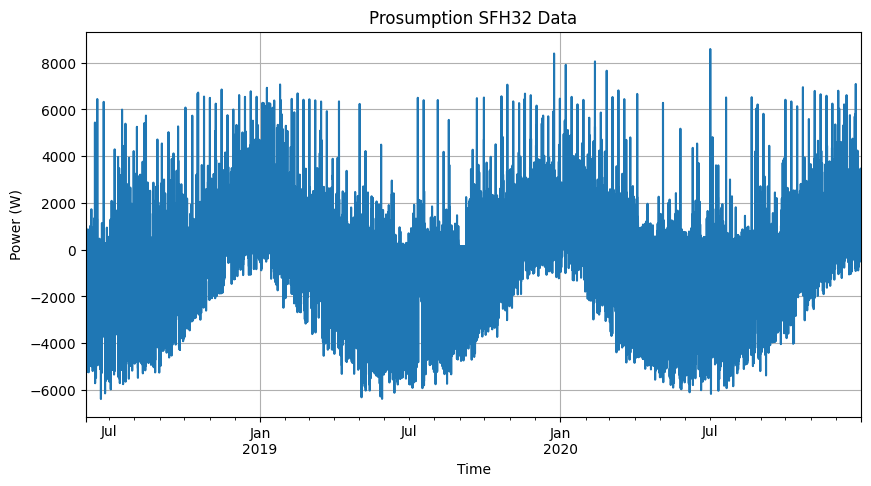

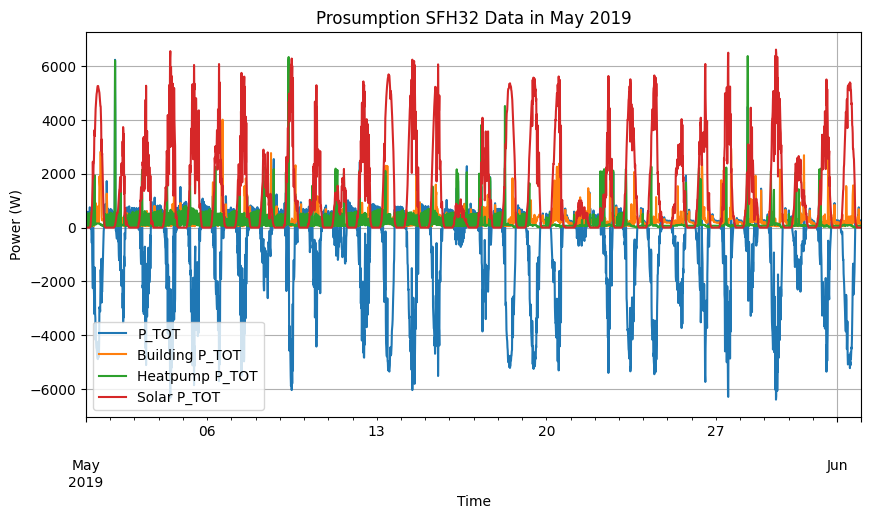

'Train period: 2018-06-03 09:45:00+00:00 to 2019-06-03 09:45:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-06-03 09:45:00+00:00 to 2020-06-03 09:45:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-06-03 09:45:00+00:00 to 2020-12-31 23:45:00+00:00 contains 211 days 14:00:00'

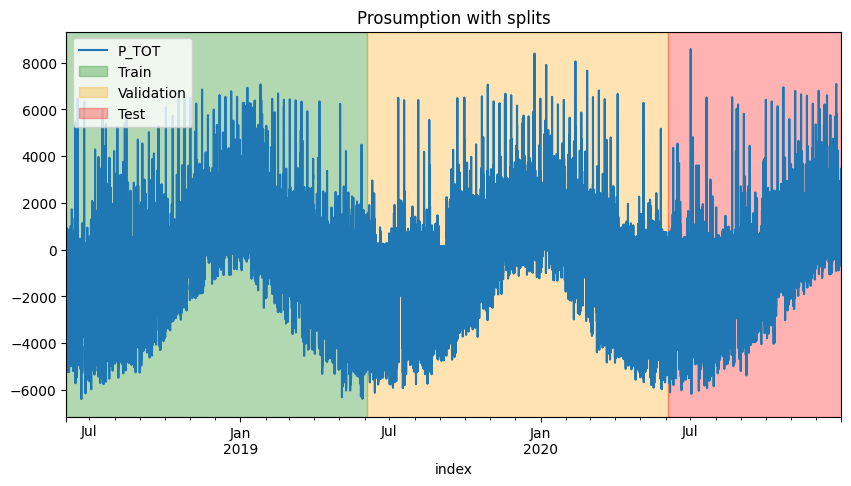

----------------------------------------------------
Calculating prosumption DataFrame for SFH36 with misc_key WEST...
Calculated PV factor for SFH36 with 20 resulting modules and 78 modules in the metadata is 0.26
Prosumption data for SFH36 saved to prosumption_data/15min/prosumption_SFH36_num_pv_modules_20_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH36 with PV factor 0.2564102564102564 and Heatpump factor 1.0 saved to prosumption_data/15min/prosumption_SFH36_num_pv_modules_20_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,90192.000000,90192.000000,90192.000000,90192.000000
mean,42.740447,313.927752,273.153024,544.340329
std,1186.983872,342.086033,654.871293,903.824568
min,-4152.950730,49.741444,0.895333,0.000000
25%,-249.711056,139.083000,11.293222,0.000000
50%,162.954824,225.287000,56.114055,17.054131
75%,453.513236,316.324944,263.534305,723.346154
max,10510.850934,5311.598318,6052.615771,4408.233618


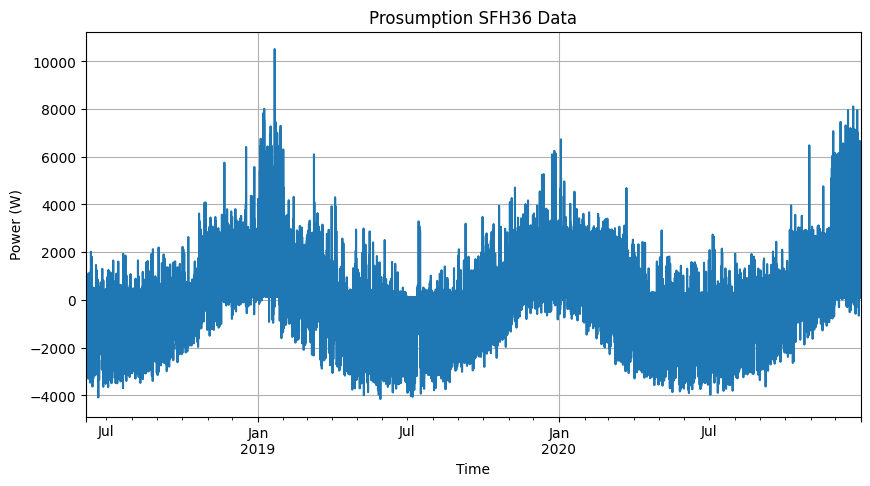

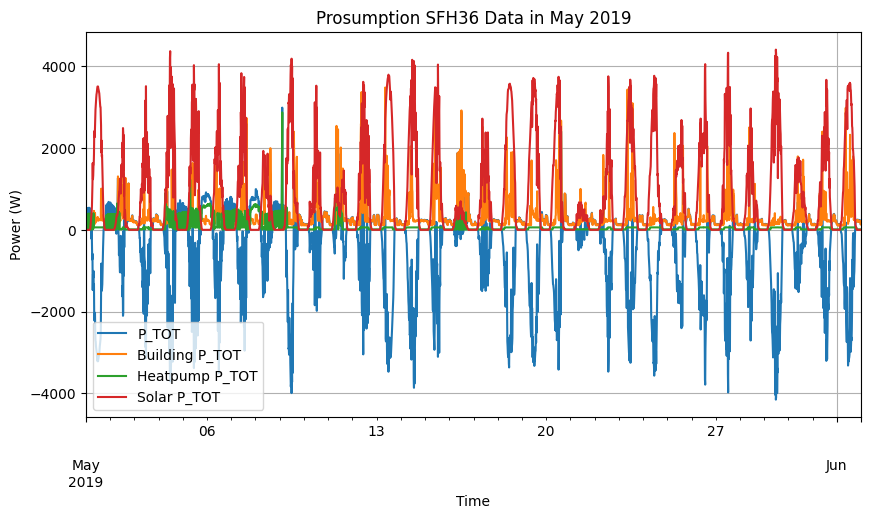

'Train period: 2018-06-06 12:00:00+00:00 to 2019-06-06 12:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-06-06 12:00:00+00:00 to 2020-06-06 12:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-06-06 12:00:00+00:00 to 2020-12-31 23:45:00+00:00 contains 208 days 11:45:00'

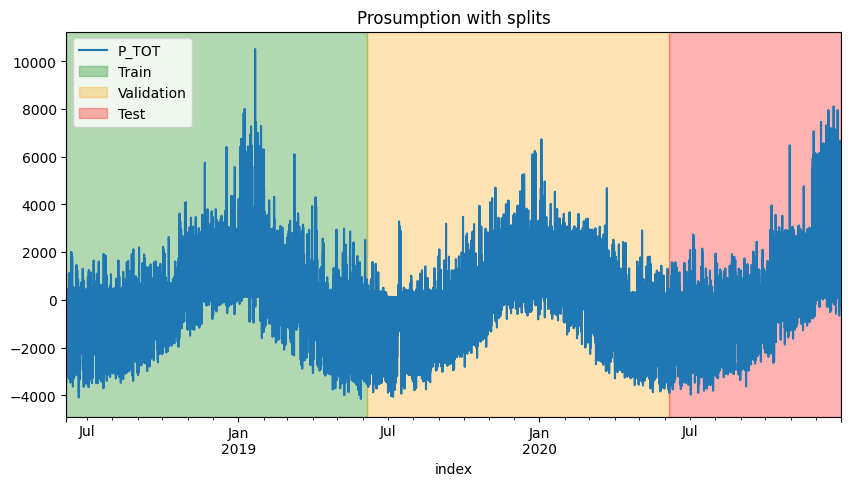

In [16]:
# 15 min data
for sfh in south_facing:
    calculate_and_save_prosumption(building_data=building_data_15min, heatpump_data=heatpump_data_15min, misc_data=misc_data_15min, meta_data=meta_houshold_data_15min, meta_solar_data=meta_solar_data, building_name=sfh , misc_key='SOUTH',  heatpump_factor=1.0, verbose=True)
for sfh in east_facing:
    calculate_and_save_prosumption(building_data=building_data_15min, heatpump_data=heatpump_data_15min, misc_data=misc_data_15min,  meta_data=meta_houshold_data_15min, meta_solar_data=meta_solar_data, building_name=sfh , misc_key='EAST',  heatpump_factor=1.0, verbose=True)
for sfh in west_facing:
    calculate_and_save_prosumption(building_data=building_data_15min, heatpump_data=heatpump_data_15min, misc_data=misc_data_15min,  meta_data=meta_houshold_data_15min, meta_solar_data=meta_solar_data, building_name=sfh , misc_key='WEST',  heatpump_factor=1.0, verbose=True)

----------------------------------------------------
Calculating prosumption DataFrame for SFH3 with misc_key SOUTH...
Calculated PV factor for SFH3 with 26 resulting modules and 58 modules in the metadata is 0.45
Prosumption data for SFH3 saved to prosumption_data/60min/prosumption_SFH3_num_pv_modules_26_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH3 with PV factor 0.4482758620689655 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH3_num_pv_modules_26_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22989.000000,23132.000000,23132.000000,22989.000000
mean,-391.729669,230.711931,269.482958,893.366050
std,1663.512276,246.905584,579.475283,1471.544800
min,-5986.682441,38.258833,10.222556,0.000000
25%,-736.053311,125.908403,11.223806,0.000000
50%,141.777556,160.938250,18.114833,31.313314
75%,338.409915,220.876840,290.926700,1193.600479
max,6849.255178,3999.154462,6114.556970,6167.013218


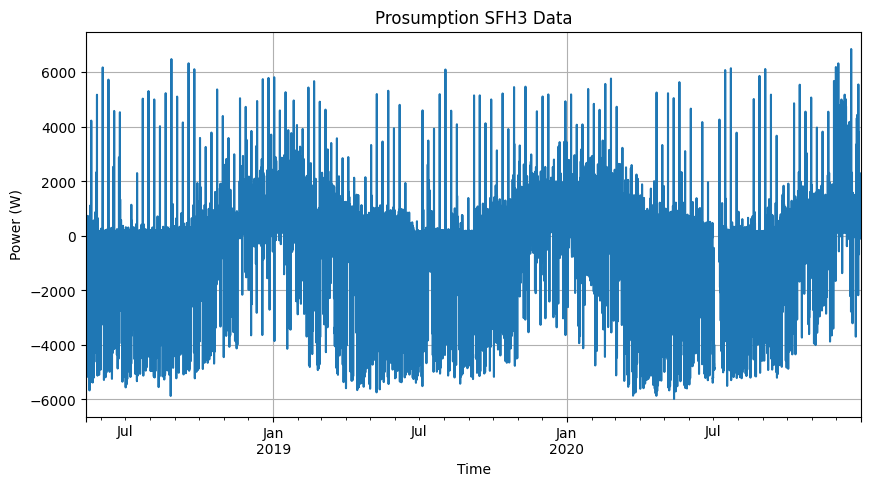

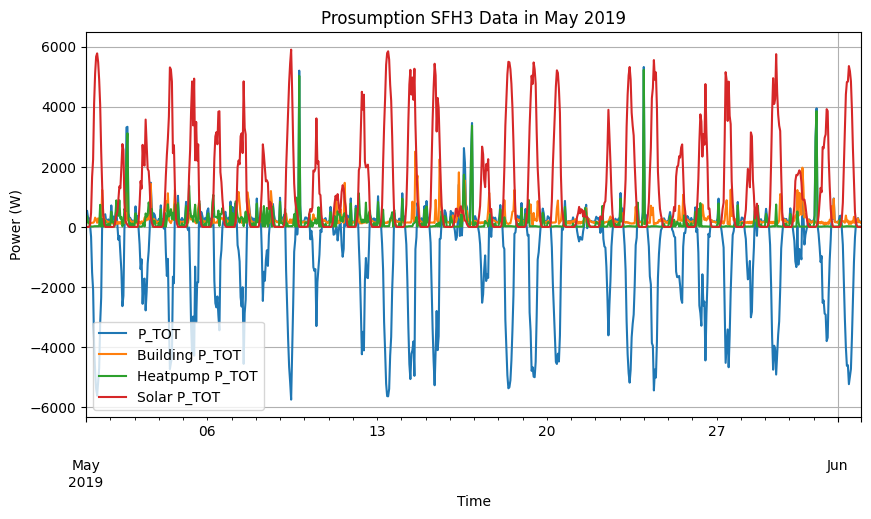

'Train period: 2018-05-13 04:00:00+00:00 to 2019-05-13 04:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 04:00:00+00:00 to 2020-05-13 04:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 04:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 232 days 19:00:00'

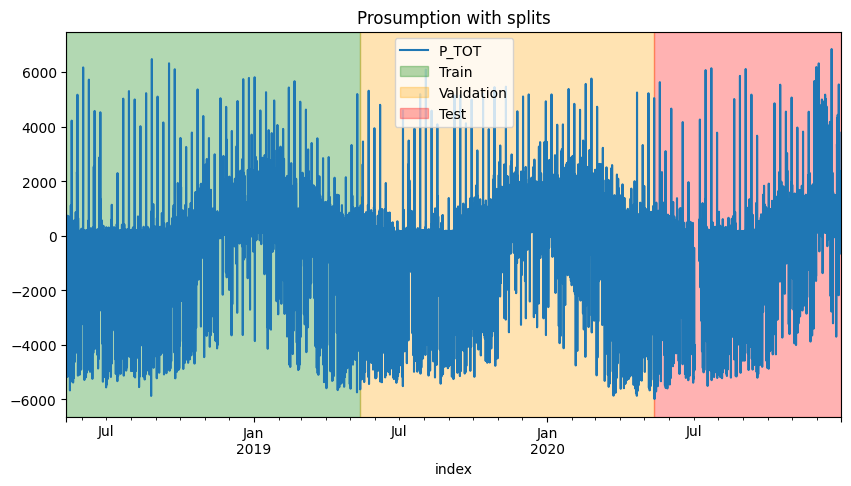

----------------------------------------------------
Calculating prosumption DataFrame for SFH4 with misc_key SOUTH...
Calculated PV factor for SFH4 with 30 resulting modules and 58 modules in the metadata is 0.52
Prosumption data for SFH4 saved to prosumption_data/60min/prosumption_SFH4_num_pv_modules_30_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH4 with PV factor 0.5172413793103449 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH4_num_pv_modules_30_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22984.000000,23127.000000,23127.000000,22984.000000
mean,-238.461008,355.056547,434.596783,1030.543596
std,1980.838469,239.614762,704.407502,1697.853888
min,-6873.343955,128.262361,10.024722,0.000000
25%,-783.123963,227.016861,11.308194,0.000000
50%,248.794736,291.326833,71.023583,36.063937
75%,942.274249,384.961569,729.588861,1375.732040
max,6401.700833,4201.779056,5923.698227,7115.784483


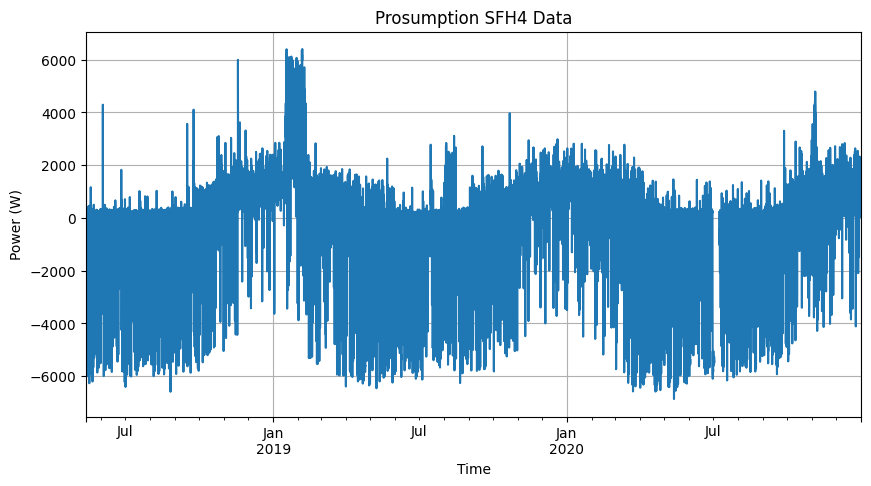

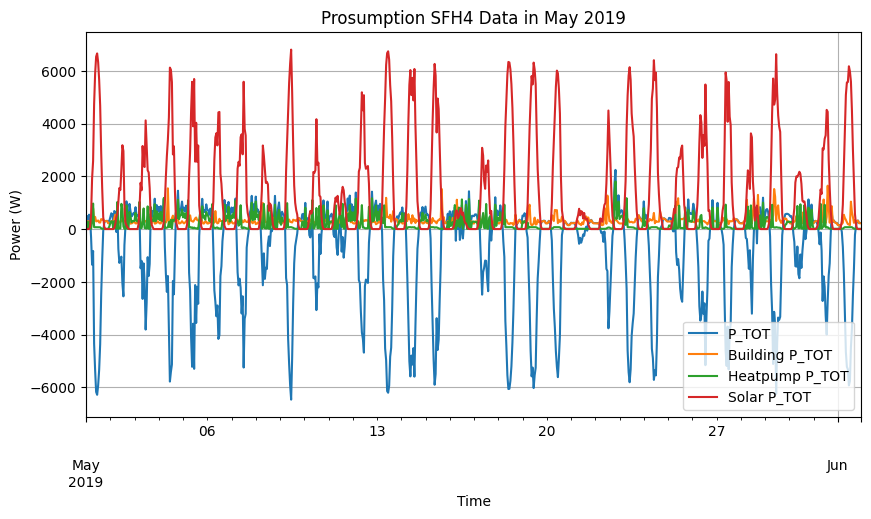

'Train period: 2018-05-13 09:00:00+00:00 to 2019-05-13 09:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 09:00:00+00:00 to 2020-05-13 09:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 09:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 232 days 14:00:00'

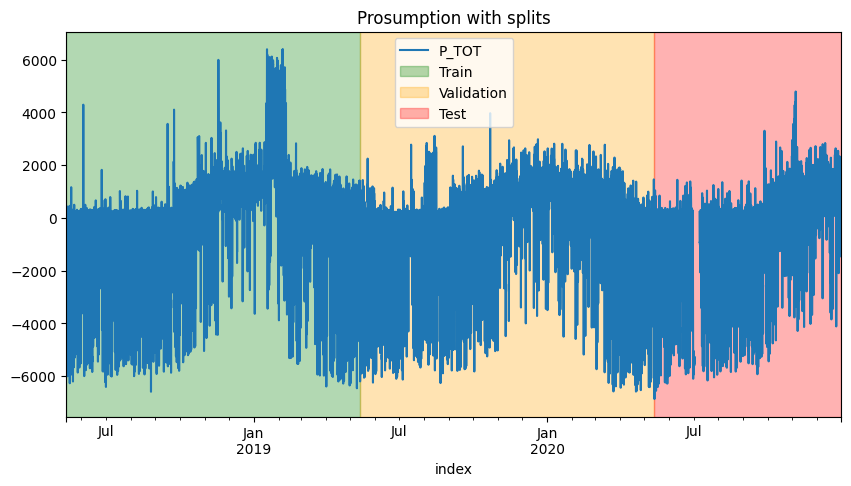

----------------------------------------------------
Calculating prosumption DataFrame for SFH9 with misc_key SOUTH...
Calculated PV factor for SFH9 with 36 resulting modules and 58 modules in the metadata is 0.62
Prosumption data for SFH9 saved to prosumption_data/60min/prosumption_SFH9_num_pv_modules_36_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH9 with PV factor 0.6206896551724138 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH9_num_pv_modules_36_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22986.000000,23129.000000,23129.000000,22986.000000
mean,73.377751,548.649070,759.678555,1236.974718
std,2297.890292,525.605268,642.721412,2037.636602
min,-7897.876622,83.528389,3.185250,0.000000
25%,-532.714838,232.954194,126.291306,0.000000
50%,804.805014,327.932056,701.669724,43.316379
75%,1467.785741,678.373889,1073.039945,1652.568534
max,6055.073311,4521.200106,4697.061486,8538.941379


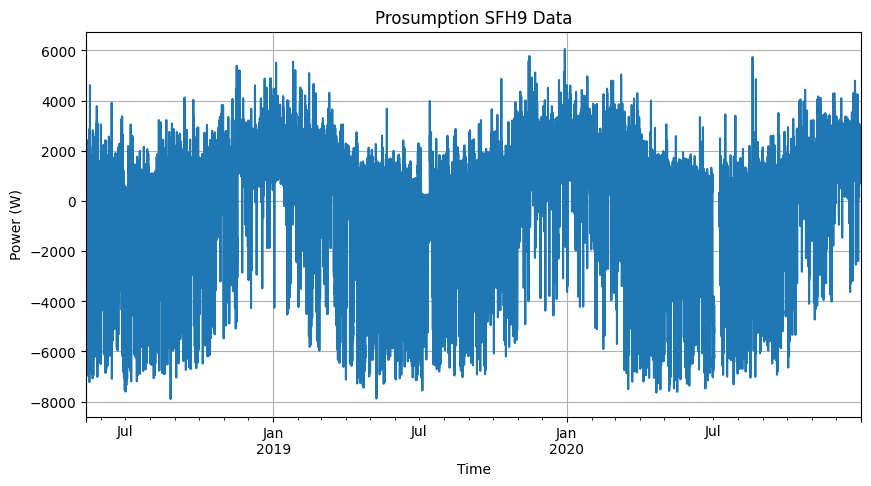

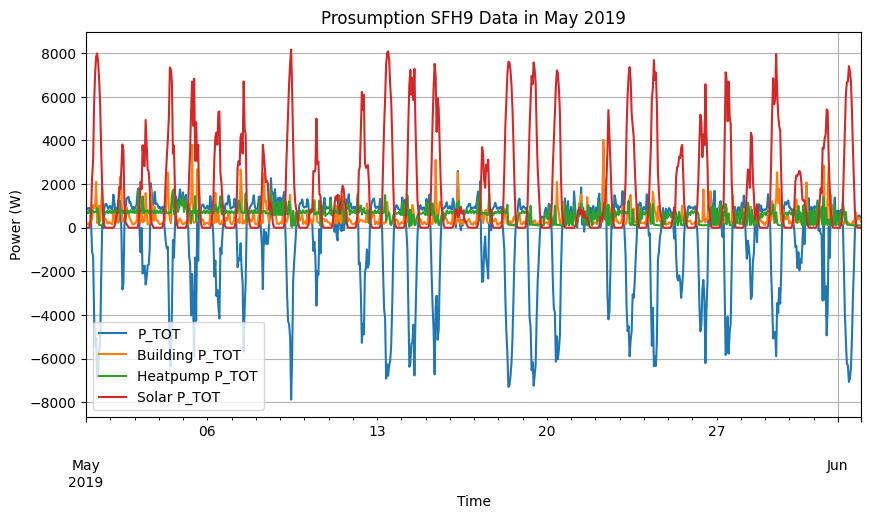

'Train period: 2018-05-13 07:00:00+00:00 to 2019-05-13 07:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 07:00:00+00:00 to 2020-05-13 07:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 07:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 232 days 16:00:00'

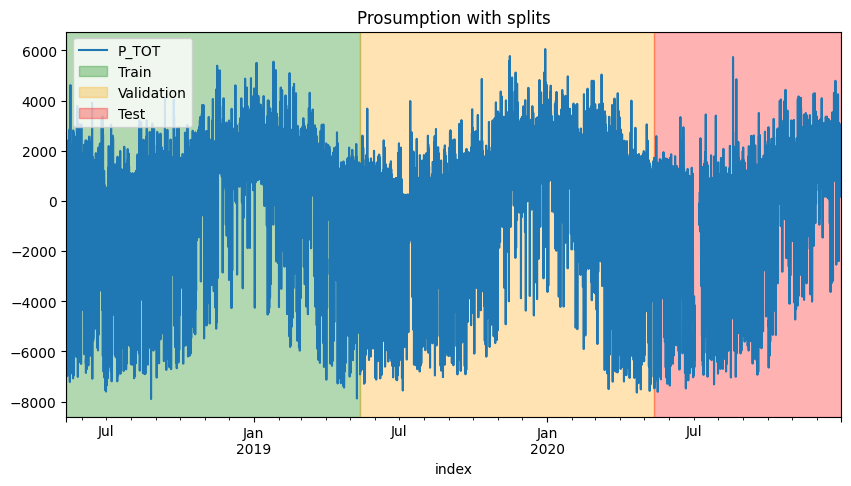

----------------------------------------------------
Calculating prosumption DataFrame for SFH10 with misc_key SOUTH...
Calculated PV factor for SFH10 with 25 resulting modules and 58 modules in the metadata is 0.43
Prosumption data for SFH10 saved to prosumption_data/60min/prosumption_SFH10_num_pv_modules_25_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH10 with PV factor 0.43103448275862066 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH10_num_pv_modules_25_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22099.000000,22242.000000,22242.000000,22986.000000
mean,211.722913,630.665406,465.173483,859.010221
std,1693.429232,330.999371,680.060225,1415.025418
min,-5267.730742,225.754139,9.347750,0.000000
25%,-326.356004,409.706083,13.489660,0.000000
50%,581.316361,516.168472,256.599694,30.080819
75%,1202.228450,758.596993,734.363680,1147.617038
max,11136.050818,3638.438754,11043.989648,5929.820402


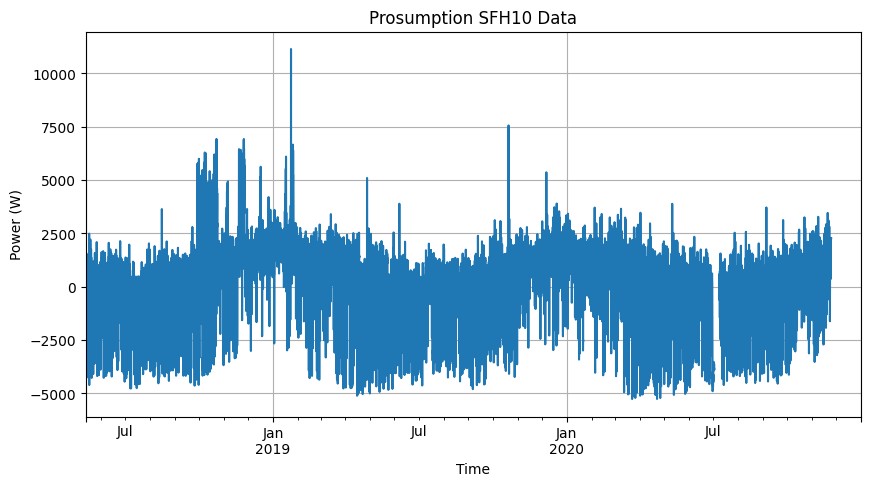

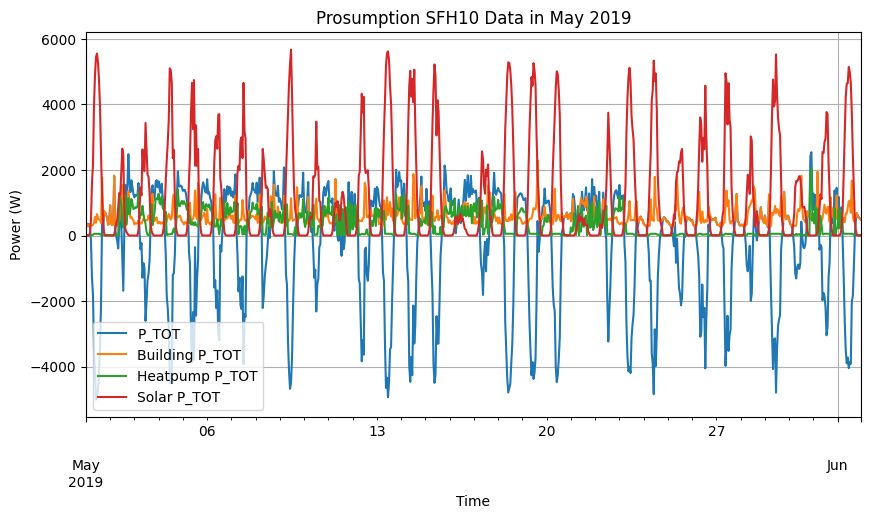

'Train period: 2018-05-13 07:00:00+00:00 to 2019-05-13 07:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 07:00:00+00:00 to 2020-05-13 07:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 07:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 232 days 16:00:00'

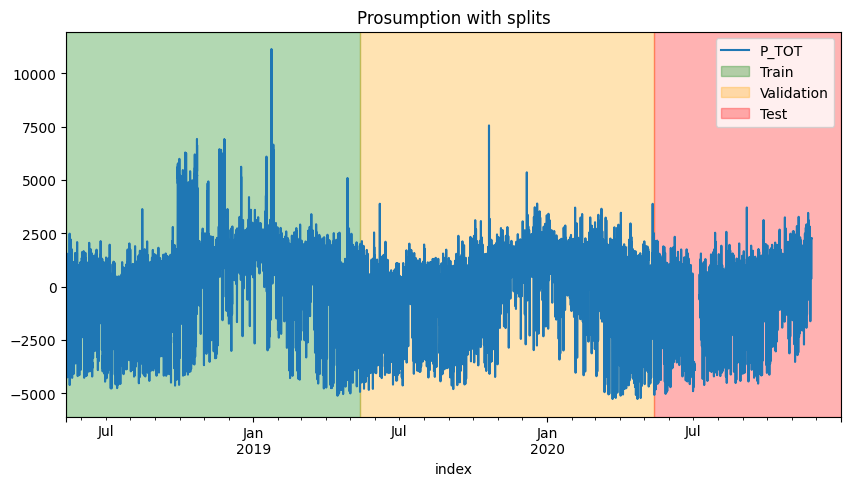

----------------------------------------------------
Calculating prosumption DataFrame for SFH12 with misc_key SOUTH...
Calculated PV factor for SFH12 with 21 resulting modules and 58 modules in the metadata is 0.36
Prosumption data for SFH12 saved to prosumption_data/60min/prosumption_SFH12_num_pv_modules_21_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH12 with PV factor 0.3620689655172414 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH12_num_pv_modules_21_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22819.000000,22962.000000,22962.000000,22819.000000
mean,-99.815946,345.699786,272.863232,719.674693
std,1334.960363,415.006672,454.340985,1187.663370
min,-4695.476693,63.251643,10.146444,0.000000
25%,-364.190973,139.302639,11.109104,0.000000
50%,160.200361,181.006097,14.725708,24.390374
75%,571.076263,343.800709,425.654466,957.893175
max,6587.156631,4450.186050,5993.453940,4981.049138


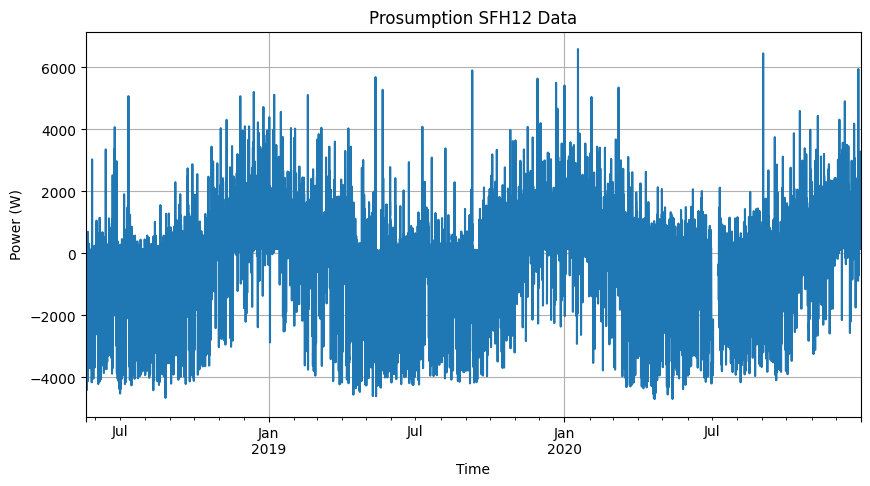

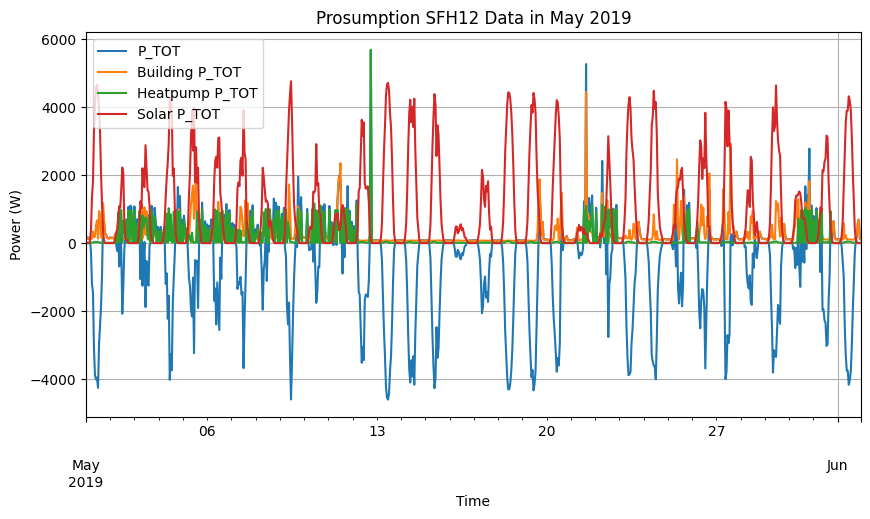

'Train period: 2018-05-20 06:00:00+00:00 to 2019-05-20 06:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-20 06:00:00+00:00 to 2020-05-20 06:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-20 06:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 225 days 17:00:00'

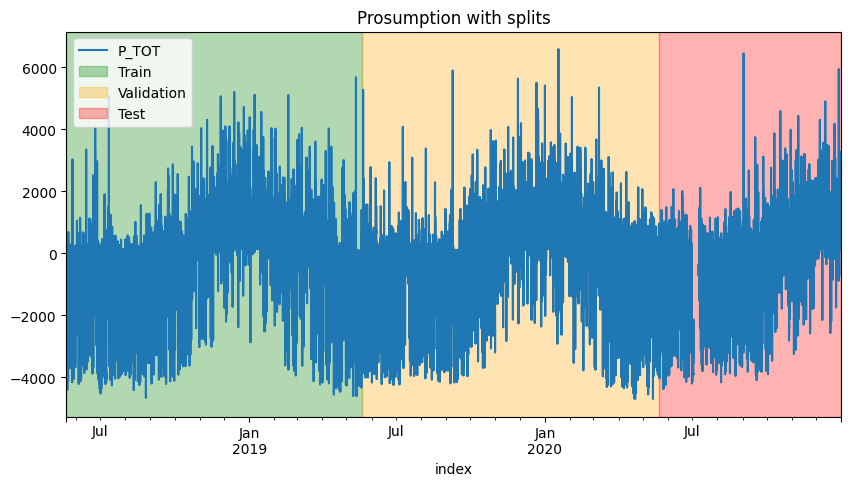

----------------------------------------------------
Calculating prosumption DataFrame for SFH14 with misc_key SOUTH...
Calculated PV factor for SFH14 with 28 resulting modules and 58 modules in the metadata is 0.48
Prosumption data for SFH14 saved to prosumption_data/60min/prosumption_SFH14_num_pv_modules_28_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH14 with PV factor 0.4827586206896552 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH14_num_pv_modules_28_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22814.000000,22957.000000,22957.000000,22814.000000
mean,99.440145,276.075609,777.054455,958.832955
std,2243.171653,269.147456,1126.373473,1582.819569
min,-6243.335573,51.125972,10.546056,0.000000
25%,-735.983374,80.320750,27.624139,0.000000
50%,230.874445,185.060917,122.400472,32.411877
75%,1251.922098,358.134417,951.650416,1275.507280
max,11253.922732,3078.722590,10633.834830,6641.398851


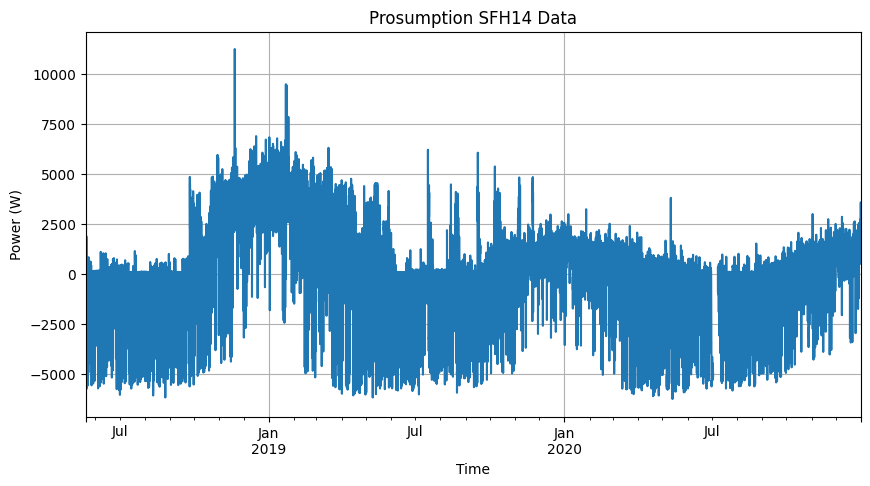

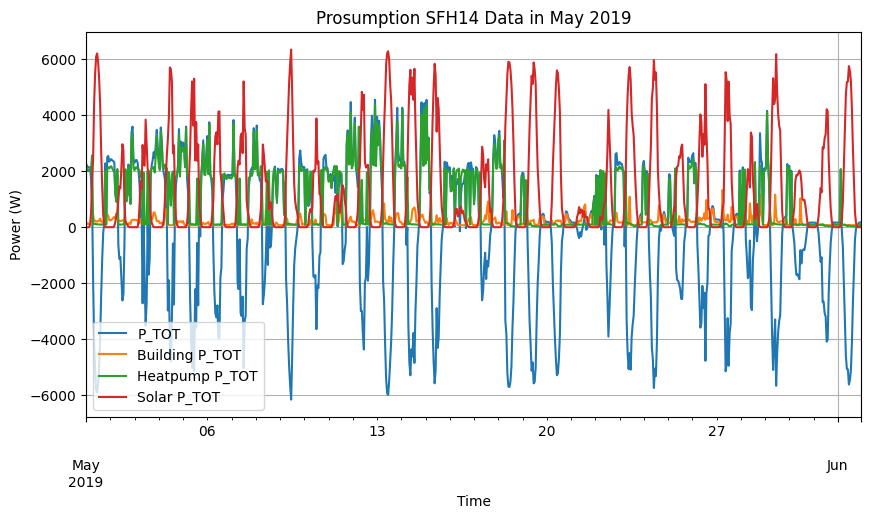

'Train period: 2018-05-20 11:00:00+00:00 to 2019-05-20 11:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-20 11:00:00+00:00 to 2020-05-20 11:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-20 11:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 225 days 12:00:00'

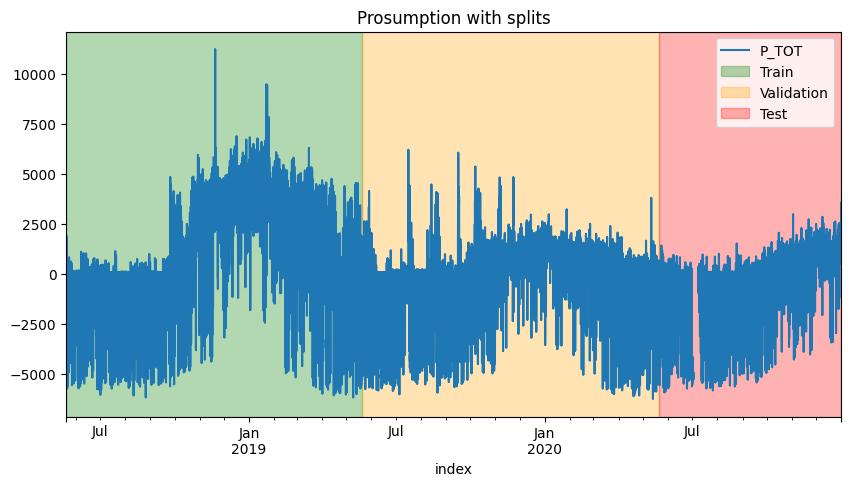

----------------------------------------------------
Calculating prosumption DataFrame for SFH16 with misc_key EAST...
Calculated PV factor for SFH16 with 25 resulting modules and 78 modules in the metadata is 0.32
Prosumption data for SFH16 saved to prosumption_data/60min/prosumption_SFH16_num_pv_modules_25_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH16 with PV factor 0.32051282051282054 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH16_num_pv_modules_25_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22936.000000,22936.000000,22936.000000,22936.000000
mean,-109.633504,257.365544,308.030470,675.029519
std,1348.408850,301.826774,521.514563,1104.075510
min,-4793.696553,46.128694,1.257528,0.000000
25%,-493.362483,104.098347,18.084160,0.000000
50%,171.795193,136.680611,142.369542,25.989138
75%,601.869923,267.355035,398.657896,913.625801
max,7275.384892,2854.961752,6881.874242,5058.470442


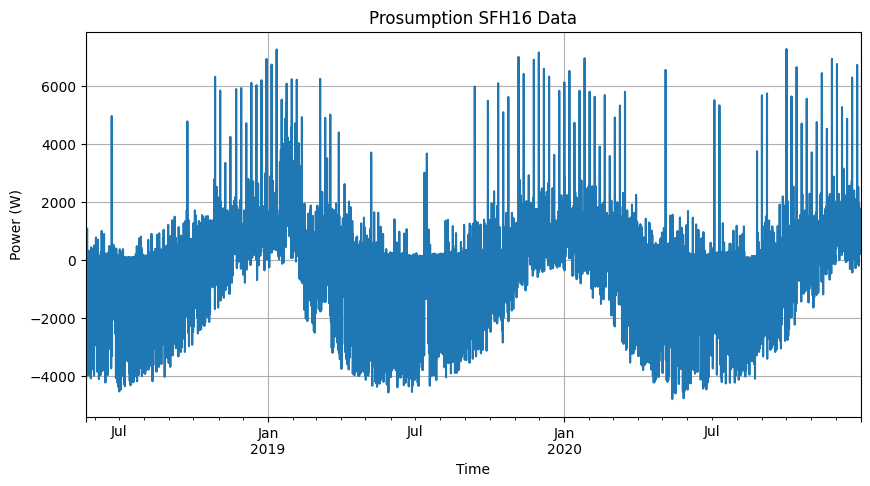

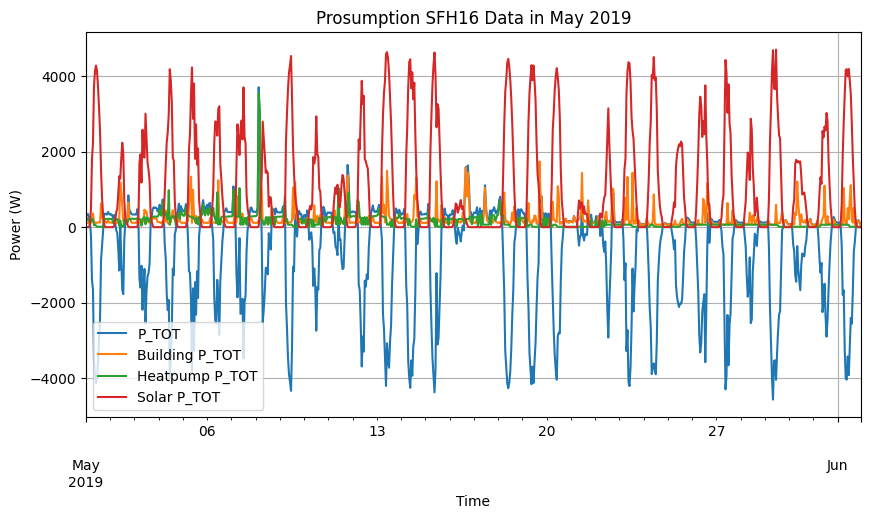

'Train period: 2018-05-21 08:00:00+00:00 to 2019-05-21 08:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-21 08:00:00+00:00 to 2020-05-21 08:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-21 08:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 224 days 15:00:00'

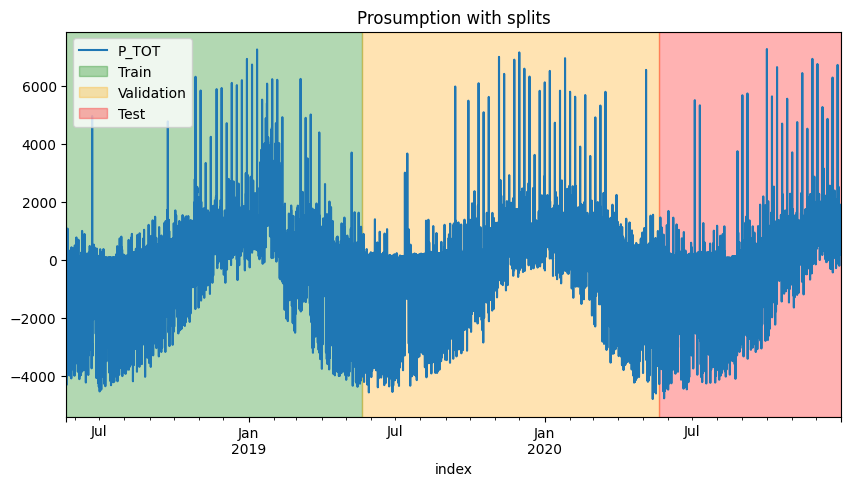

----------------------------------------------------
Calculating prosumption DataFrame for SFH18 with misc_key EAST...
Calculated PV factor for SFH18 with 16 resulting modules and 78 modules in the metadata is 0.21
Prosumption data for SFH18 saved to prosumption_data/60min/prosumption_SFH18_num_pv_modules_16_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH18 with PV factor 0.20512820512820512 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH18_num_pv_modules_16_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22913.000000,22913.000000,22913.000000,22913.000000
mean,113.214258,336.794847,207.886500,431.467089
std,901.912539,369.259608,342.527248,705.904805
min,-2994.829292,72.439250,0.000000,0.000000
25%,-111.145622,125.881611,10.253139,0.000000
50%,222.904556,204.988528,39.614611,16.583476
75%,564.379085,373.255917,354.861388,583.885470
max,6493.028861,4930.062205,6030.919562,3237.421083


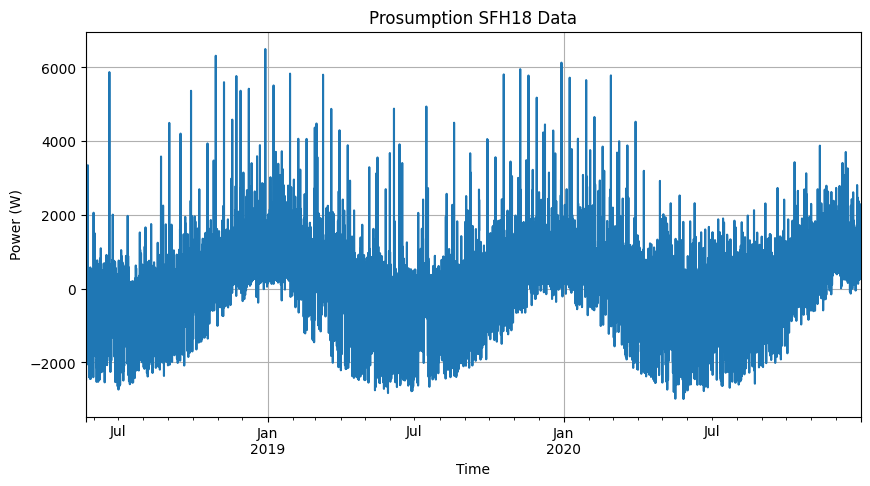

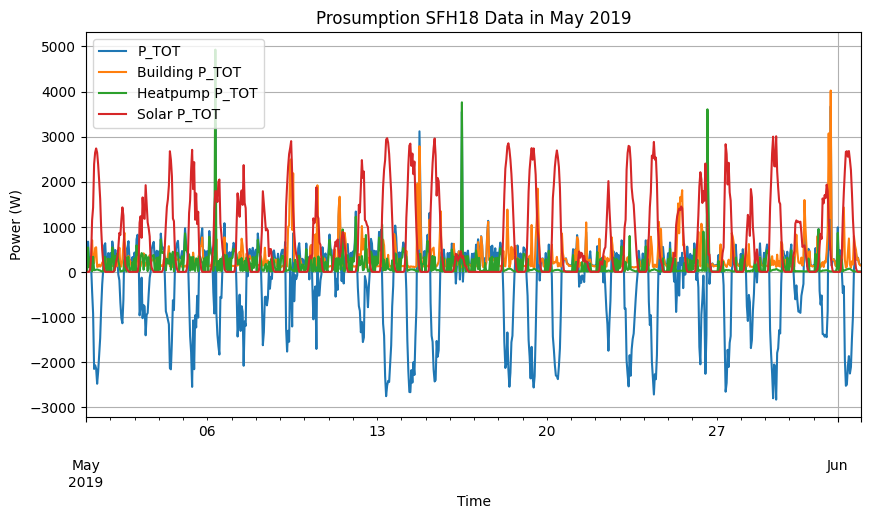

'Train period: 2018-05-22 07:00:00+00:00 to 2019-05-22 07:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-22 07:00:00+00:00 to 2020-05-22 07:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-22 07:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 223 days 16:00:00'

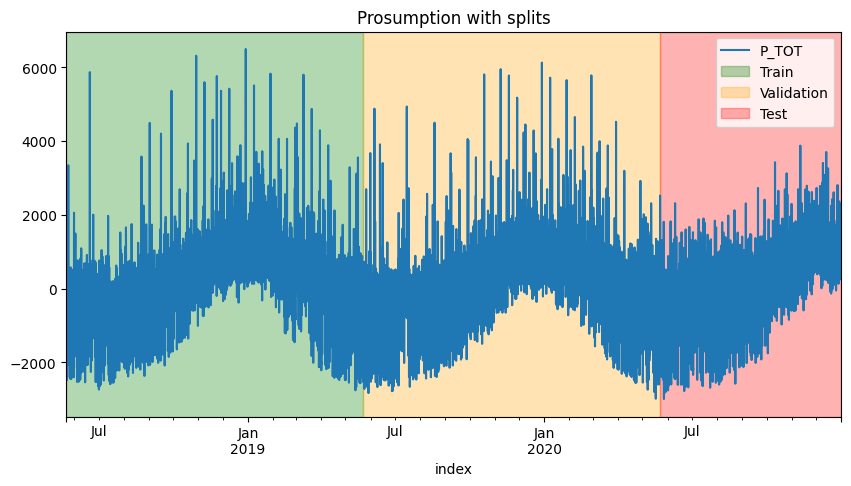

----------------------------------------------------
Calculating prosumption DataFrame for SFH19 with misc_key EAST...
Calculated PV factor for SFH19 with 38 resulting modules and 78 modules in the metadata is 0.49
Prosumption data for SFH19 saved to prosumption_data/60min/prosumption_SFH19_num_pv_modules_38_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH19 with PV factor 0.48717948717948717 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH19_num_pv_modules_38_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22908.000000,22908.000000,22908.000000,22908.000000
mean,-429.892749,366.746959,227.043080,1023.682788
std,1802.855213,282.460881,322.472539,1675.177678
min,-7251.180516,68.616111,9.218000,0.000000
25%,-828.494734,228.522882,10.306646,0.000000
50%,280.441334,283.479306,10.911444,39.193590
75%,597.802381,381.657355,378.963549,1385.893697
max,4625.982552,3611.770315,4618.306338,7688.875071


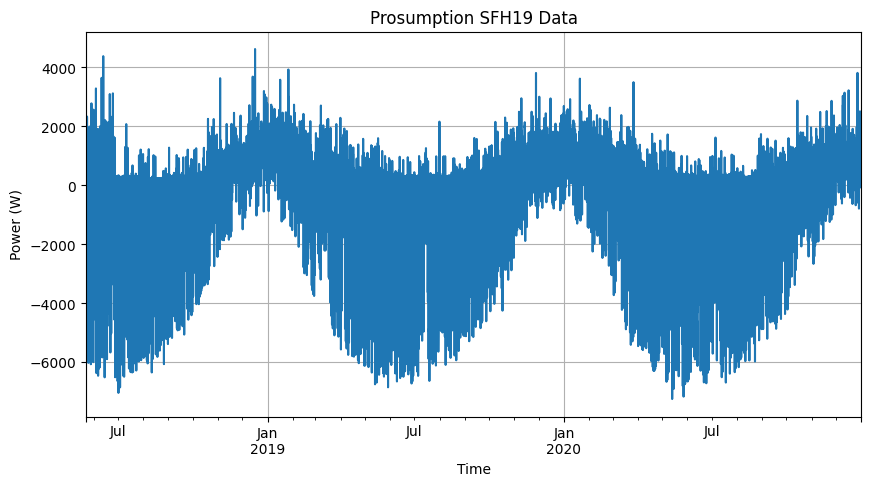

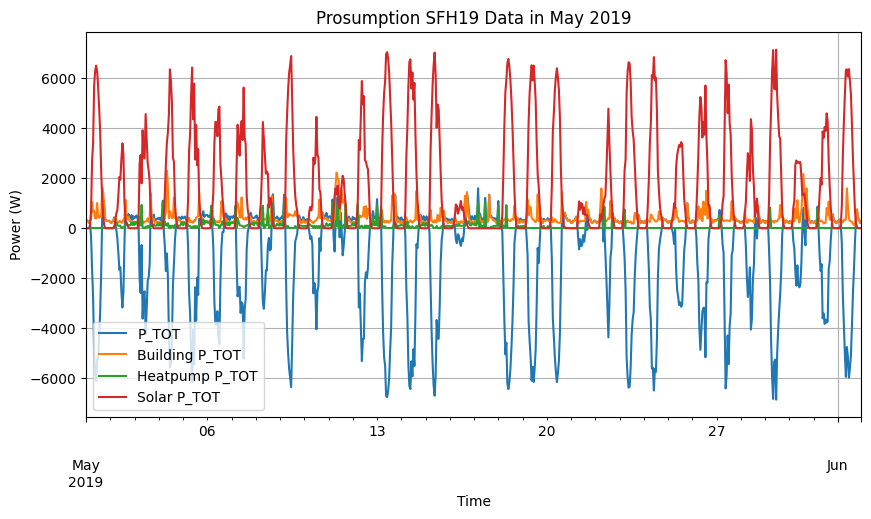

'Train period: 2018-05-22 12:00:00+00:00 to 2019-05-22 12:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-22 12:00:00+00:00 to 2020-05-22 12:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-22 12:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 223 days 11:00:00'

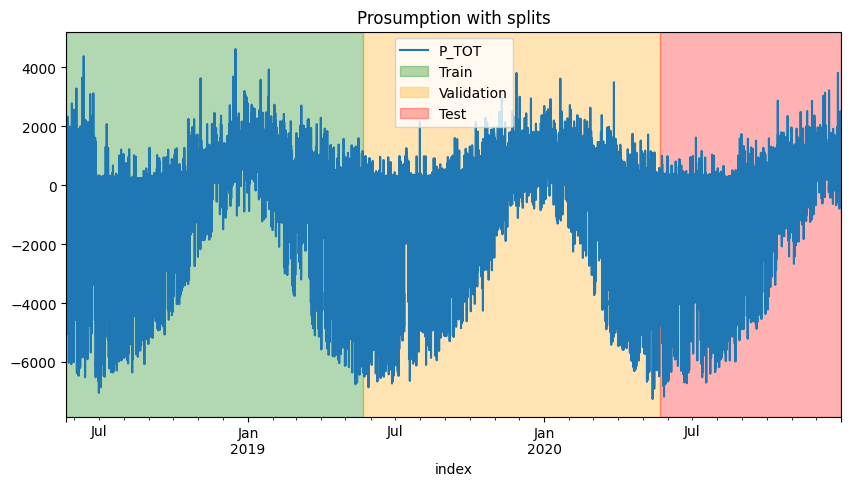

----------------------------------------------------
Calculating prosumption DataFrame for SFH22 with misc_key EAST...
Calculated PV factor for SFH22 with 21 resulting modules and 78 modules in the metadata is 0.27
Prosumption data for SFH22 saved to prosumption_data/60min/prosumption_SFH22_num_pv_modules_21_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH22 with PV factor 0.2692307692307692 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH22_num_pv_modules_21_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22746.000000,22746.000000,22746.000000,22746.000000
mean,658.806669,380.056910,841.487598,562.737840
std,1677.850011,301.667761,1100.692663,923.325449
min,-3932.091810,100.141000,0.493056,0.000000
25%,-128.894236,192.501306,12.217049,0.000000
50%,552.701347,267.492666,317.357666,20.719551
75%,1617.546567,458.504542,1302.251561,759.755208
max,7365.599163,3464.608920,5804.500000,4249.115171


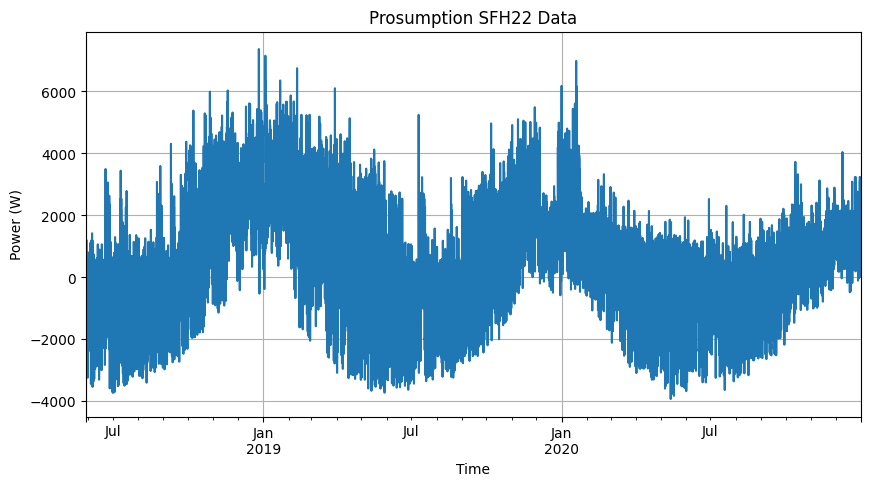

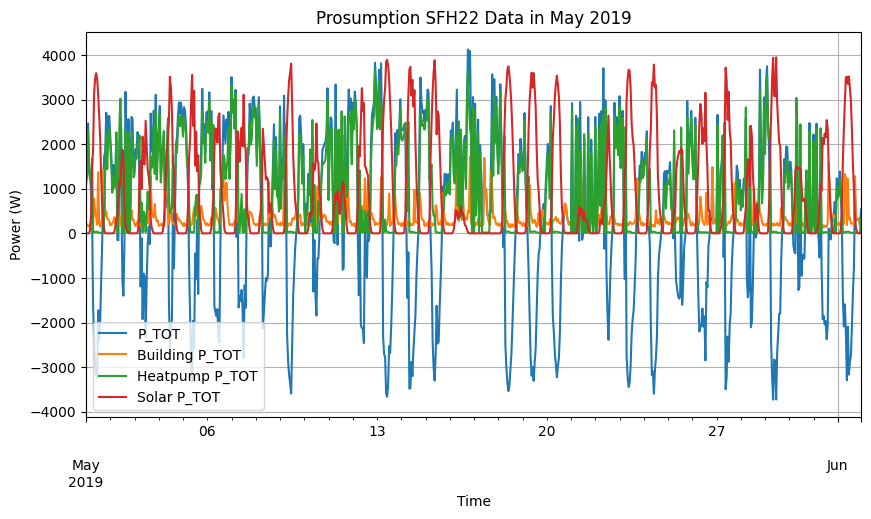

'Train period: 2018-05-29 06:00:00+00:00 to 2019-05-29 06:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-29 06:00:00+00:00 to 2020-05-29 06:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-29 06:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 216 days 17:00:00'

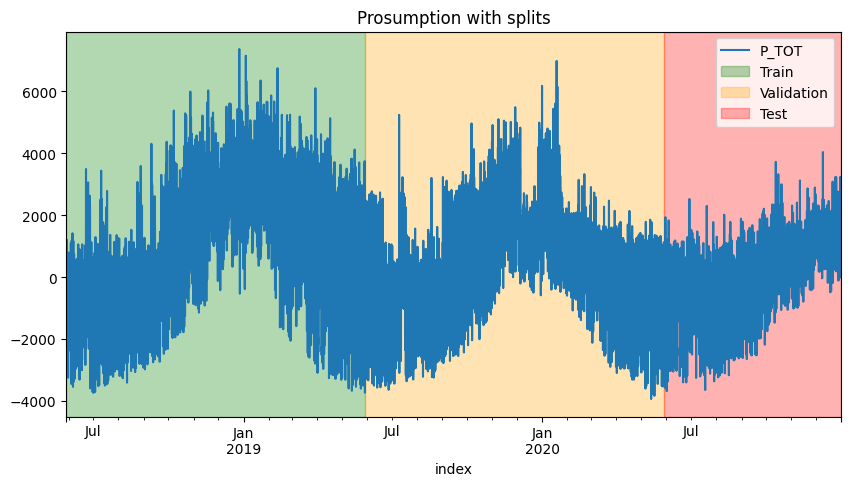

----------------------------------------------------
Calculating prosumption DataFrame for SFH27 with misc_key WEST...
Calculated PV factor for SFH27 with 20 resulting modules and 78 modules in the metadata is 0.26
Prosumption data for SFH27 saved to prosumption_data/60min/prosumption_SFH27_num_pv_modules_20_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH27 with PV factor 0.2564102564102564 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH27_num_pv_modules_20_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22768.000000,22768.000000,22768.000000,22768.000000
mean,-182.895587,126.971909,238.431289,548.298785
std,1021.166432,95.099087,344.302035,888.807768
min,-3814.310270,36.900832,0.543472,0.000000
25%,-456.560155,88.002938,11.474792,0.000000
50%,112.315210,99.611028,147.689556,25.583689
75%,399.451188,132.839875,344.233957,760.259259
max,4419.939952,1259.909472,4328.156479,3885.193020


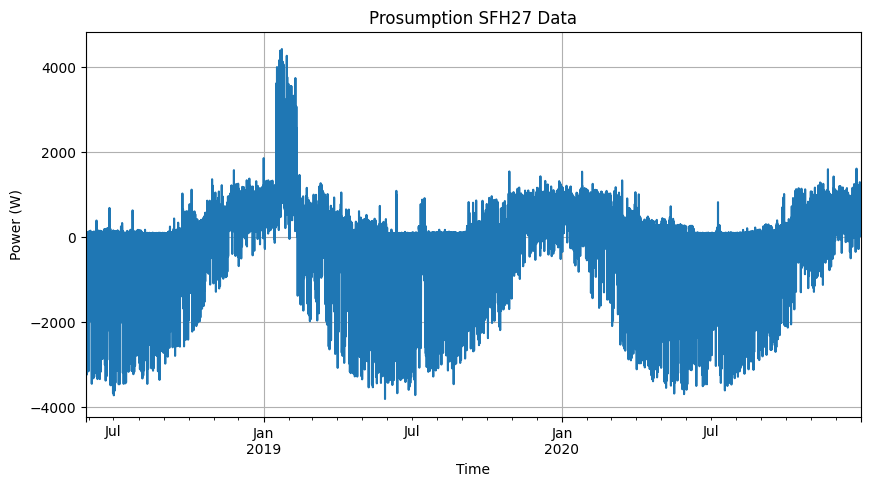

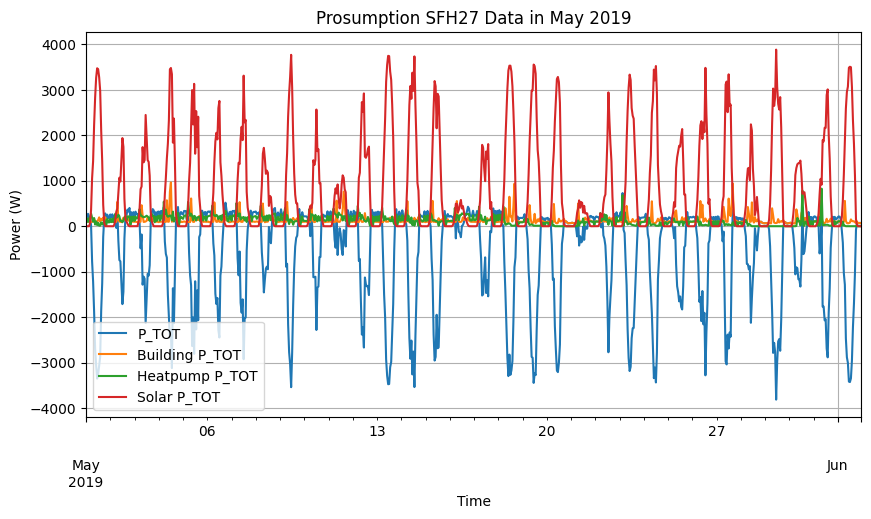

'Train period: 2018-05-28 08:00:00+00:00 to 2019-05-28 08:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-28 08:00:00+00:00 to 2020-05-28 08:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-28 08:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 217 days 15:00:00'

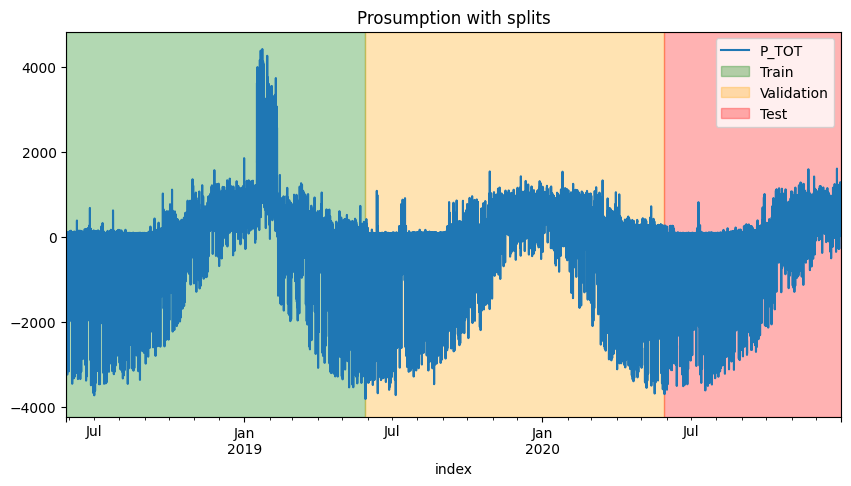

----------------------------------------------------
Calculating prosumption DataFrame for SFH28 with misc_key WEST...
Calculated PV factor for SFH28 with 27 resulting modules and 78 modules in the metadata is 0.35
Prosumption data for SFH28 saved to prosumption_data/60min/prosumption_SFH28_num_pv_modules_27_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH28 with PV factor 0.34615384615384615 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH28_num_pv_modules_27_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22764.000000,22764.000000,22764.000000,22764.000000
mean,246.246164,358.262472,627.616543,739.632851
std,1677.902673,316.352109,926.359478,1199.210581
min,-4981.231036,46.510028,9.489917,0.000000
25%,-262.316137,149.877820,10.836167,0.000000
50%,286.855402,206.474236,74.524612,34.447115
75%,1087.723192,495.587715,935.971320,1024.551442
max,6832.502347,3028.563031,5742.920029,5245.010577


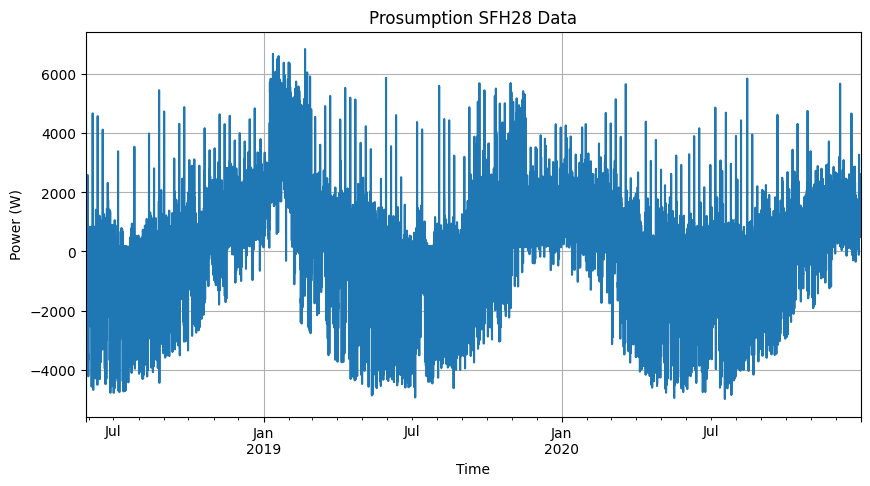

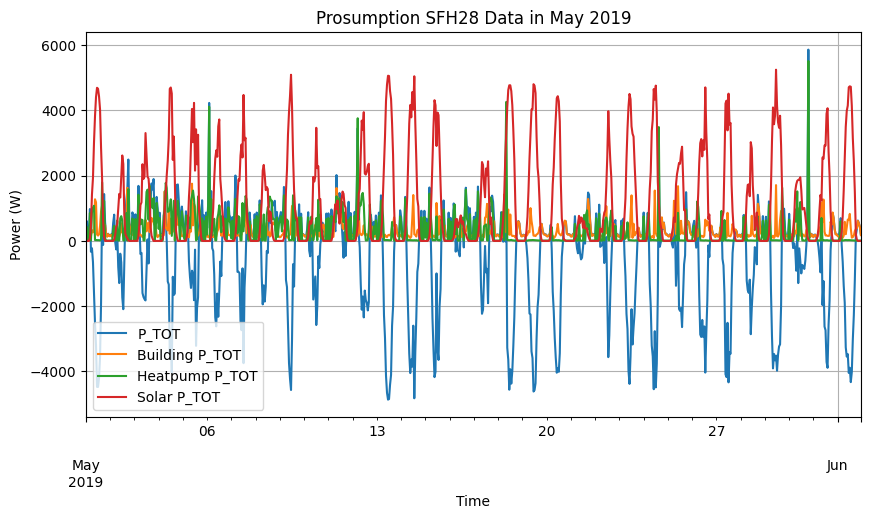

'Train period: 2018-05-28 12:00:00+00:00 to 2019-05-28 12:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-28 12:00:00+00:00 to 2020-05-28 12:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-28 12:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 217 days 11:00:00'

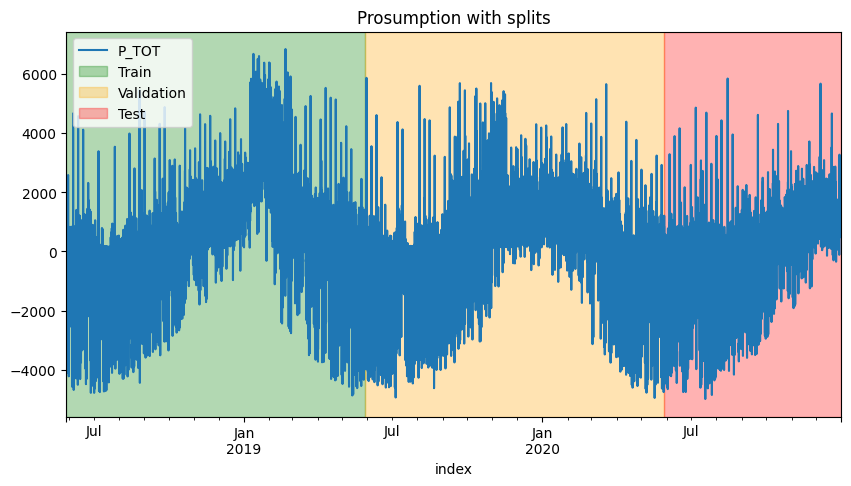

----------------------------------------------------
Calculating prosumption DataFrame for SFH29 with misc_key WEST...
Calculated PV factor for SFH29 with 19 resulting modules and 78 modules in the metadata is 0.24
Prosumption data for SFH29 saved to prosumption_data/60min/prosumption_SFH29_num_pv_modules_19_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH29 with PV factor 0.24358974358974358 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH29_num_pv_modules_19_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22746.000000,22746.000000,22746.000000,22746.000000
mean,-69.759492,162.037186,288.549097,520.345774
std,1100.031935,162.399896,498.165937,843.742545
min,-3539.083362,39.234061,0.640556,0.000000
25%,-453.058722,91.420271,11.522424,0.000000
50%,141.051458,111.518625,65.175278,24.173575
75%,504.513266,159.923514,392.915097,720.776300
max,5993.120003,2304.961867,5876.250000,3690.933369


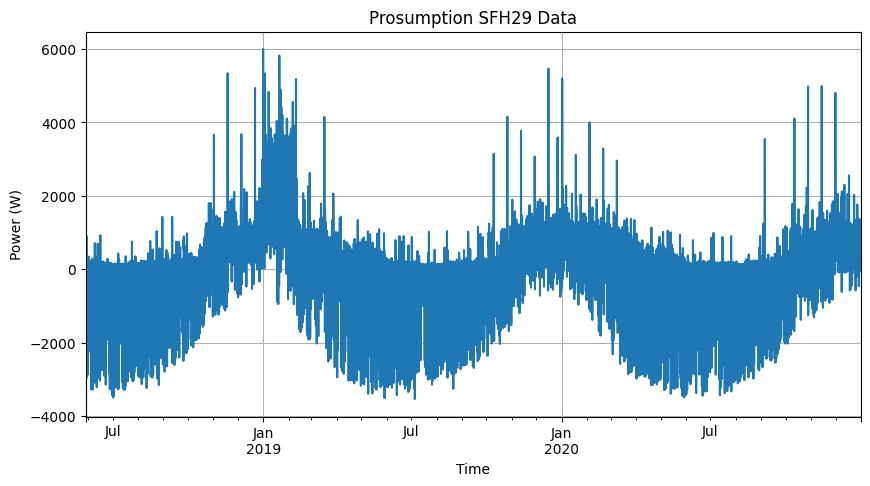

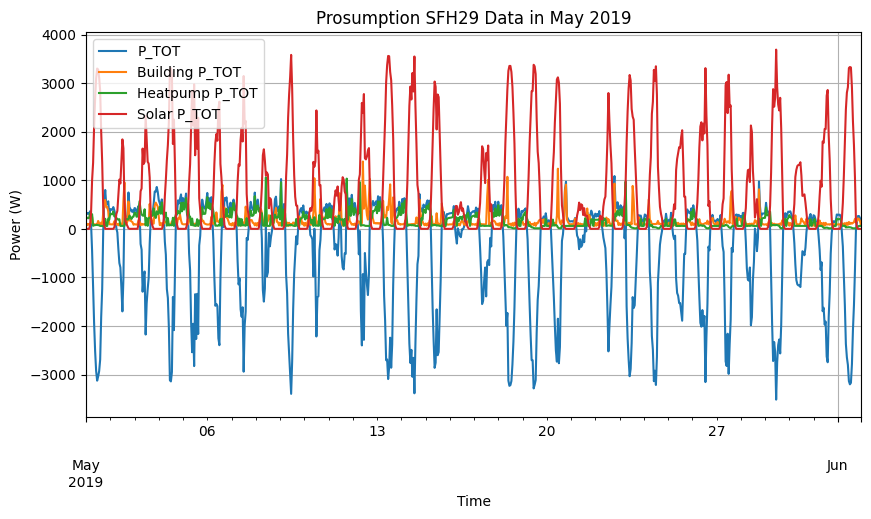

'Train period: 2018-05-29 06:00:00+00:00 to 2019-05-29 06:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-29 06:00:00+00:00 to 2020-05-29 06:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-29 06:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 216 days 17:00:00'

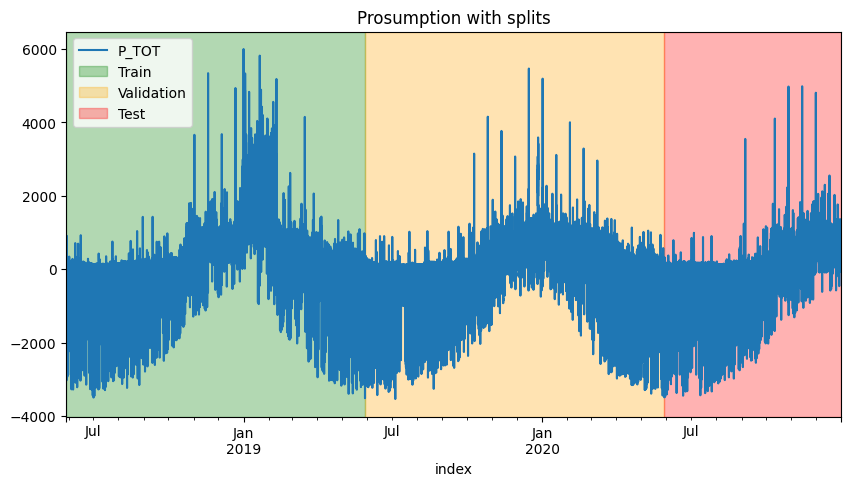

----------------------------------------------------
Calculating prosumption DataFrame for SFH30 with misc_key WEST...
Calculated PV factor for SFH30 with 18 resulting modules and 78 modules in the metadata is 0.23
Prosumption data for SFH30 saved to prosumption_data/60min/prosumption_SFH30_num_pv_modules_18_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH30 with PV factor 0.23076923076923078 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH30_num_pv_modules_18_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22742.000000,22742.000000,22742.000000,22742.000000
mean,-77.749790,251.850291,163.131749,492.731829
std,932.493341,246.411378,368.247437,799.185426
min,-3333.351224,36.234000,0.609667,0.000000
25%,-286.882819,97.960979,10.806299,0.000000
50%,101.855703,170.682806,11.444042,22.852244
75%,304.558882,288.548847,132.851139,682.289423
max,5494.507994,2806.490028,5266.825503,3496.673718


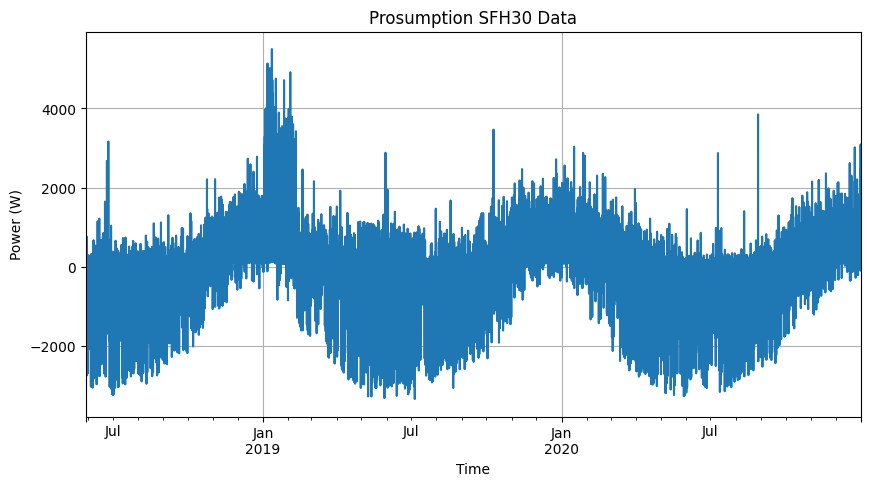

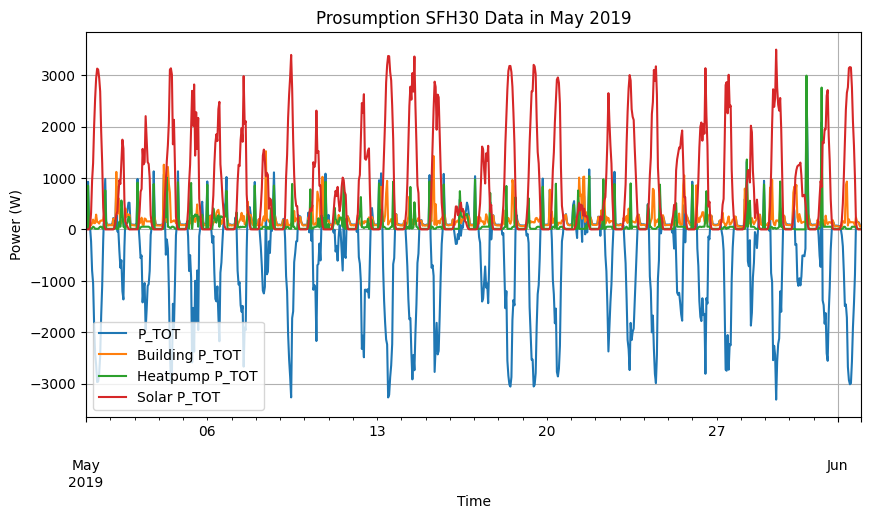

'Train period: 2018-05-29 10:00:00+00:00 to 2019-05-29 10:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-29 10:00:00+00:00 to 2020-05-29 10:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-29 10:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 216 days 13:00:00'

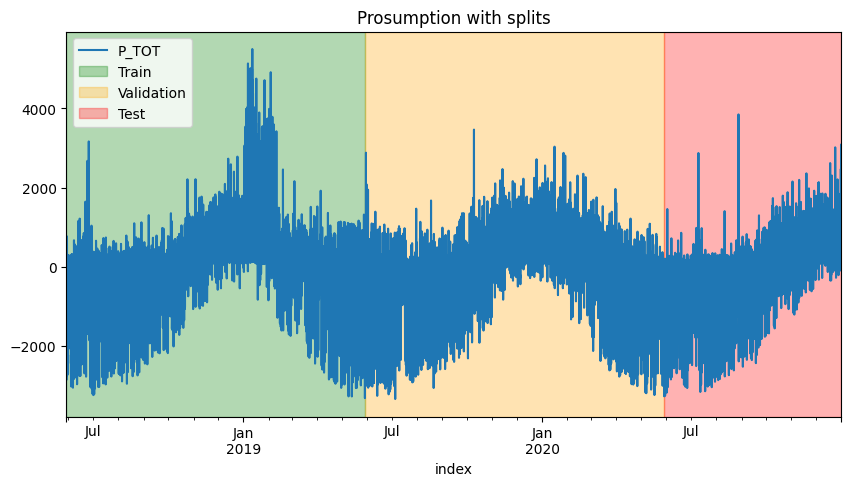

----------------------------------------------------
Calculating prosumption DataFrame for SFH32 with misc_key WEST...
Calculated PV factor for SFH32 with 30 resulting modules and 78 modules in the metadata is 0.38
Prosumption data for SFH32 saved to prosumption_data/60min/prosumption_SFH32_num_pv_modules_30_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH32 with PV factor 0.38461538461538464 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH32_num_pv_modules_30_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22623.000000,22623.000000,22623.000000,22623.000000
mean,-204.274601,306.069738,308.751554,819.095893
std,1483.135887,307.153228,463.798151,1330.540857
min,-5594.672141,45.629306,0.957361,0.000000
25%,-530.001855,134.849445,38.899750,0.000000
50%,239.530583,219.332000,171.412195,37.158120
75%,600.243432,360.760917,421.457750,1131.409188
max,6377.338757,3565.799446,6326.361891,5827.789530


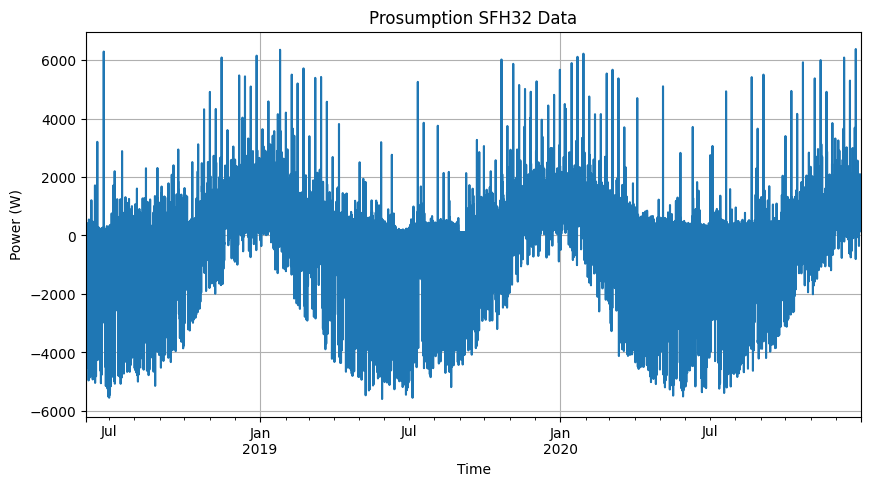

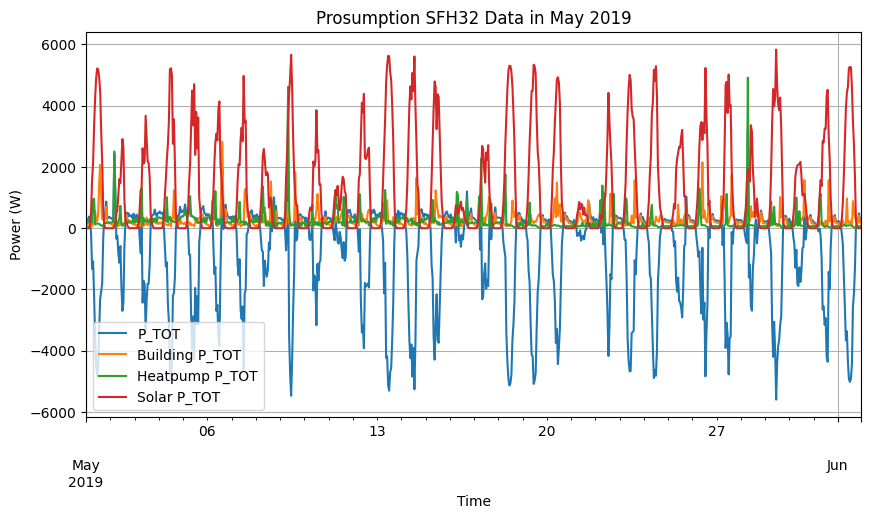

'Train period: 2018-06-03 09:00:00+00:00 to 2019-06-03 09:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-06-03 09:00:00+00:00 to 2020-06-03 09:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-06-03 09:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 211 days 14:00:00'

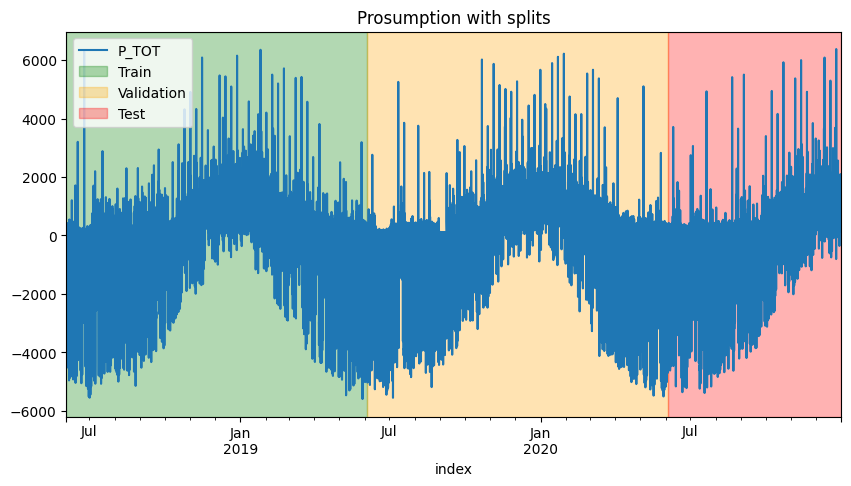

----------------------------------------------------
Calculating prosumption DataFrame for SFH36 with misc_key WEST...
Calculated PV factor for SFH36 with 20 resulting modules and 78 modules in the metadata is 0.26
Prosumption data for SFH36 saved to prosumption_data/60min/prosumption_SFH36_num_pv_modules_20_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH36 with PV factor 0.2564102564102564 and Heatpump factor 1.0 saved to prosumption_data/60min/prosumption_SFH36_num_pv_modules_20_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,22549.000000,22549.000000,22549.000000,22549.000000
mean,42.597744,313.920106,273.143621,544.465983
std,1118.868702,274.197246,588.815230,885.568092
min,-3751.679860,59.352389,0.897806,0.000000
25%,-259.013777,144.790556,11.321528,0.000000
50%,207.465000,234.068778,59.417083,24.323362
75%,471.638583,340.287418,257.529556,749.746439
max,9448.889996,4205.942800,5915.837193,3885.193020


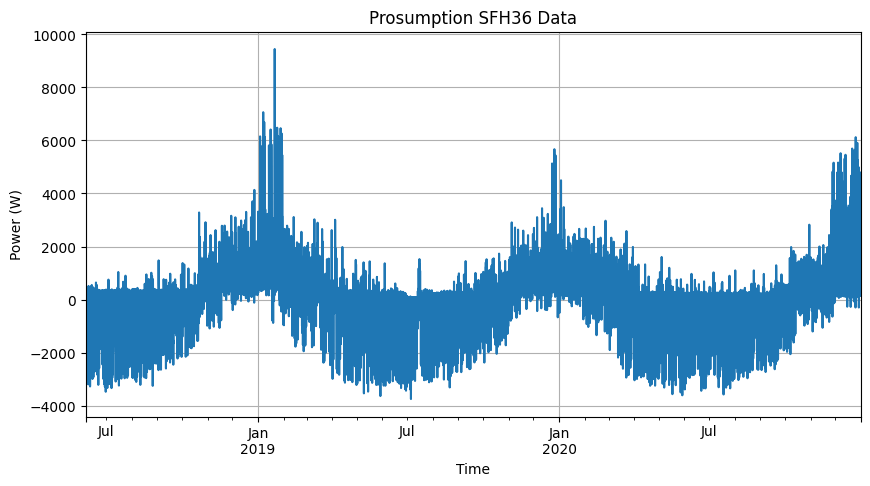

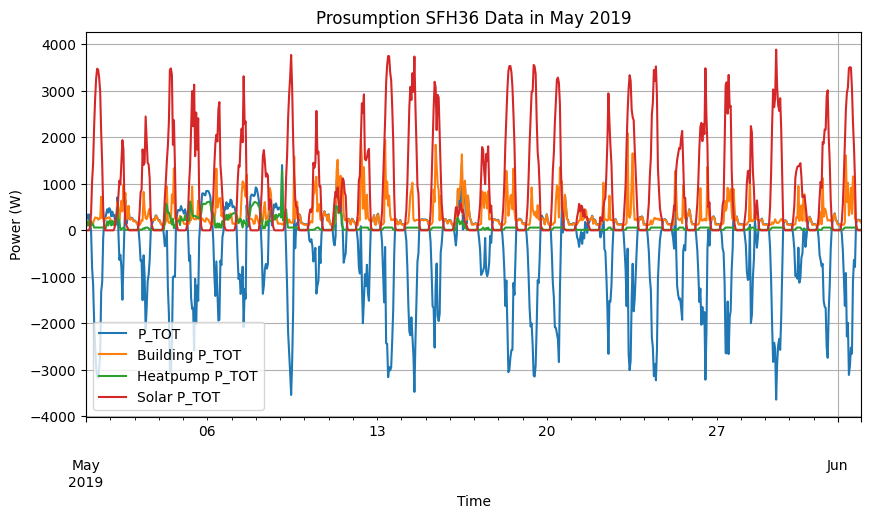

'Train period: 2018-06-06 11:00:00+00:00 to 2019-06-06 11:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-06-06 11:00:00+00:00 to 2020-06-06 11:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-06-06 11:00:00+00:00 to 2020-12-31 23:00:00+00:00 contains 208 days 12:00:00'

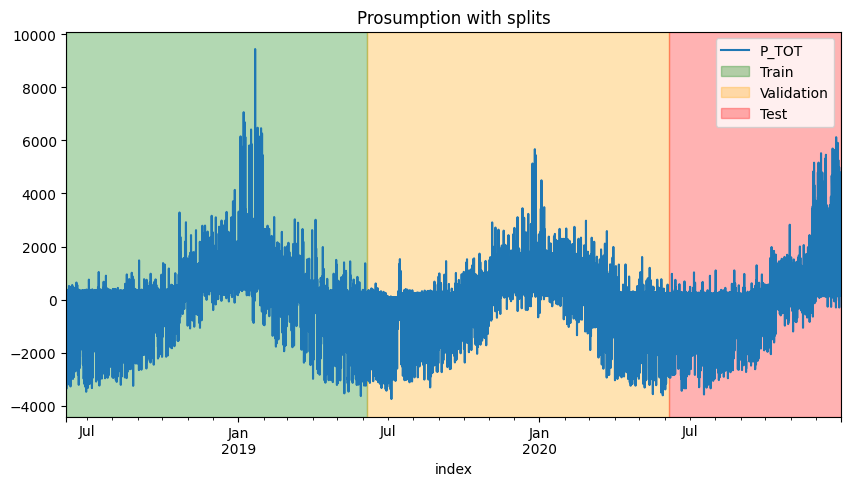

In [17]:
# 1h min data
for sfh in south_facing:
    calculate_and_save_prosumption(building_data=building_data_1h, heatpump_data=heatpump_data_1h, misc_data=misc_data_1h, meta_data=meta_houshold_data_1h, meta_solar_data=meta_solar_data, building_name=sfh , misc_key='SOUTH',  heatpump_factor=1.0, verbose=True)
for sfh in east_facing:
    calculate_and_save_prosumption(building_data=building_data_1h, heatpump_data=heatpump_data_1h, misc_data=misc_data_1h,  meta_data=meta_houshold_data_1h, meta_solar_data=meta_solar_data, building_name=sfh , misc_key='EAST',  heatpump_factor=1.0, verbose=True)
for sfh in west_facing:
    calculate_and_save_prosumption(building_data=building_data_1h, heatpump_data=heatpump_data_1h, misc_data=misc_data_1h,  meta_data=meta_houshold_data_1h, meta_solar_data=meta_solar_data, building_name=sfh , misc_key='WEST',  heatpump_factor=1.0, verbose=True)

----------------------------------------------------
Calculating prosumption DataFrame for SFH3 with misc_key SOUTH...
Calculated PV factor for SFH3 with 26 resulting modules and 58 modules in the metadata is 0.45
Prosumption data for SFH3 saved to prosumption_data/30min/prosumption_SFH3_num_pv_modules_26_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH3 with PV factor 0.4482758620689655 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH3_num_pv_modules_26_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45976.000000,46262.000000,46262.000000,45976.000000
mean,-391.740201,230.717274,269.494135,893.393267
std,1712.910056,289.146275,651.663435,1489.245084
min,-6357.757855,31.632222,10.193611,0.000000
25%,-742.110483,118.740514,11.120778,0.000000
50%,132.341687,161.162778,11.654028,24.068678
75%,280.447250,215.726556,207.990806,1141.437356
max,8011.709365,4298.483929,6351.305067,6523.524521


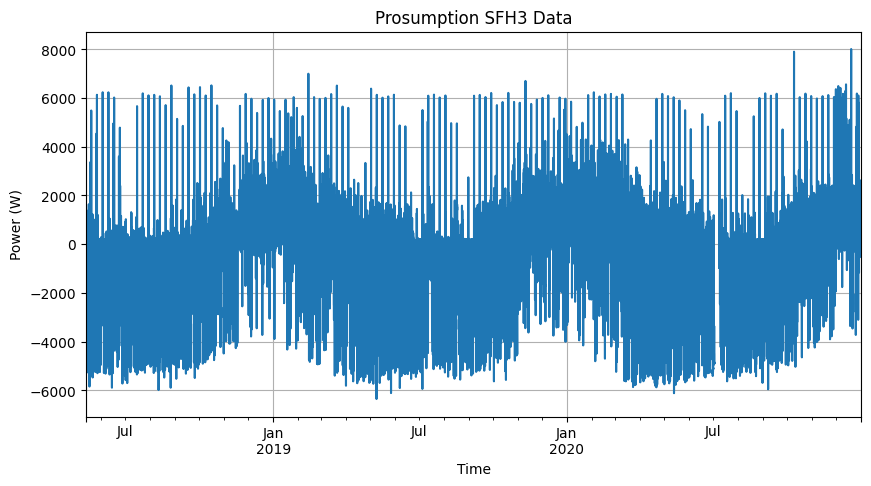

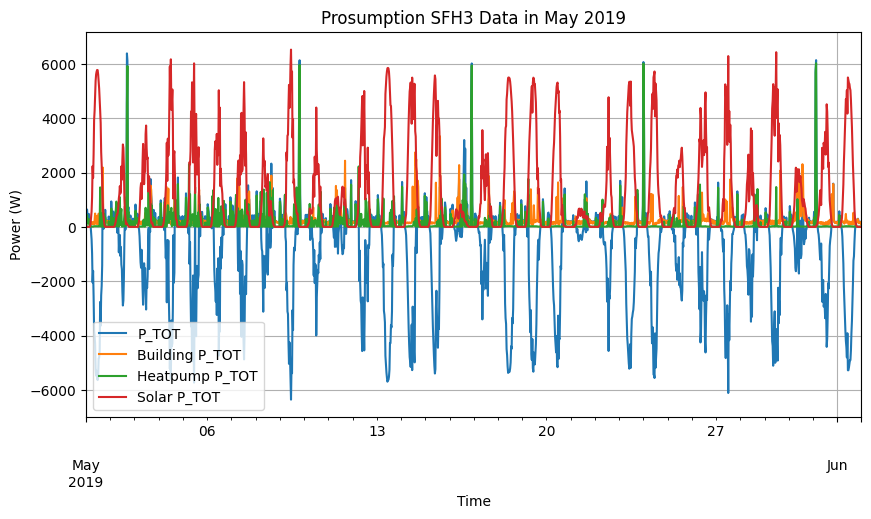

'Train period: 2018-05-13 05:00:00+00:00 to 2019-05-13 05:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 05:00:00+00:00 to 2020-05-13 05:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 05:00:00+00:00 to 2020-12-31 23:30:00+00:00 contains 232 days 18:30:00'

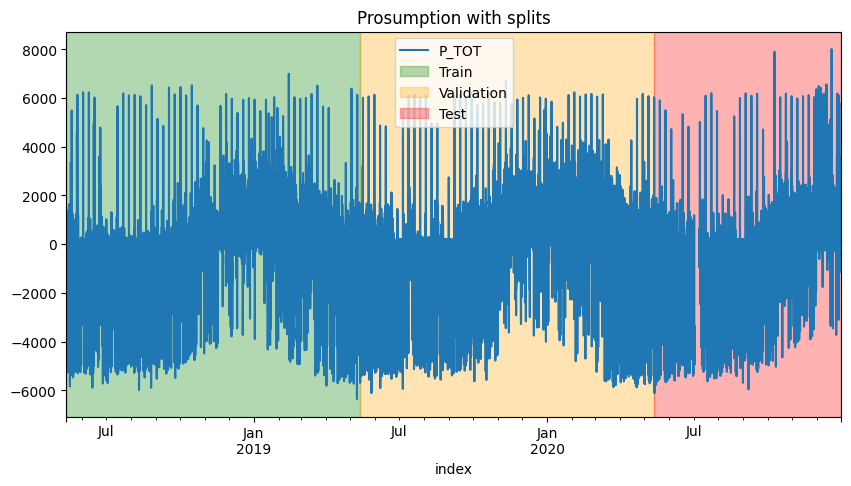

----------------------------------------------------
Calculating prosumption DataFrame for SFH4 with misc_key SOUTH...
Calculated PV factor for SFH4 with 30 resulting modules and 58 modules in the metadata is 0.52
Prosumption data for SFH4 saved to prosumption_data/30min/prosumption_SFH4_num_pv_modules_30_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH4 with PV factor 0.5172413793103449 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH4_num_pv_modules_30_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45967.000000,46253.000000,46253.000000,45967.000000
mean,-238.356126,355.059713,434.604633,1030.449851
std,2030.583514,272.029173,781.827772,1718.143376
min,-7189.965511,108.694666,9.995944,0.000000
25%,-780.339412,223.235167,11.124444,0.000000
50%,241.047389,289.635111,61.382889,27.735632
75%,911.285426,375.292557,677.721166,1315.640805
max,7258.876965,4651.397386,6279.792674,7527.143678


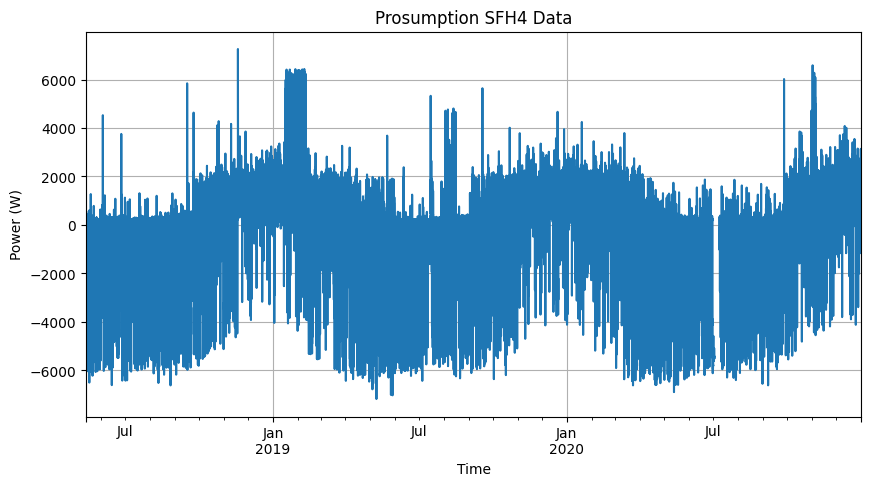

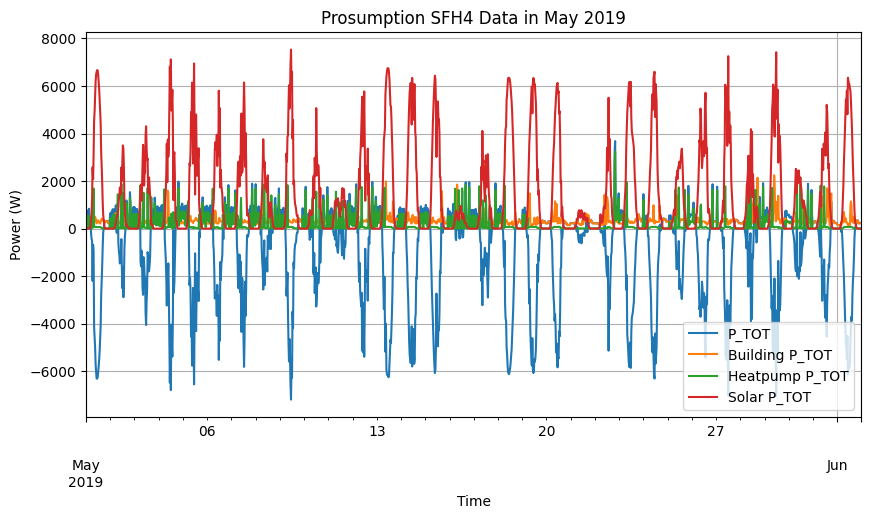

'Train period: 2018-05-13 09:30:00+00:00 to 2019-05-13 09:30:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 09:30:00+00:00 to 2020-05-13 09:30:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 09:30:00+00:00 to 2020-12-31 23:30:00+00:00 contains 232 days 14:00:00'

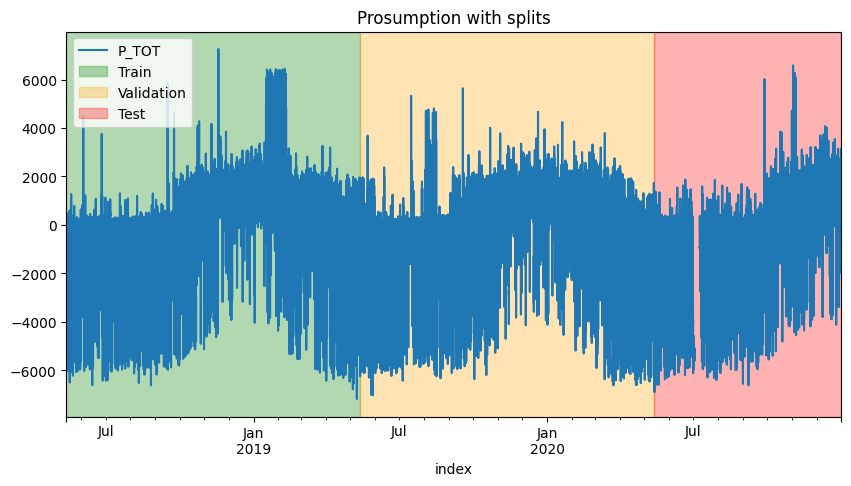

----------------------------------------------------
Calculating prosumption DataFrame for SFH9 with misc_key SOUTH...
Calculated PV factor for SFH9 with 36 resulting modules and 58 modules in the metadata is 0.62
Prosumption data for SFH9 saved to prosumption_data/30min/prosumption_SFH9_num_pv_modules_36_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH9 with PV factor 0.6206896551724138 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH9_num_pv_modules_36_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45970.000000,46256.000000,46256.000000,45970.000000
mean,73.414513,548.561646,759.667735,1236.839189
std,2366.089985,615.416564,726.881457,2062.040851
min,-8734.515691,70.607555,2.613111,0.000000
25%,-530.976406,224.495861,114.473694,0.000000
50%,749.578314,310.407389,687.041390,33.293103
75%,1329.656017,542.055249,849.377459,1579.663793
max,11199.122313,5983.928841,9380.666806,9032.572414


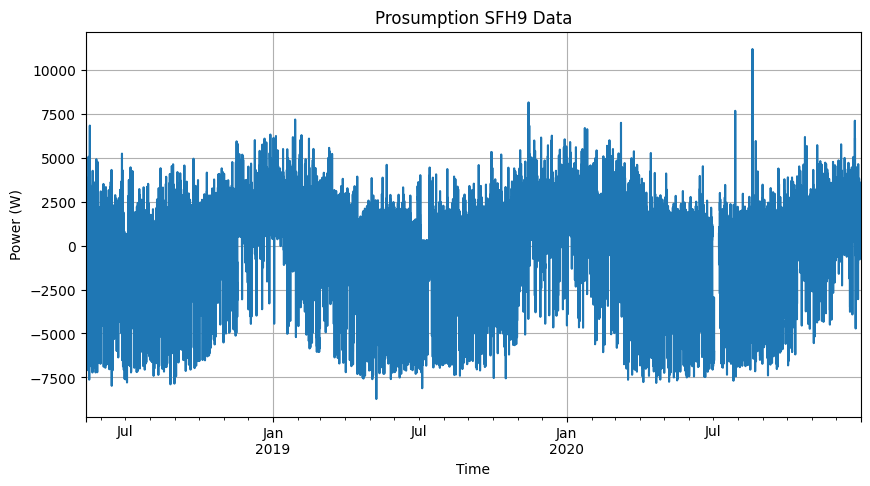

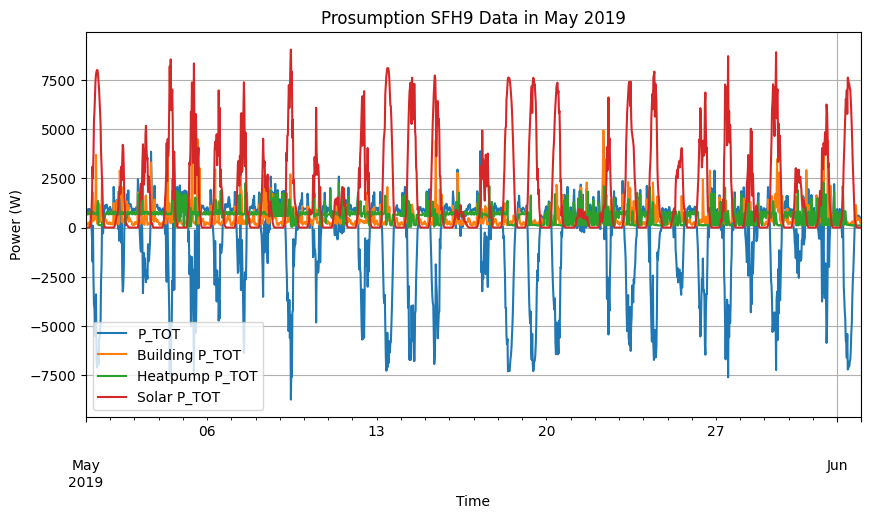

'Train period: 2018-05-13 08:00:00+00:00 to 2019-05-13 08:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 08:00:00+00:00 to 2020-05-13 08:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 08:00:00+00:00 to 2020-12-31 23:30:00+00:00 contains 232 days 15:30:00'

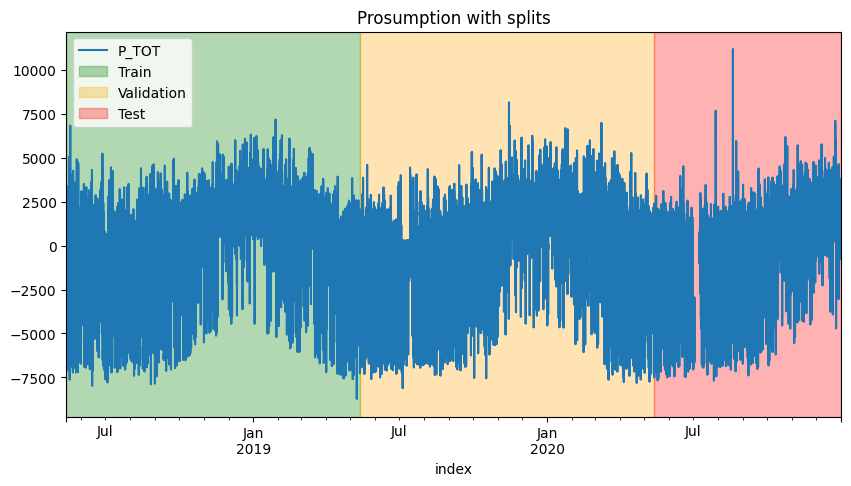

----------------------------------------------------
Calculating prosumption DataFrame for SFH10 with misc_key SOUTH...
Calculated PV factor for SFH10 with 25 resulting modules and 58 modules in the metadata is 0.43
Prosumption data for SFH10 saved to prosumption_data/30min/prosumption_SFH10_num_pv_modules_25_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH10 with PV factor 0.43103448275862066 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH10_num_pv_modules_25_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,44195.000000,44481.000000,44481.000000,45970.000000
mean,211.802253,630.679930,465.161526,858.916103
std,1745.246727,384.008743,742.558383,1431.972813
min,-5495.022743,206.028223,0.930778,0.000000
25%,-328.266684,402.589223,10.720556,0.000000
50%,541.939999,504.883334,54.629333,23.120211
75%,1175.546141,714.656718,693.203779,1096.988745
max,11231.024244,4985.023171,11044.704725,6272.619732


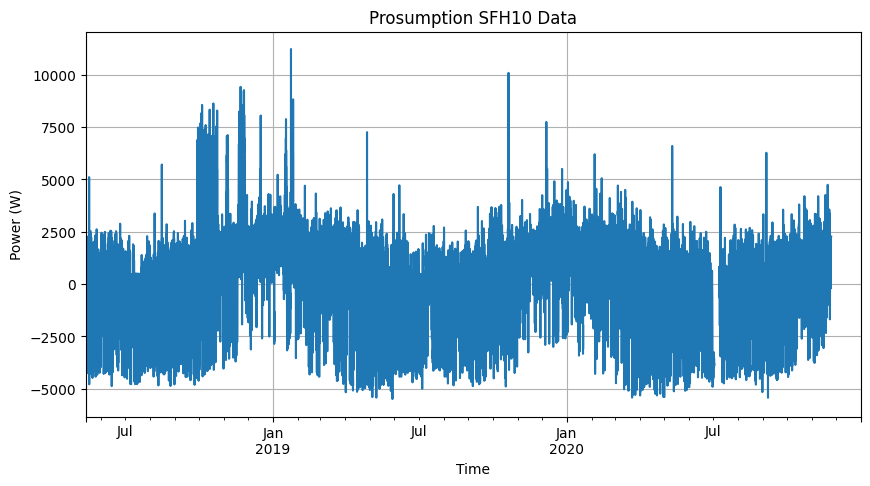

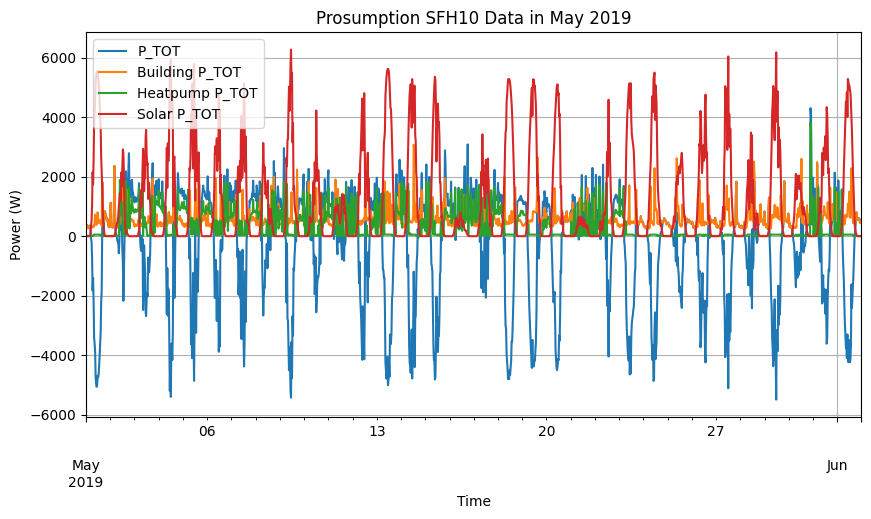

'Train period: 2018-05-13 08:00:00+00:00 to 2019-05-13 08:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-13 08:00:00+00:00 to 2020-05-13 08:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-13 08:00:00+00:00 to 2020-12-31 23:30:00+00:00 contains 232 days 15:30:00'

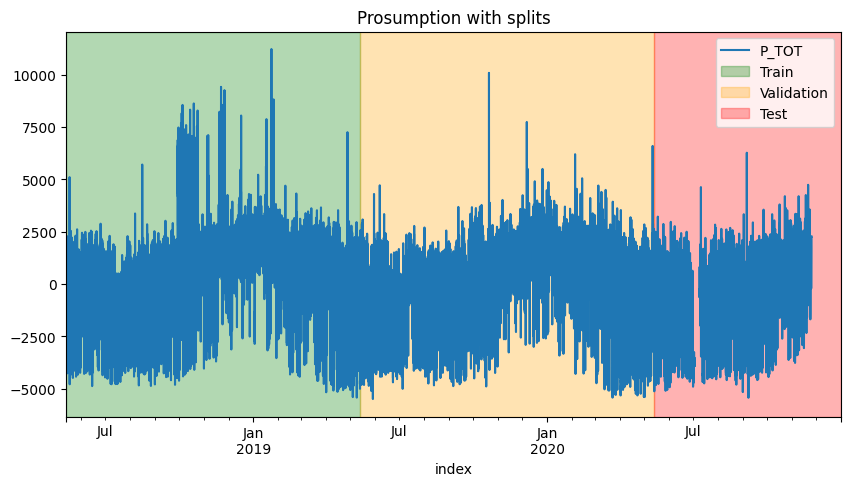

----------------------------------------------------
Calculating prosumption DataFrame for SFH12 with misc_key SOUTH...
Calculated PV factor for SFH12 with 21 resulting modules and 58 modules in the metadata is 0.36
Prosumption data for SFH12 saved to prosumption_data/30min/prosumption_SFH12_num_pv_modules_21_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH12 with PV factor 0.3620689655172414 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH12_num_pv_modules_21_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45637.000000,45923.000000,45923.000000,45637.000000
mean,-99.791213,345.705912,272.868942,719.661897
std,1417.377450,479.721234,585.569769,1201.932148
min,-5090.718798,37.719278,10.123778,0.000000
25%,-385.395679,134.601639,11.070278,0.000000
50%,152.481000,176.765333,11.773222,18.857759
75%,415.178360,296.257194,76.922499,914.344828
max,7810.995455,6122.138168,6006.175266,5269.000575


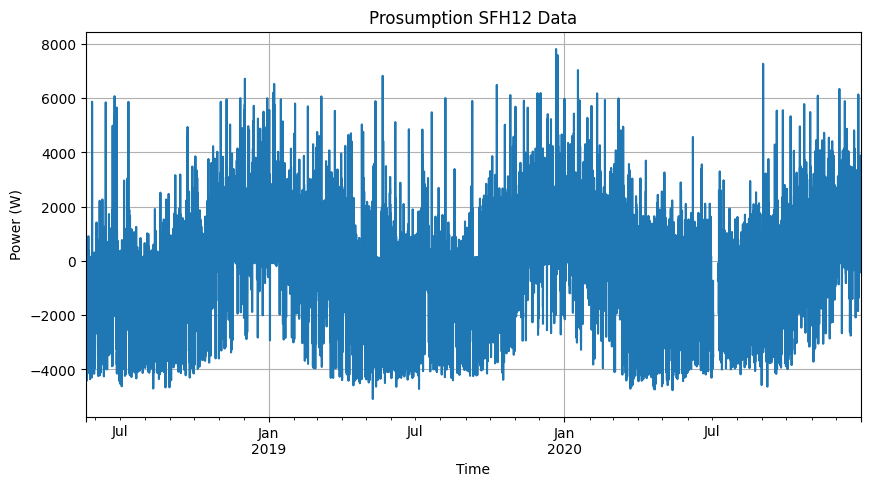

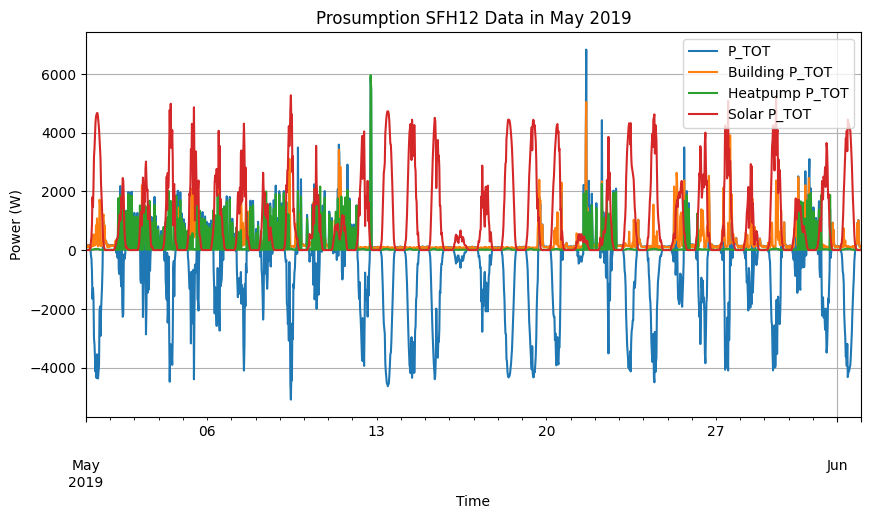

'Train period: 2018-05-20 06:30:00+00:00 to 2019-05-20 06:30:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-20 06:30:00+00:00 to 2020-05-20 06:30:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-20 06:30:00+00:00 to 2020-12-31 23:30:00+00:00 contains 225 days 17:00:00'

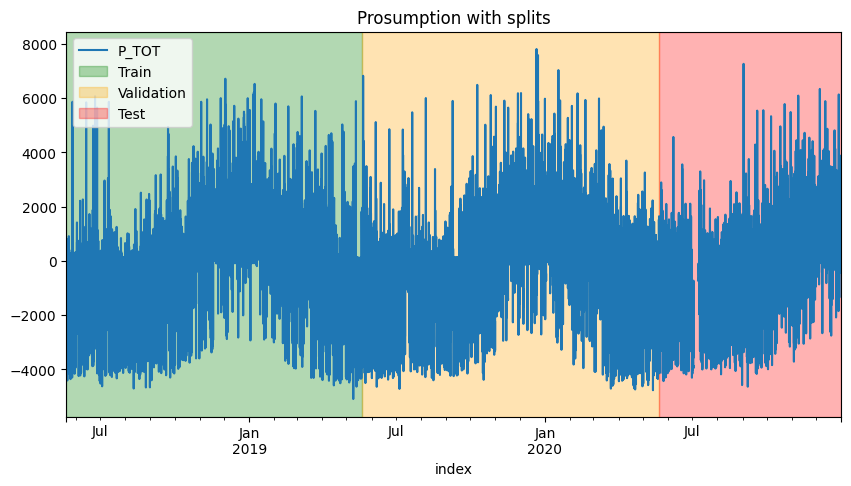

----------------------------------------------------
Calculating prosumption DataFrame for SFH14 with misc_key SOUTH...
Calculated PV factor for SFH14 with 28 resulting modules and 58 modules in the metadata is 0.48
Prosumption data for SFH14 saved to prosumption_data/30min/prosumption_SFH14_num_pv_modules_28_pv_SOUTH_hp_1.0.csv
Prosumption DataFrame for SFH14 with PV factor 0.4827586206896552 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH14_num_pv_modules_28_pv_SOUTH_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45626.000000,45912.000000,45912.000000,45626.000000
mean,99.690028,276.074542,777.086359,958.614328
std,2373.650280,292.729128,1336.778366,1601.534280
min,-6855.368211,45.907945,10.513444,0.000000
25%,-766.517040,82.636736,27.188750,0.000000
50%,173.263889,173.875833,92.144250,25.006897
75%,1097.879138,354.433806,878.314928,1217.375096
max,12008.556948,3185.553721,11352.511515,7025.334100


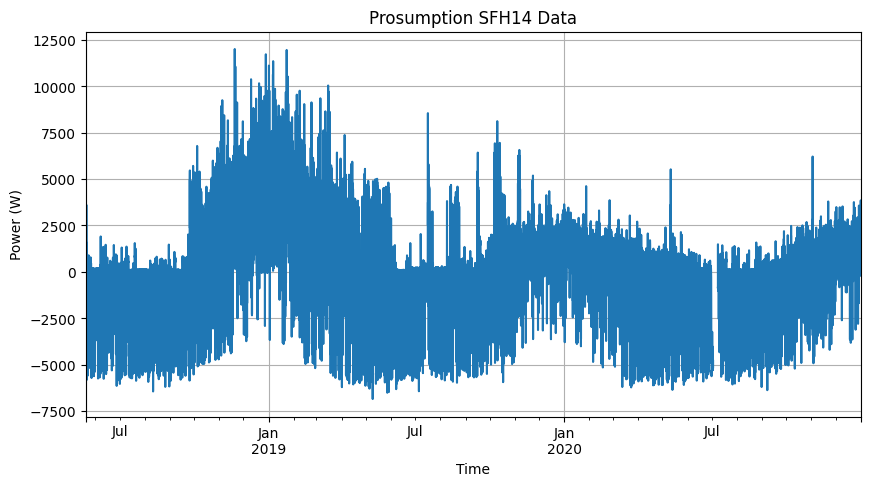

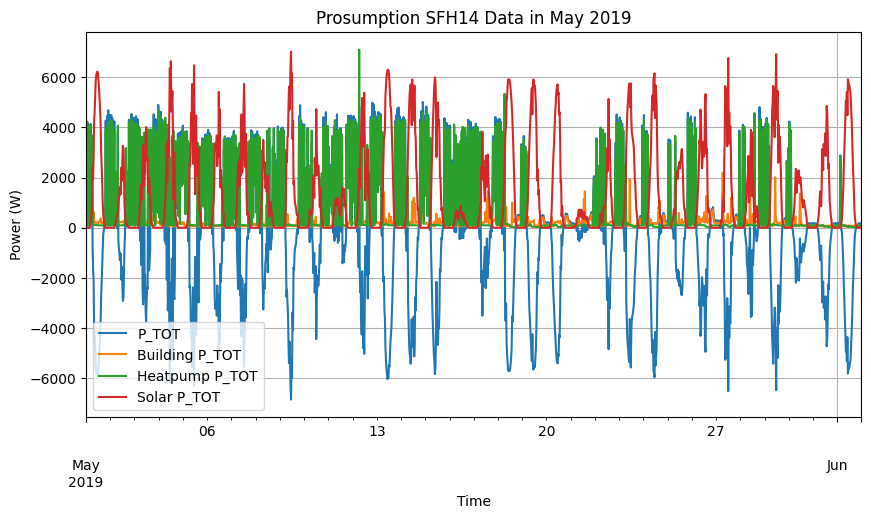

'Train period: 2018-05-20 12:00:00+00:00 to 2019-05-20 12:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-20 12:00:00+00:00 to 2020-05-20 12:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-20 12:00:00+00:00 to 2020-12-31 23:30:00+00:00 contains 225 days 11:30:00'

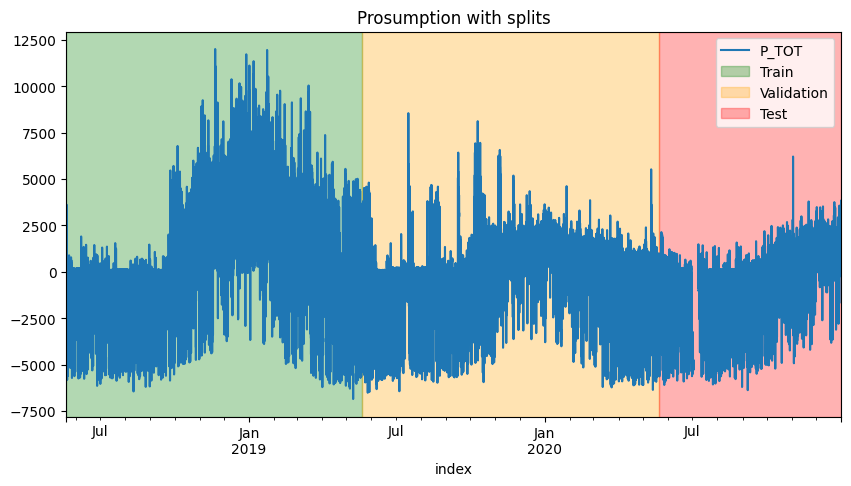

----------------------------------------------------
Calculating prosumption DataFrame for SFH16 with misc_key EAST...
Calculated PV factor for SFH16 with 25 resulting modules and 78 modules in the metadata is 0.32
Prosumption data for SFH16 saved to prosumption_data/30min/prosumption_SFH16_num_pv_modules_25_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH16 with PV factor 0.32051282051282054 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH16_num_pv_modules_25_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45871.000000,45871.000000,45871.000000,45871.000000
mean,-109.552884,257.369788,308.036555,674.959227
std,1401.456233,345.263933,604.225942,1115.455918
min,-5038.223669,41.764889,1.255222,0.000000
25%,-498.028866,97.358083,11.036417,0.000000
50%,144.733389,128.925000,67.102778,17.410969
75%,632.732807,242.644638,474.335637,903.377849
max,13495.170944,3864.200113,12283.683827,5364.757835


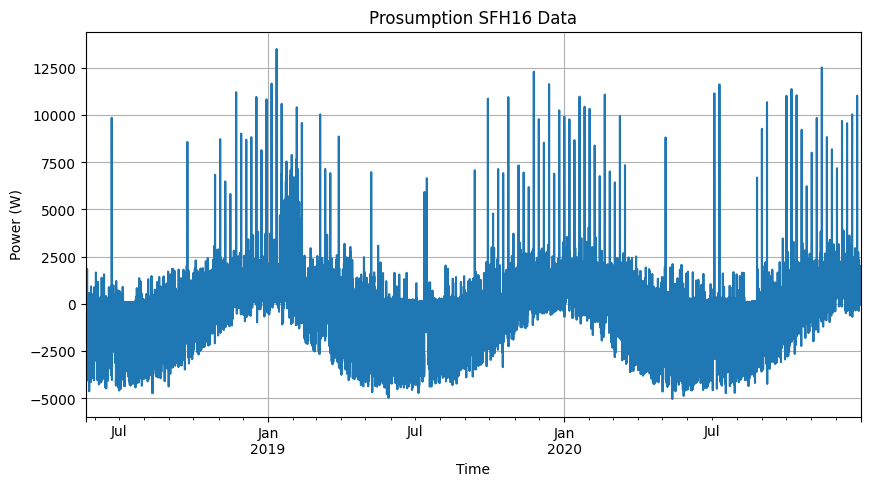

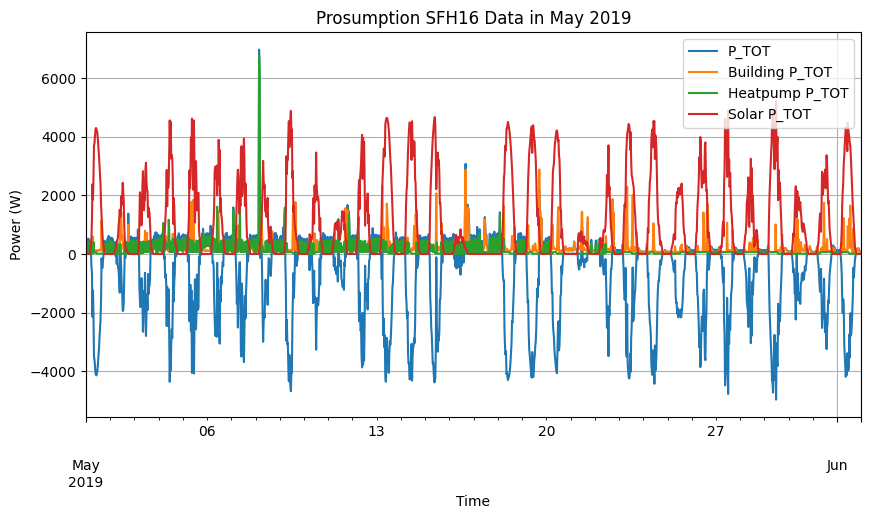

'Train period: 2018-05-21 08:30:00+00:00 to 2019-05-21 08:30:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-21 08:30:00+00:00 to 2020-05-21 08:30:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-21 08:30:00+00:00 to 2020-12-31 23:30:00+00:00 contains 224 days 15:00:00'

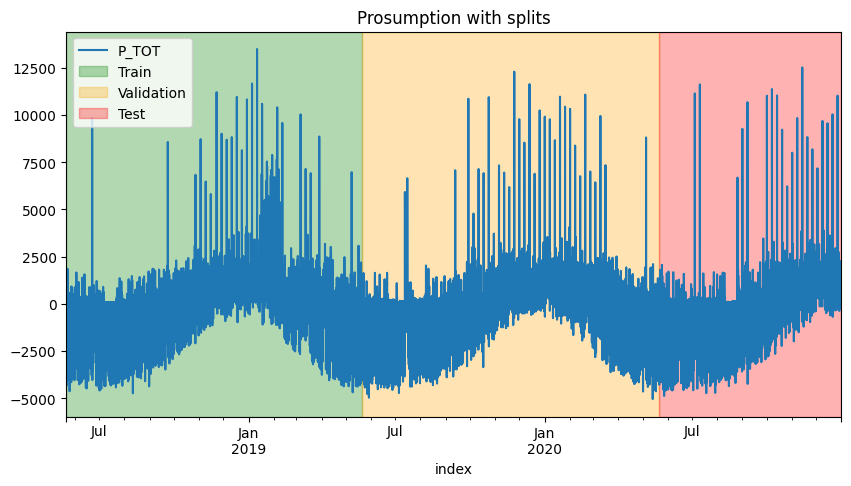

----------------------------------------------------
Calculating prosumption DataFrame for SFH18 with misc_key EAST...
Calculated PV factor for SFH18 with 16 resulting modules and 78 modules in the metadata is 0.21
Prosumption data for SFH18 saved to prosumption_data/30min/prosumption_SFH18_num_pv_modules_16_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH18 with PV factor 0.20512820512820512 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH18_num_pv_modules_16_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45824.000000,45824.000000,45824.000000,45824.000000
mean,113.299357,336.799645,207.894019,431.394307
std,966.817219,426.811609,424.384345,713.184744
min,-3131.005650,61.321667,0.000000,0.000000
25%,-143.647120,122.909014,10.214875,0.000000
50%,168.542250,193.253945,11.661000,11.035897
75%,568.102417,330.205443,292.792986,576.976638
max,7900.274980,5766.855067,6292.738124,3433.445014


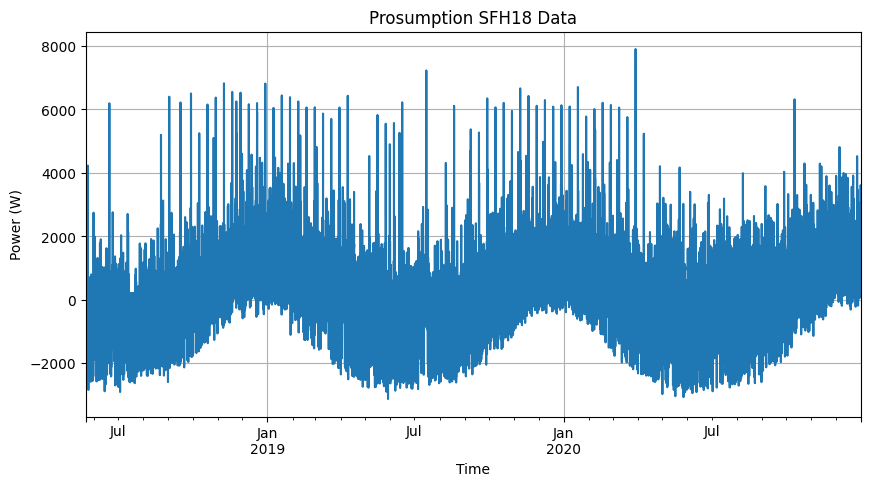

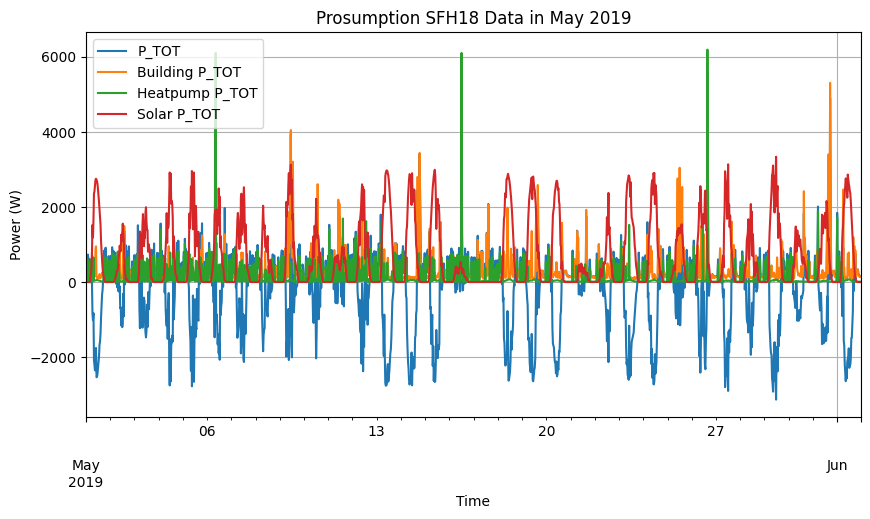

'Train period: 2018-05-22 08:00:00+00:00 to 2019-05-22 08:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-22 08:00:00+00:00 to 2020-05-22 08:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-22 08:00:00+00:00 to 2020-12-31 23:30:00+00:00 contains 223 days 15:30:00'

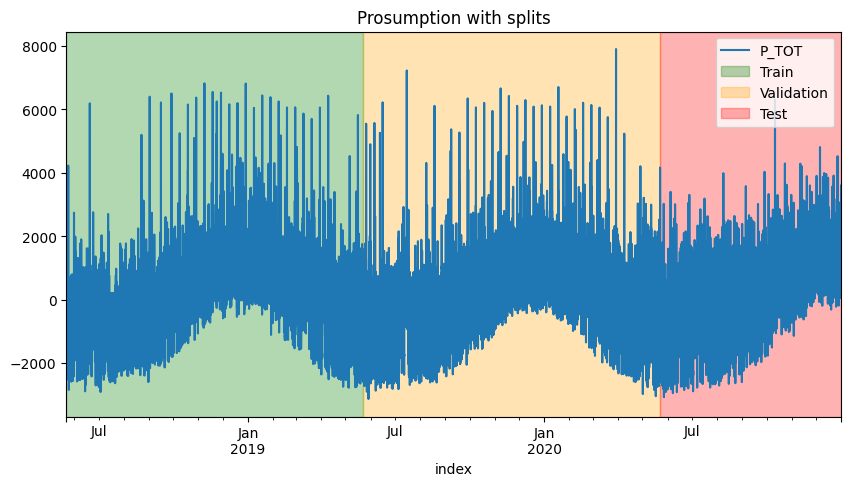

----------------------------------------------------
Calculating prosumption DataFrame for SFH19 with misc_key EAST...
Calculated PV factor for SFH19 with 38 resulting modules and 78 modules in the metadata is 0.49
Prosumption data for SFH19 saved to prosumption_data/30min/prosumption_SFH19_num_pv_modules_38_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH19 with PV factor 0.48717948717948717 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH19_num_pv_modules_38_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45814.000000,45814.000000,45814.000000,45814.000000
mean,-429.748046,366.751706,227.052554,1023.552306
std,1836.990843,322.722878,381.057203,1692.551376
min,-7823.046688,56.024611,0.867111,0.000000
25%,-828.953328,223.265764,10.285778,0.000000
50%,268.629360,283.321333,10.618861,26.009972
75%,586.475029,370.812291,367.294581,1368.627244
max,5963.918656,4642.438218,5962.341225,8154.431909


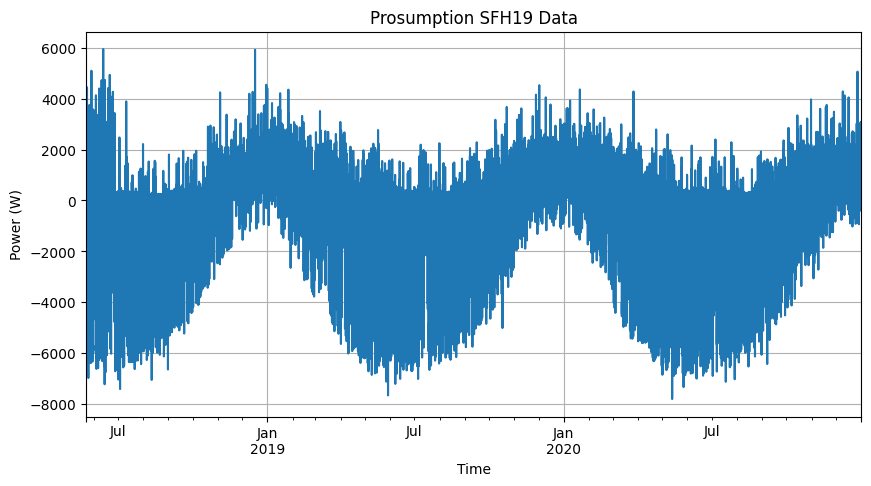

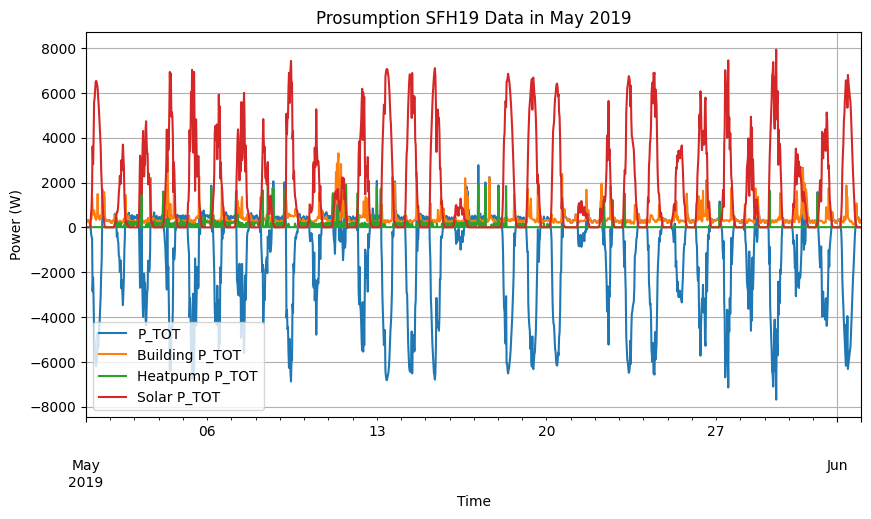

'Train period: 2018-05-22 13:00:00+00:00 to 2019-05-22 13:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-22 13:00:00+00:00 to 2020-05-22 13:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-22 13:00:00+00:00 to 2020-12-31 23:30:00+00:00 contains 223 days 10:30:00'

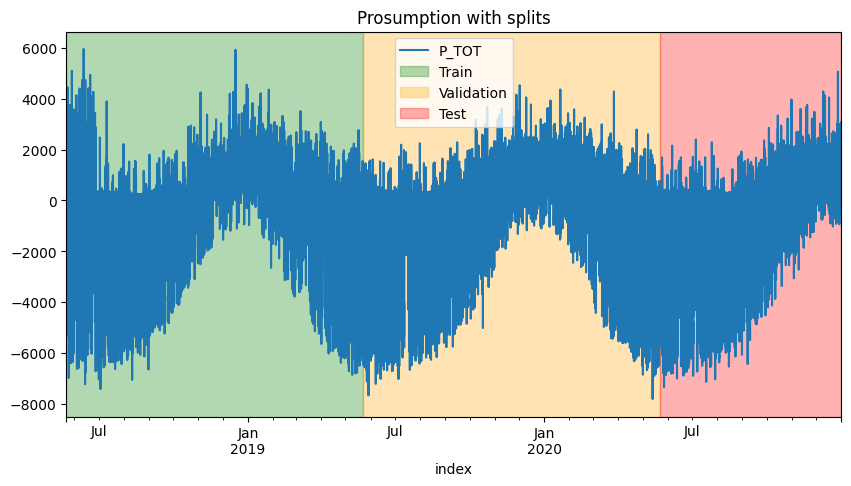

----------------------------------------------------
Calculating prosumption DataFrame for SFH22 with misc_key EAST...
Calculated PV factor for SFH22 with 21 resulting modules and 78 modules in the metadata is 0.27
Prosumption data for SFH22 saved to prosumption_data/30min/prosumption_SFH22_num_pv_modules_21_pv_EAST_hp_1.0.csv
Prosumption DataFrame for SFH22 with PV factor 0.2692307692307692 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH22_num_pv_modules_21_pv_EAST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45490.000000,45490.000000,45490.000000,45490.000000
mean,658.922287,380.065654,841.523466,562.666833
std,1783.226156,345.016368,1237.351462,932.917047
min,-4229.519692,91.523222,0.491333,0.000000
25%,-164.200375,186.490806,11.798264,0.000000
50%,458.170831,255.839778,42.785805,13.446581
75%,1620.953604,436.840083,1337.144428,749.149573
max,8281.236673,4674.299280,6053.042594,4506.396581


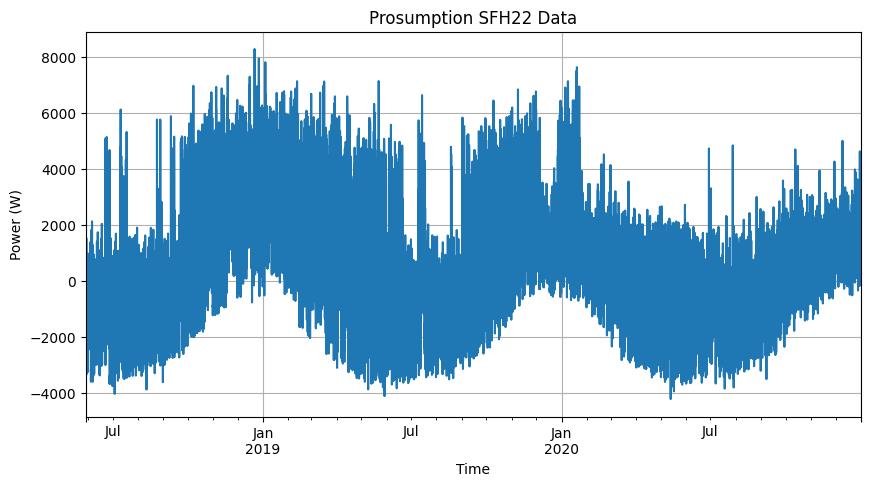

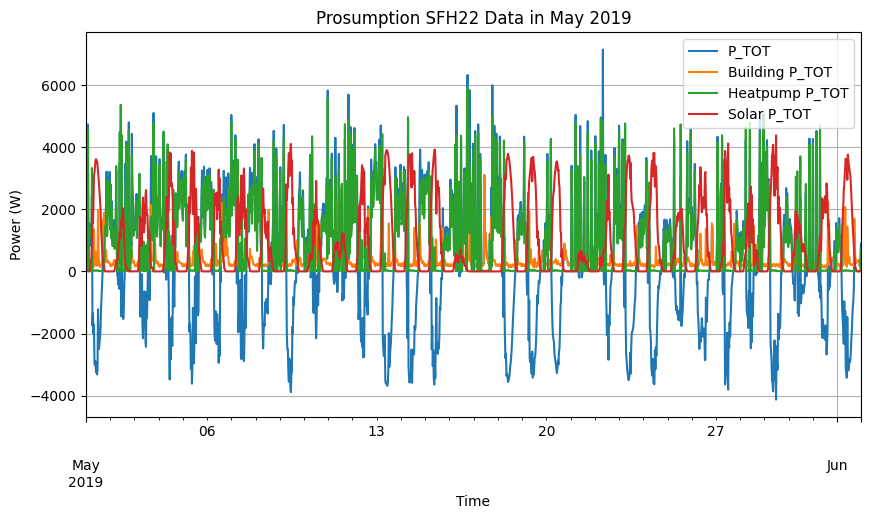

'Train period: 2018-05-29 07:00:00+00:00 to 2019-05-29 07:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-29 07:00:00+00:00 to 2020-05-29 07:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-29 07:00:00+00:00 to 2020-12-31 23:30:00+00:00 contains 216 days 16:30:00'

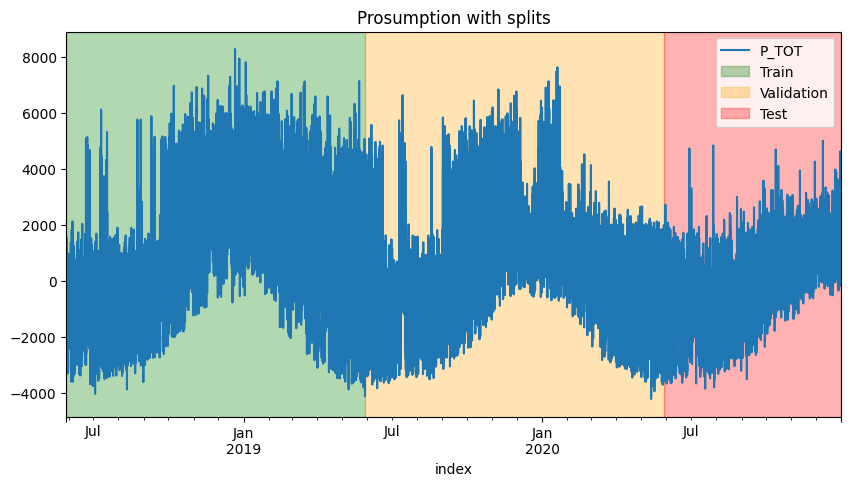

----------------------------------------------------
Calculating prosumption DataFrame for SFH27 with misc_key WEST...
Calculated PV factor for SFH27 with 20 resulting modules and 78 modules in the metadata is 0.26
Prosumption data for SFH27 saved to prosumption_data/30min/prosumption_SFH27_num_pv_modules_20_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH27 with PV factor 0.2564102564102564 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH27_num_pv_modules_20_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45535.000000,45535.000000,45535.000000,45535.000000
mean,-182.848014,126.972780,238.435703,548.256496
std,1040.060278,117.732174,367.133196,898.705576
min,-4293.778328,33.811611,0.542222,0.000000
25%,-451.392217,79.977472,11.316611,0.000000
50%,108.252889,102.592611,168.642335,19.366097
75%,388.120667,129.396167,311.695251,747.353989
max,6026.079681,1786.814896,5944.302181,4359.746439


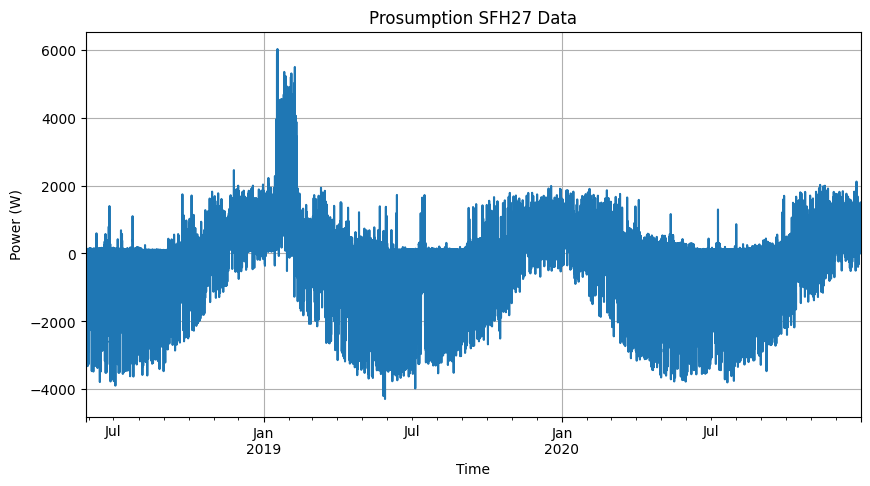

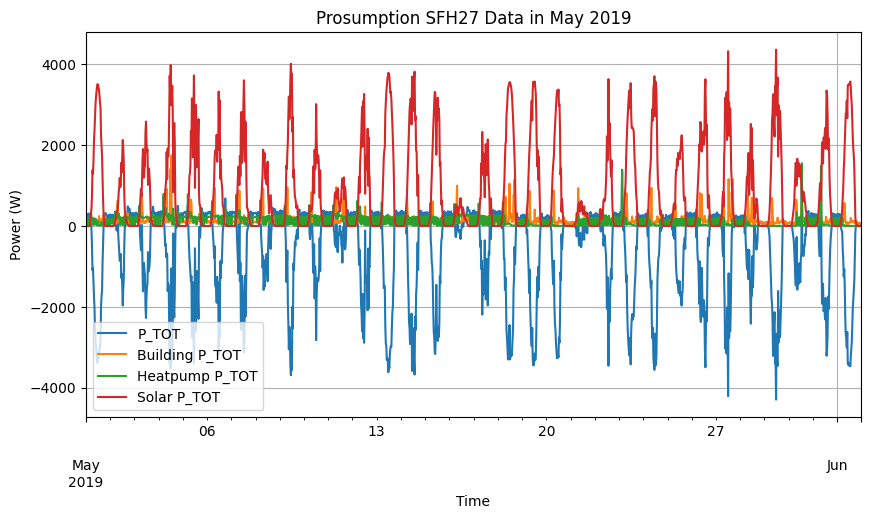

'Train period: 2018-05-28 08:30:00+00:00 to 2019-05-28 08:30:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-28 08:30:00+00:00 to 2020-05-28 08:30:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-28 08:30:00+00:00 to 2020-12-31 23:30:00+00:00 contains 217 days 15:00:00'

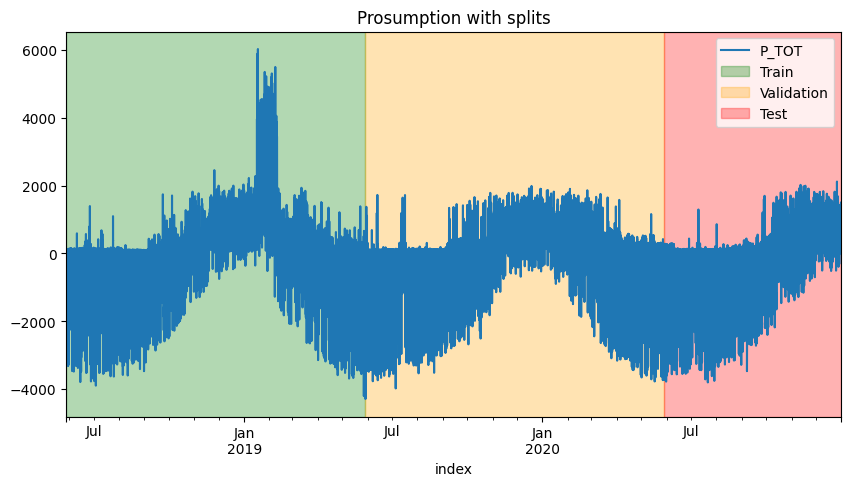

----------------------------------------------------
Calculating prosumption DataFrame for SFH28 with misc_key WEST...
Calculated PV factor for SFH28 with 27 resulting modules and 78 modules in the metadata is 0.35
Prosumption data for SFH28 saved to prosumption_data/30min/prosumption_SFH28_num_pv_modules_27_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH28 with PV factor 0.34615384615384615 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH28_num_pv_modules_27_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45526.000000,45526.000000,45526.000000,45526.000000
mean,246.428229,358.267300,627.643146,739.482217
std,1742.936558,360.523034,1010.846205,1212.437421
min,-5662.123923,25.698556,0.000000,0.000000
25%,-295.562127,144.843597,10.707236,0.000000
50%,219.016514,203.086778,21.057444,26.107692
75%,1198.592830,473.547388,1158.803451,1008.283173
max,7660.679404,3644.628060,6064.906786,5885.657692


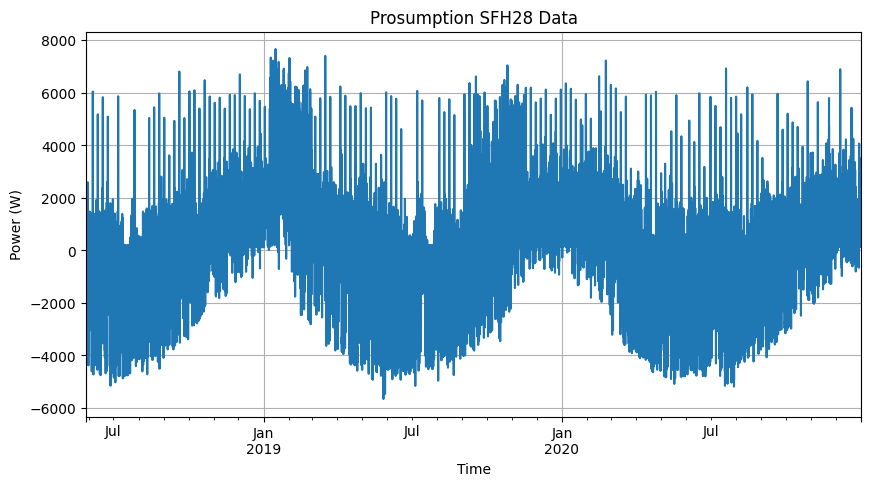

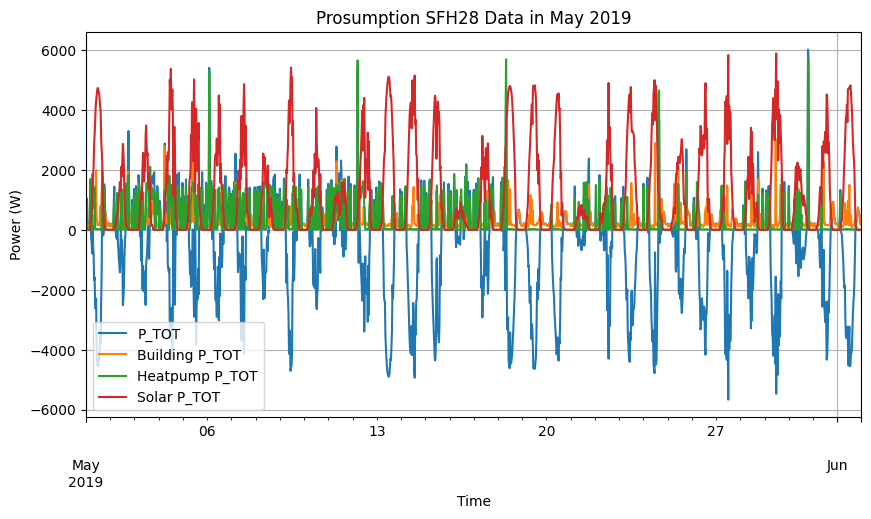

'Train period: 2018-05-28 13:00:00+00:00 to 2019-05-28 13:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-28 13:00:00+00:00 to 2020-05-28 13:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-28 13:00:00+00:00 to 2020-12-31 23:30:00+00:00 contains 217 days 10:30:00'

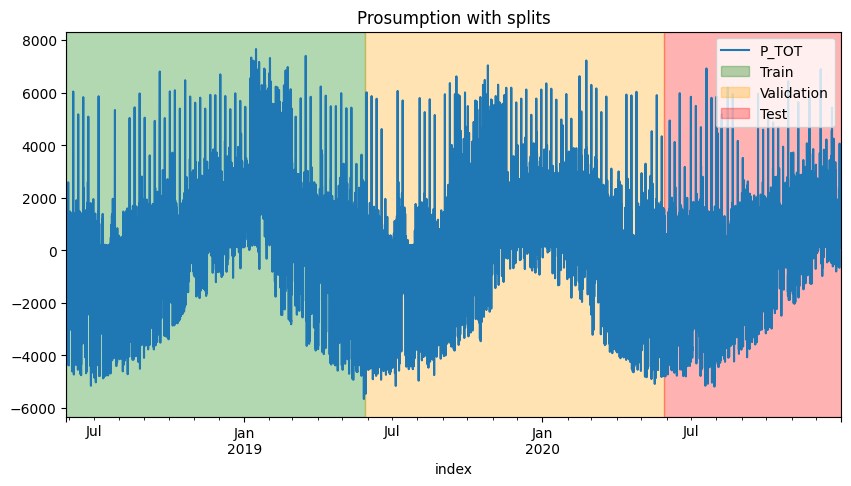

----------------------------------------------------
Calculating prosumption DataFrame for SFH29 with misc_key WEST...
Calculated PV factor for SFH29 with 19 resulting modules and 78 modules in the metadata is 0.24
Prosumption data for SFH29 saved to prosumption_data/30min/prosumption_SFH29_num_pv_modules_19_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH29 with PV factor 0.24358974358974358 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH29_num_pv_modules_19_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45490.000000,45490.000000,45490.000000,45490.000000
mean,-69.723474,162.039855,288.560367,520.323696
std,1127.648251,191.350103,531.319131,853.200437
min,-3957.598006,2.348278,0.000000,0.000000
25%,-457.708367,89.400903,11.505722,0.000000
50%,140.696389,111.941278,60.926222,18.316595
75%,497.316515,153.416639,391.120209,709.492005
max,7105.550096,3154.164669,5876.250000,4141.759117


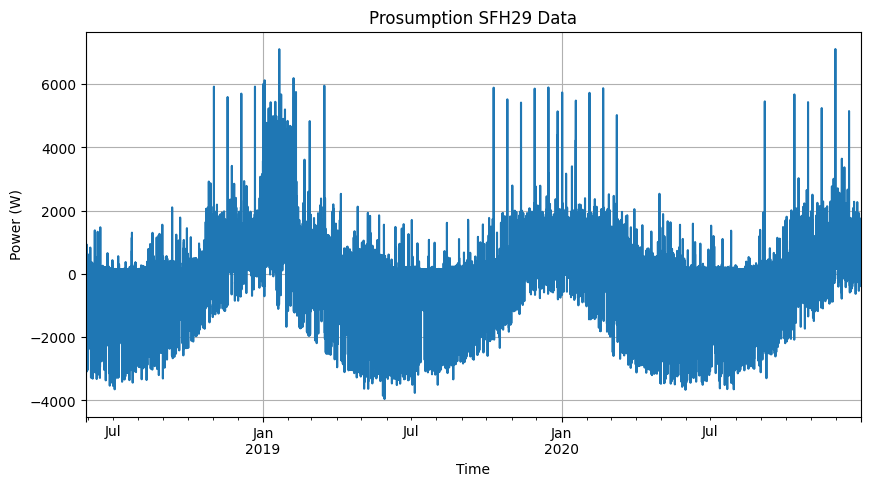

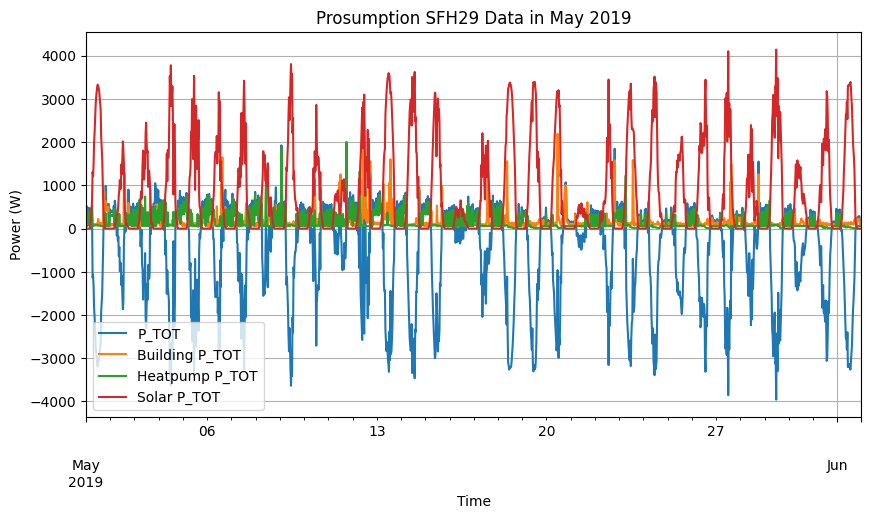

'Train period: 2018-05-29 07:00:00+00:00 to 2019-05-29 07:00:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-29 07:00:00+00:00 to 2020-05-29 07:00:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-29 07:00:00+00:00 to 2020-12-31 23:30:00+00:00 contains 216 days 16:30:00'

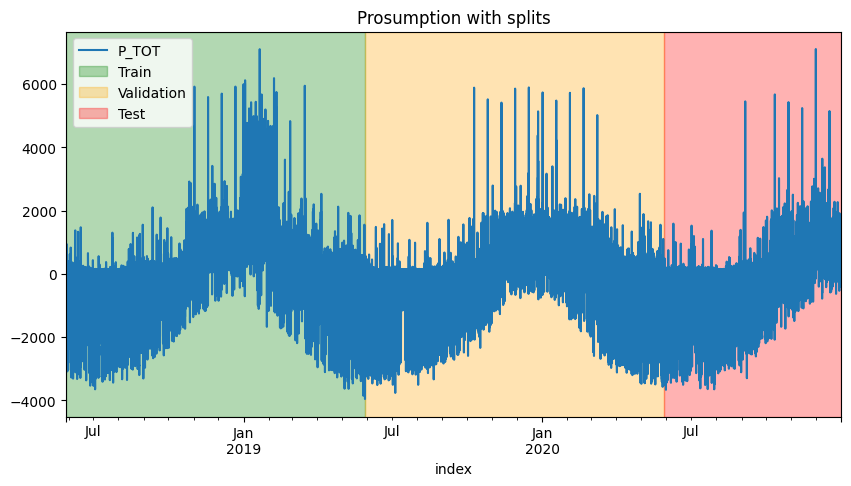

----------------------------------------------------
Calculating prosumption DataFrame for SFH30 with misc_key WEST...
Calculated PV factor for SFH30 with 18 resulting modules and 78 modules in the metadata is 0.23
Prosumption data for SFH30 saved to prosumption_data/30min/prosumption_SFH30_num_pv_modules_18_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH30 with PV factor 0.23076923076923078 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH30_num_pv_modules_18_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45483.000000,45483.000000,45483.000000,45483.000000
mean,-77.706119,251.842523,163.134184,492.682826
std,979.968211,285.104148,436.800497,808.077222
min,-3755.843517,26.257611,0.603722,0.000000
25%,-301.140726,92.053056,10.749722,0.000000
50%,97.663333,160.556611,11.259667,17.296154
75%,274.934041,276.627805,52.619111,671.884615
max,7628.344996,3592.713214,6055.589228,3923.771795


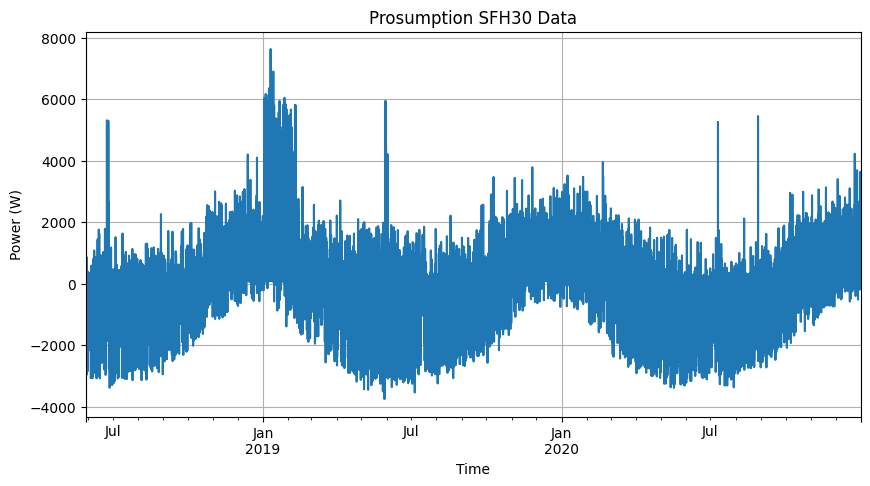

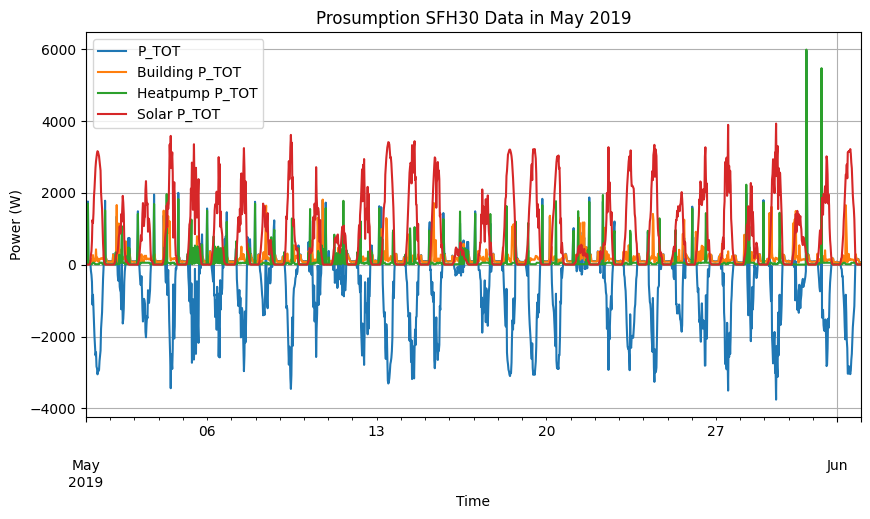

'Train period: 2018-05-29 10:30:00+00:00 to 2019-05-29 10:30:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-05-29 10:30:00+00:00 to 2020-05-29 10:30:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-05-29 10:30:00+00:00 to 2020-12-31 23:30:00+00:00 contains 216 days 13:00:00'

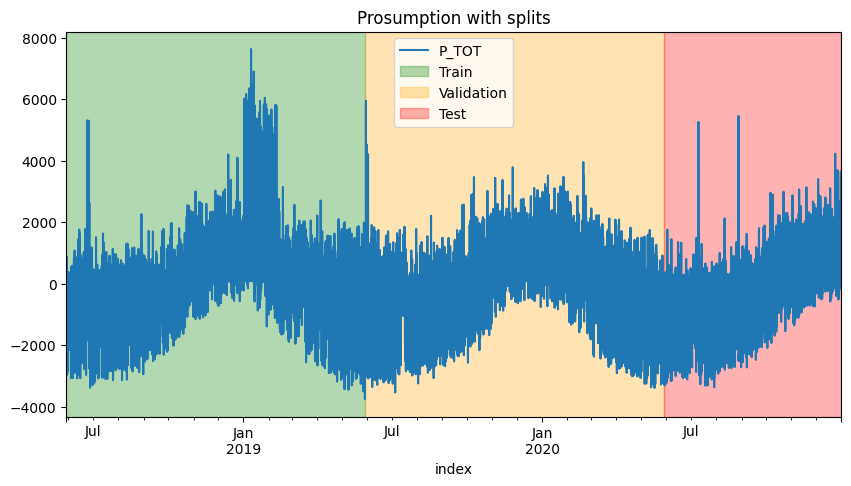

----------------------------------------------------
Calculating prosumption DataFrame for SFH32 with misc_key WEST...
Calculated PV factor for SFH32 with 30 resulting modules and 78 modules in the metadata is 0.38
Prosumption data for SFH32 saved to prosumption_data/30min/prosumption_SFH32_num_pv_modules_30_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH32 with PV factor 0.38461538461538464 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH32_num_pv_modules_30_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45245.000000,45245.000000,45245.000000,45245.000000
mean,-204.239957,306.071951,308.757613,819.069521
std,1526.222702,353.077082,526.693244,1345.454752
min,-6328.825102,45.494167,0.953000,0.000000
25%,-526.830897,128.063722,37.156111,0.000000
50%,214.566666,209.341833,91.933222,28.143162
75%,579.085515,355.845333,397.296003,1113.679487
max,8037.779549,5167.525289,6446.310365,6539.619658


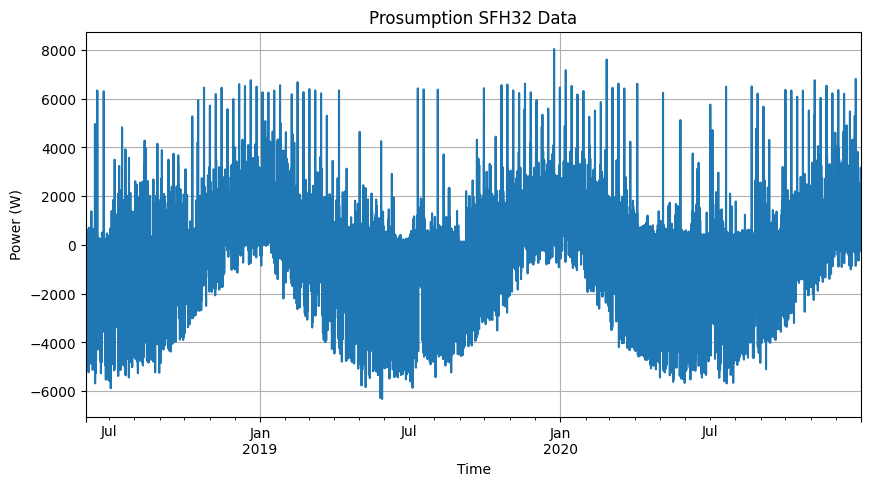

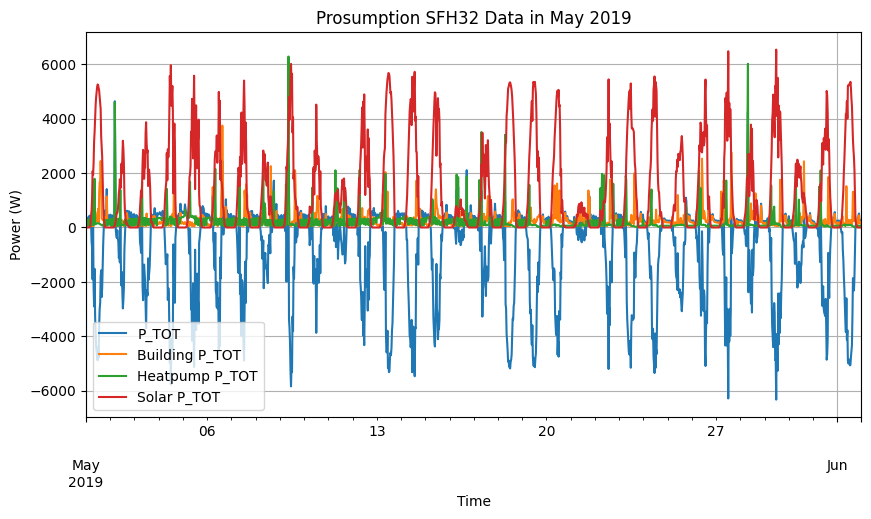

'Train period: 2018-06-03 09:30:00+00:00 to 2019-06-03 09:30:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-06-03 09:30:00+00:00 to 2020-06-03 09:30:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-06-03 09:30:00+00:00 to 2020-12-31 23:30:00+00:00 contains 211 days 14:00:00'

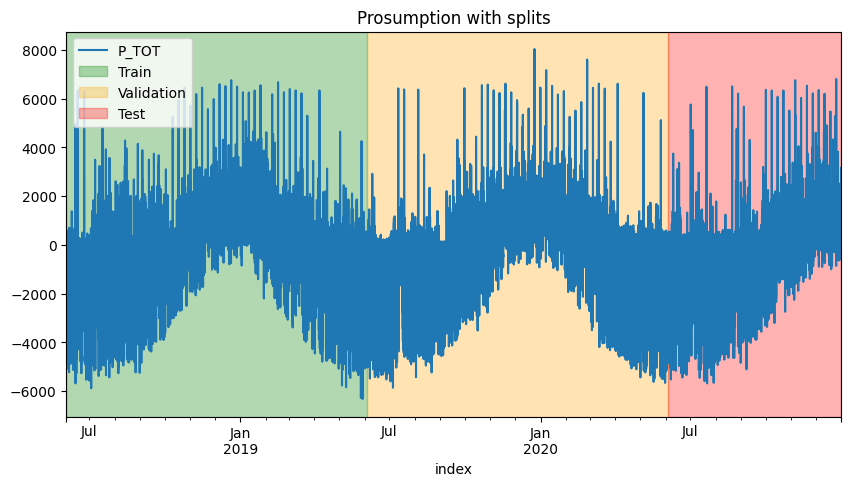

----------------------------------------------------
Calculating prosumption DataFrame for SFH36 with misc_key WEST...
Calculated PV factor for SFH36 with 20 resulting modules and 78 modules in the metadata is 0.26
Prosumption data for SFH36 saved to prosumption_data/30min/prosumption_SFH36_num_pv_modules_20_pv_WEST_hp_1.0.csv
Prosumption DataFrame for SFH36 with PV factor 0.2564102564102564 and Heatpump factor 1.0 saved to prosumption_data/30min/prosumption_SFH36_num_pv_modules_20_pv_WEST_hp_1.0.csv


,P_TOT,Building P_TOT,Heatpump P_TOT,Solar P_TOT
count,45097.000000,45097.000000,45097.000000,45097.000000
mean,42.670123,313.923807,273.148329,544.402013
std,1154.037533,313.022291,621.466039,895.416344
min,-4124.588383,53.431944,0.896444,0.000000
25%,-247.426905,142.615722,11.301333,0.000000
50%,191.765167,229.136611,58.978445,18.370370
75%,462.121554,325.552499,249.046831,738.169516
max,10234.411945,5198.444154,5931.963498,4359.746439


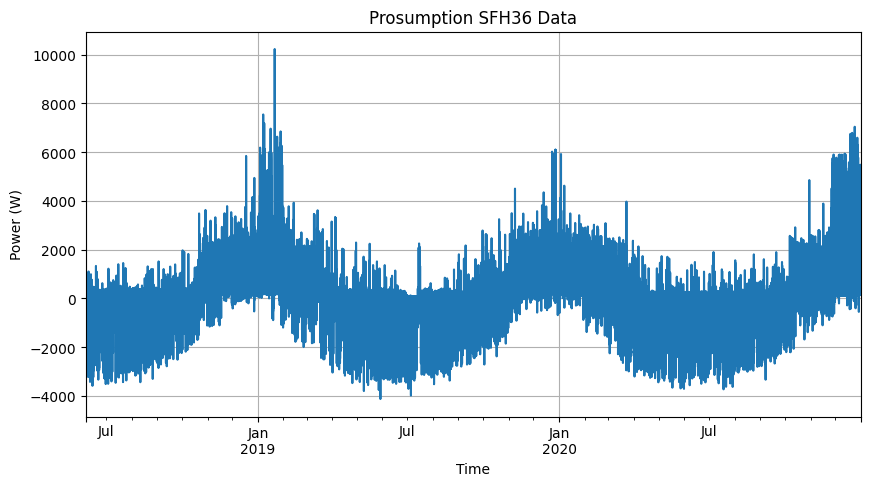

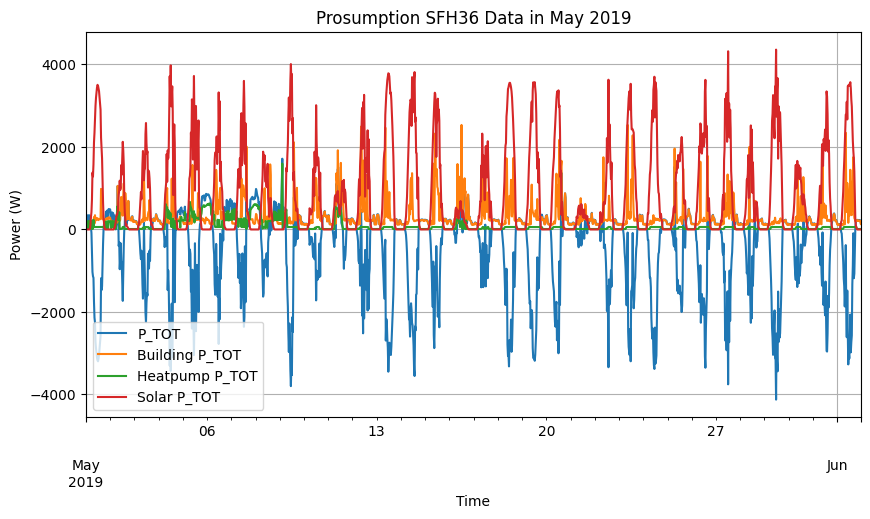

'Train period: 2018-06-06 11:30:00+00:00 to 2019-06-06 11:30:00+00:00  contains 365 days 00:00:00'

'Validation period: 2019-06-06 11:30:00+00:00 to 2020-06-06 11:30:00+00:00  contains 366 days 00:00:00'

'Test period: 2020-06-06 11:30:00+00:00 to 2020-12-31 23:30:00+00:00 contains 208 days 12:00:00'

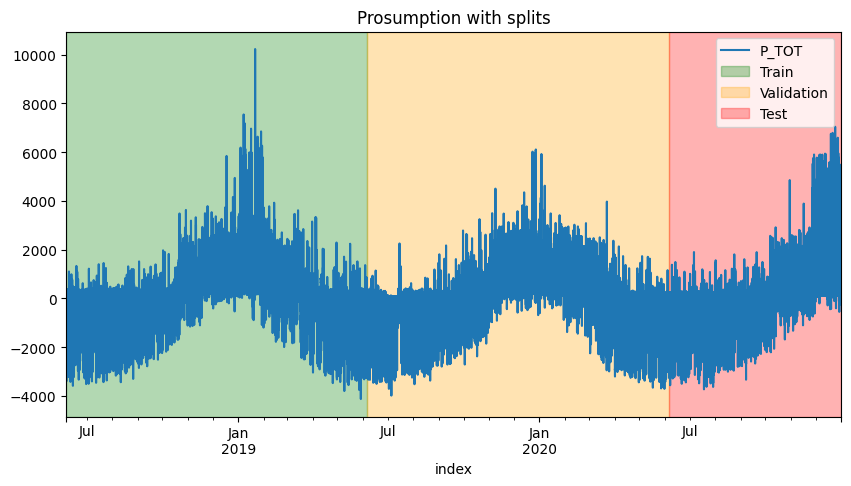

: 

In [ ]:
# 30 min data

# BEWARE THE META DATA FOR 15 min is used

for sfh in south_facing:
    calculate_and_save_prosumption(building_data=building_data_30min, heatpump_data=heatpump_data_30min, misc_data=misc_data_30min, meta_data=meta_houshold_data_15min, meta_solar_data=meta_solar_data, building_name=sfh , misc_key='SOUTH',  heatpump_factor=1.0, verbose=True)
for sfh in east_facing:
    calculate_and_save_prosumption(building_data=building_data_30min, heatpump_data=heatpump_data_30min, misc_data=misc_data_30min,  meta_data=meta_houshold_data_15min, meta_solar_data=meta_solar_data, building_name=sfh , misc_key='EAST',  heatpump_factor=1.0, verbose=True)
for sfh in west_facing:
    calculate_and_save_prosumption(building_data=building_data_30min, heatpump_data=heatpump_data_30min, misc_data=misc_data_30min,  meta_data=meta_houshold_data_15min, meta_solar_data=meta_solar_data, building_name=sfh , misc_key='WEST',  heatpump_factor=1.0, verbose=True)